In [1]:
import prior

dataset = prior.load_dataset("procthor-10k")
dataset

[AI2-THOR WARNING] There has been an update to ProcTHOR-10K that must be used with AI2-THOR version 5.0+. To use the new version of ProcTHOR-10K, please update AI2-THOR to version 5.0+ by running:
    pip install --upgrade ai2thor
Alternatively, to downgrade to the old version of ProcTHOR-10K, run:
   prior.load_dataset("procthor-10k", revision="ab3cacd0fc17754d4c080a3fd50b18395fae8647")


Loading test: 100%|██████████| 1000/1000 [00:00<00:00, 11989.62it/s]


DatasetDict(
    train=Dataset(
    dataset=procthor-dataset,
    size=10000,
    split=train
),
    val=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=val
),
    test=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=test
)
)

In [2]:
from ai2thor.controller import Controller


house = dataset["train"][3]
controller = Controller(scene=house, snapToGrid=False, rotateStepDegrees=30)
event = controller.step("Pass")
spawn = event.metadata["agent"]["position"]

/home/juyuanli/miniconda3/envs/nav_assistant/lib/python3.11/site-packages/ai2thor/platform.py:154: UserWarning: could not connect to X Display: 5, Can't connect to display ":5": b'Authorization required, but no authorization protocol specified\n'
  warnings.warn(


In [3]:
import numpy as np
def teleport(controller, target=None):
    event = controller.step("GetReachablePositions")
    reachable_positions = event.metadata["actionReturn"]
    # Pick a random target
    if target is None:
        target = np.random.choice(reachable_positions)

    event = controller.step(
        action="TeleportFull",
        x=target["x"],
        y=target["y"],
        z=target["z"],
        rotation={"x": 0, "y": 0, "z": 0},
        horizon=0,
        standing=True
    )

    return event


In [4]:
from rl import PPO, ActorCritic, Env, RolloutBuffer, ClipEnv, CLIPNovelty
from models import LSTMActor, LSTMCritic, FrozenResNetEncoder, SlidingWindowTransformerActor, SlidingWindowTransformerCritic
from cons import MINIBATCHES, EPISODE_STEPS, FEAT_DIM, NUM_ACTIONS, DEVICE

In [5]:
import torch
import matplotlib.pyplot as plt
from rl import save_actor_critic

def train(controller, name: str, ppo: PPO, env: Env, actor_critic: ActorCritic, total_updates=10):
    event = controller.step("Pass")  # prime
    rewards = []
    episode_rewards = []
    for upd in range(total_updates):
        buf = RolloutBuffer()
        for mb in range(MINIBATCHES):
            # collect episodes
            episode_seq = []
            episode_reward = 0
            actions_seq = []
            for t in range(1, EPISODE_STEPS + 1):
                with torch.no_grad():
                    obs_t = ppo.obs_from_event(event)  # (C,H,W)
                    obs_encoded = actor_critic.actor_critic_encoder(obs_t.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0) # (D)
                    obs_seq = torch.stack(episode_seq + [obs_encoded], dim=0).to(device=DEVICE)

                if len(actions_seq) == 0:
                    actions_seq.append(torch.randint(0, NUM_ACTIONS, (1, 1)).item())
                
                actions_tensor = torch.tensor(actions_seq, dtype=torch.long, device=DEVICE)
                logits, value = ppo.act_and_value(obs_seq, actions_tensor, actor_critic)
                dist = torch.distributions.Categorical(logits=logits)
                action_idx = dist.sample()
                logp = dist.log_prob(action_idx)
                
                action_idx, logp = action_idx.item(), logp.item()
                event, reward = env.step_env(controller, action_idx)
                done = t == EPISODE_STEPS

                # store one step
                buf.add(obs_t, action_idx, logp, reward, value, done)
                episode_seq.append(obs_encoded)
                rewards.append(reward)
                actions_seq.append(action_idx)
                
                episode_reward += reward / EPISODE_STEPS

                # 50% chance of teleport
                if done:
                    env.reset()
                    if np.random.rand() > 0.5:
                        event = teleport(controller)
            episode_rewards.append(episode_reward)
                
        ppo.ppo_update(buf, actor_critic)
        if (upd + 1) % 10 == 0:
            save_actor_critic(actor_critic, f"chkpoint_{upd}.pt")
        save_actor_critic(actor_critic, name)
        
        print(f"Update {upd+1}/{total_updates} — steps: {len(buf)}")
        plt.plot(rewards)
        plt.show()
        plt.plot(episode_rewards)
        plt.show()
    return buf, rewards

In [6]:
ENTROPY_COEF = 0.05

ppo = PPO(ENTROPY_COEF)
encoder = FrozenResNetEncoder()
actor = SlidingWindowTransformerActor(FEAT_DIM, NUM_ACTIONS)
critic = SlidingWindowTransformerCritic(FEAT_DIM)
clip_novelty = CLIPNovelty()
clip_env = ClipEnv(clip_novelty)
clip_actor_critic = ActorCritic(encoder, actor, critic)


[PPO] Epoch 0: Loss=85.0907, Policy=0.0077, Value=170.2718
[PPO] Epoch 10: Loss=61.3136, Policy=0.0247, Value=122.6748
[PPO] Epoch 20: Loss=46.6555, Policy=0.0070, Value=93.4037
[PPO] Epoch 30: Loss=38.7652, Policy=-0.0090, Value=77.6530
Approx KL Learned: 0.012329408898949623
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 1/100 — steps: 2048


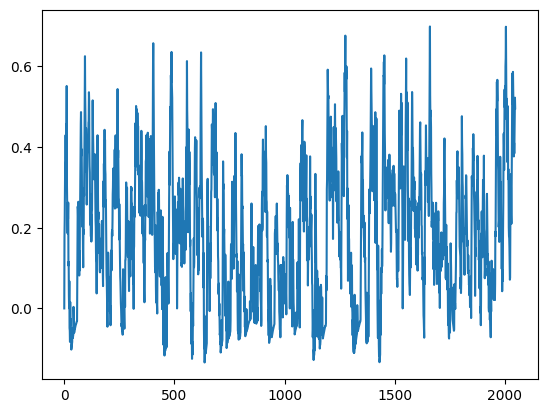

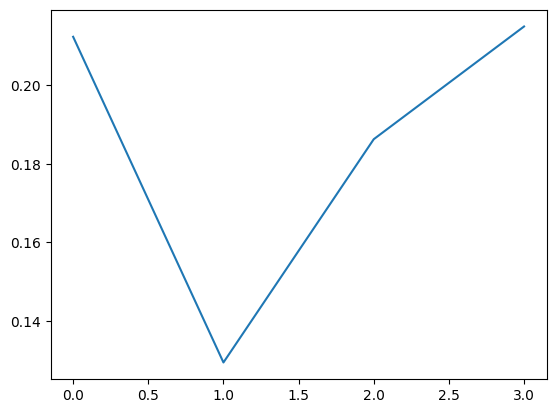

[PPO] Epoch 0: Loss=93.1517, Policy=0.0069, Value=186.3934
[PPO] Epoch 10: Loss=73.2800, Policy=-0.0012, Value=146.6634
[PPO] Epoch 20: Loss=60.5987, Policy=-0.0078, Value=121.3154
[PPO] Epoch 30: Loss=51.5958, Policy=-0.0083, Value=103.3100
Approx KL Learned: 0.01000478770583868
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 2/100 — steps: 2048


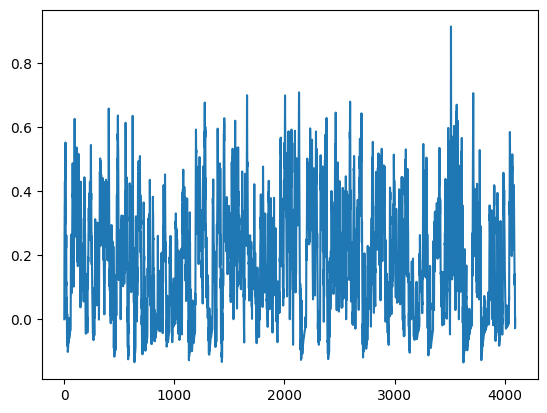

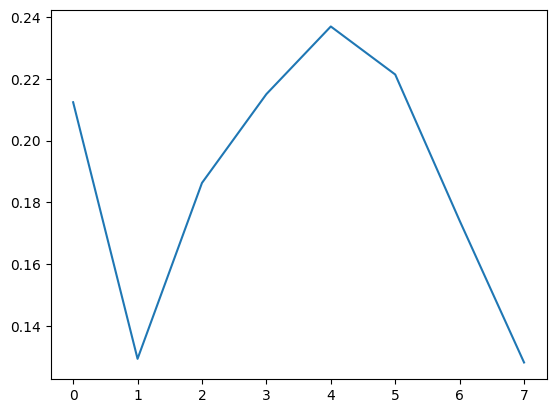

[PPO] Epoch 0: Loss=85.2516, Policy=0.0011, Value=170.6040
[PPO] Epoch 10: Loss=64.1817, Policy=-0.0032, Value=128.4713
[PPO] Epoch 20: Loss=50.0692, Policy=-0.0098, Value=100.2599
[PPO] Epoch 30: Loss=48.2801, Policy=-0.0146, Value=96.6915
Approx KL Learned: 0.013778191059827805
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 3/100 — steps: 2048


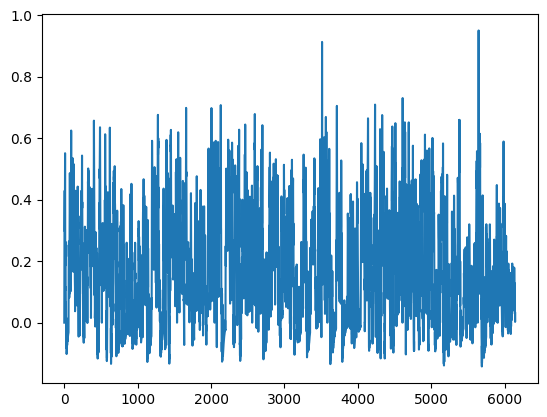

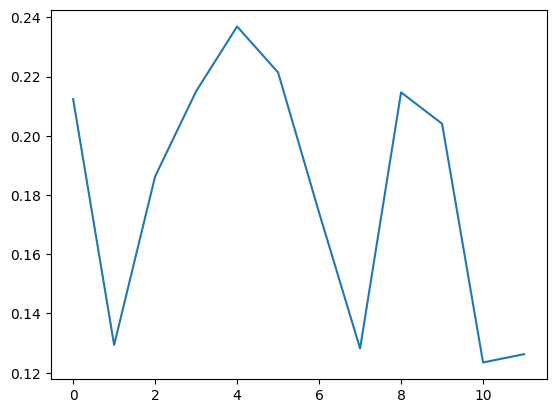

[PPO] Epoch 0: Loss=73.0638, Policy=0.0036, Value=146.2199
[PPO] Epoch 10: Loss=62.7732, Policy=-0.0042, Value=125.6523
[PPO] Epoch 20: Loss=50.5625, Policy=-0.0071, Value=101.2382
[PPO] Epoch 30: Loss=43.7024, Policy=-0.0187, Value=87.5409
Approx KL Learned: 0.012211292050778866
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 4/100 — steps: 2048


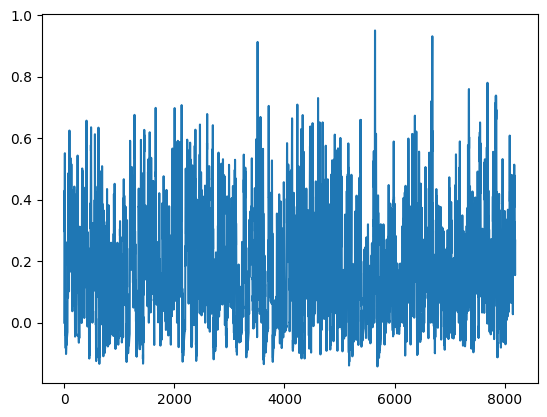

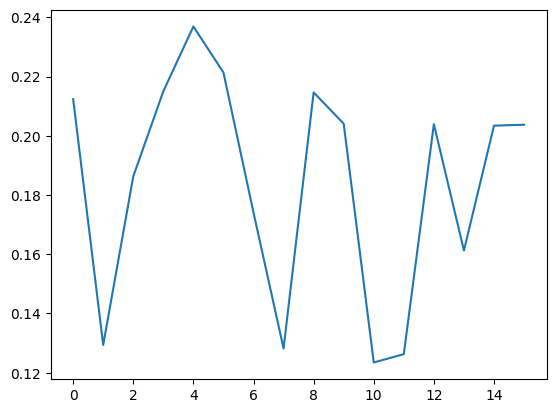

[PPO] Epoch 0: Loss=75.9621, Policy=0.0045, Value=152.0134
[PPO] Epoch 10: Loss=60.6902, Policy=-0.0056, Value=121.4859
[PPO] Epoch 20: Loss=41.7123, Policy=-0.0086, Value=83.5400
[PPO] Epoch 30: Loss=45.4575, Policy=-0.0190, Value=91.0484
Approx KL Learned: 0.01336305309087038
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 5/100 — steps: 2048


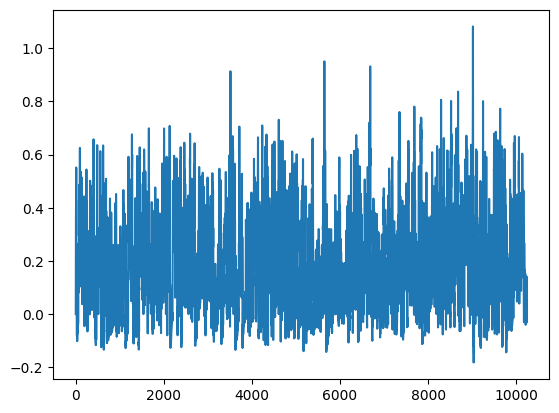

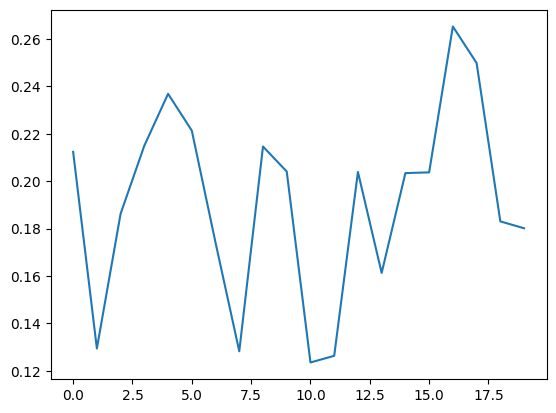

[PPO] Epoch 0: Loss=76.6122, Policy=0.0081, Value=153.3036
[PPO] Epoch 10: Loss=55.5234, Policy=-0.0046, Value=111.1493
[PPO] Epoch 20: Loss=45.0455, Policy=-0.0120, Value=90.2061
[PPO] Epoch 30: Loss=36.8071, Policy=-0.0076, Value=73.7171
Approx KL Learned: 0.029222708195447922
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 6/100 — steps: 2048


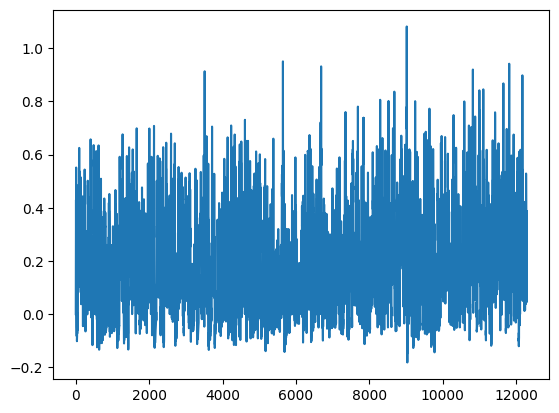

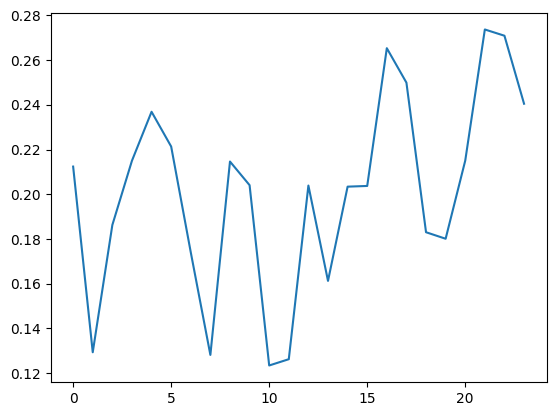

[PPO] Epoch 0: Loss=62.6966, Policy=0.0045, Value=125.4712
[PPO] Epoch 10: Loss=42.9106, Policy=-0.0028, Value=85.9132
[PPO] Epoch 20: Loss=37.8524, Policy=-0.0082, Value=75.8077
[PPO] Epoch 30: Loss=35.1775, Policy=-0.0151, Value=70.4704
Approx KL Learned: 0.04779941588640213
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 7/100 — steps: 2048


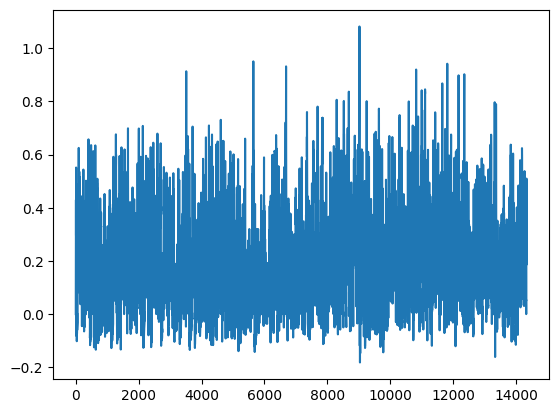

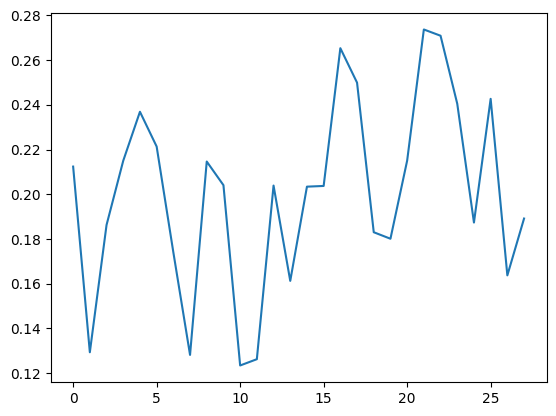

[PPO] Epoch 0: Loss=45.7047, Policy=-0.0003, Value=91.4996
[PPO] Epoch 10: Loss=34.2640, Policy=-0.0077, Value=68.6337
[PPO] Epoch 20: Loss=34.3044, Policy=-0.0223, Value=68.7422
[PPO] Epoch 30: Loss=27.8368, Policy=-0.0306, Value=55.8252
Approx KL Learned: 0.02666977420449257
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 8/100 — steps: 2048


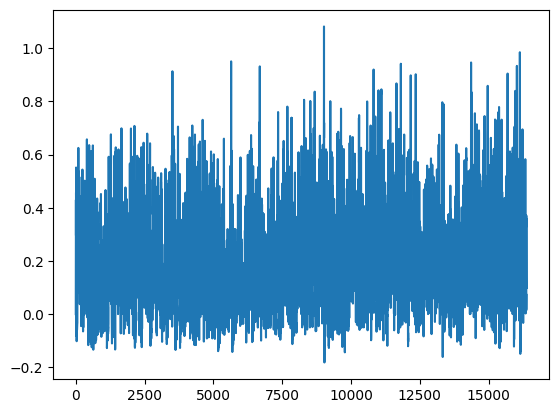

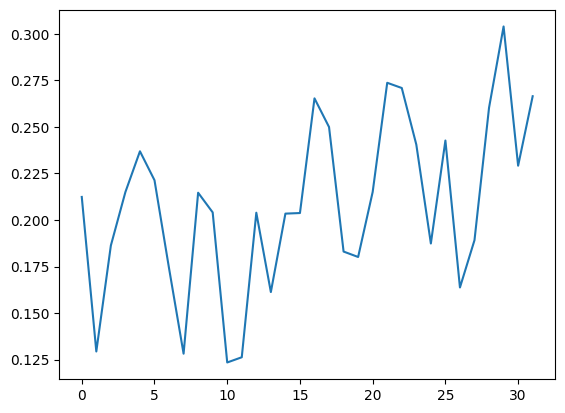

[PPO] Epoch 0: Loss=72.6329, Policy=-0.0037, Value=145.3634
[PPO] Epoch 10: Loss=54.4584, Policy=-0.0073, Value=109.0219
[PPO] Epoch 20: Loss=43.5158, Policy=-0.0242, Value=87.1680
[PPO] Epoch 30: Loss=38.4482, Policy=-0.0304, Value=77.0460
Approx KL Learned: 0.026864513754844666
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 9/100 — steps: 2048


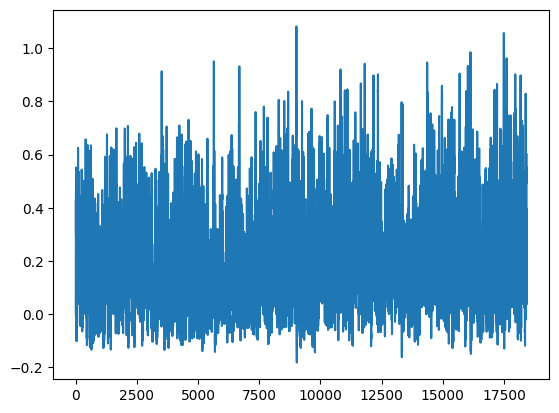

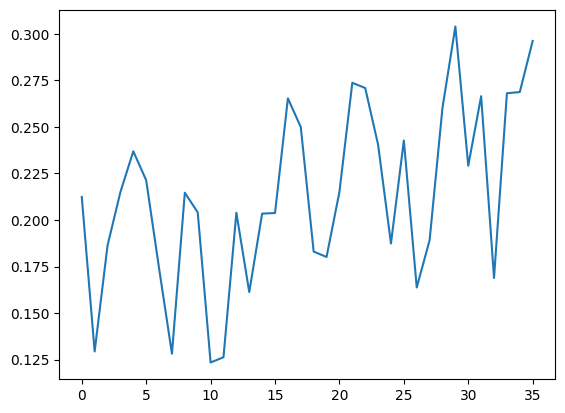

[PPO] Epoch 0: Loss=73.3163, Policy=-0.0006, Value=146.7202
[PPO] Epoch 10: Loss=52.8966, Policy=-0.0130, Value=105.9064
[PPO] Epoch 20: Loss=43.3223, Policy=-0.0177, Value=86.7667
[PPO] Epoch 30: Loss=37.4990, Policy=-0.0285, Value=75.1418
Approx KL Learned: 0.02826603502035141
[✅] Actor-Critic checkpoint saved to chkpoint_9.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 10/100 — steps: 2048


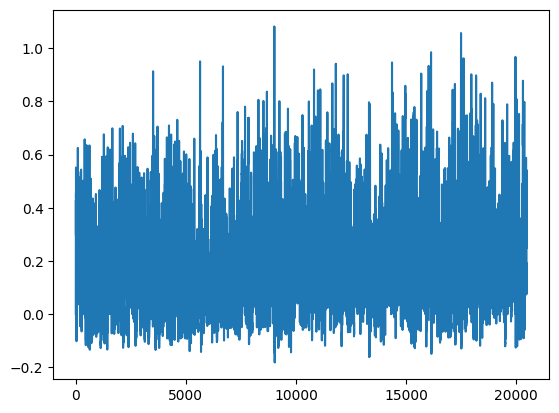

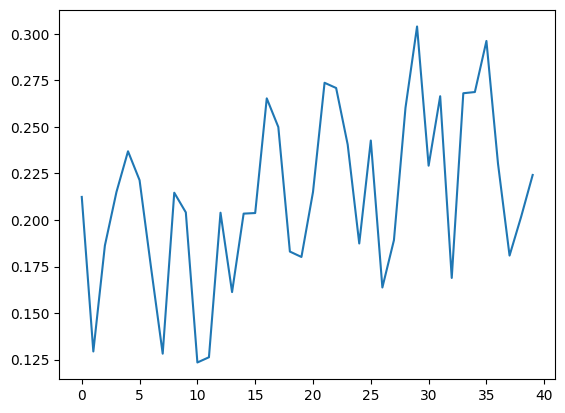

[PPO] Epoch 0: Loss=63.9522, Policy=0.0038, Value=127.9790
[PPO] Epoch 10: Loss=54.8852, Policy=-0.0076, Value=109.8668
[PPO] Epoch 20: Loss=44.6336, Policy=-0.0246, Value=89.3983
[PPO] Epoch 30: Loss=37.4189, Policy=-0.0324, Value=74.9824
Approx KL Learned: 0.011068960651755333
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 11/100 — steps: 2048


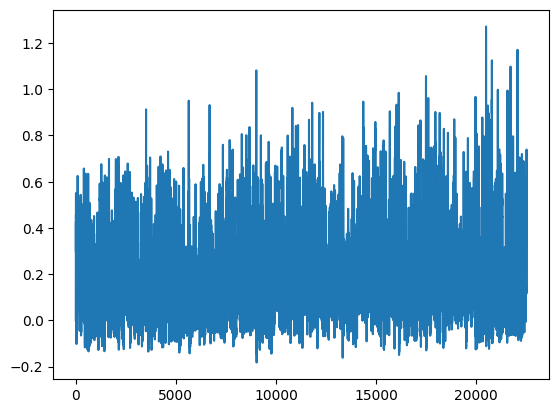

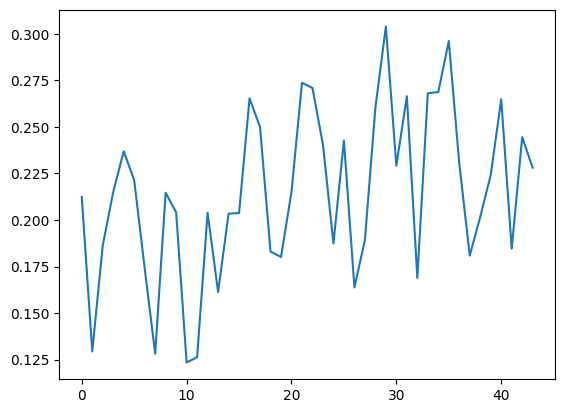

[PPO] Epoch 0: Loss=75.9358, Policy=0.0050, Value=151.9431
[PPO] Epoch 10: Loss=50.4199, Policy=-0.0049, Value=100.9304
[PPO] Epoch 20: Loss=41.0324, Policy=-0.0143, Value=82.1758
[PPO] Epoch 30: Loss=34.7940, Policy=-0.0250, Value=69.7216
Approx KL Learned: 0.028892431408166885
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 12/100 — steps: 2048


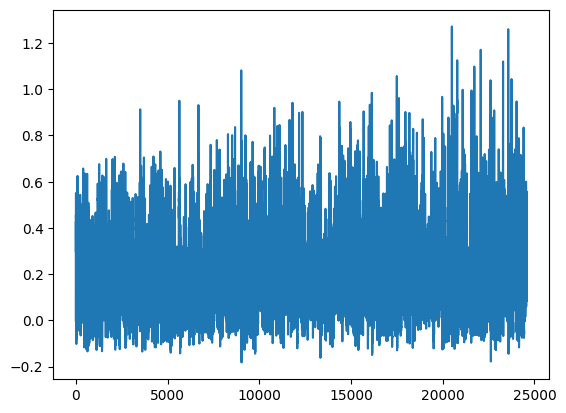

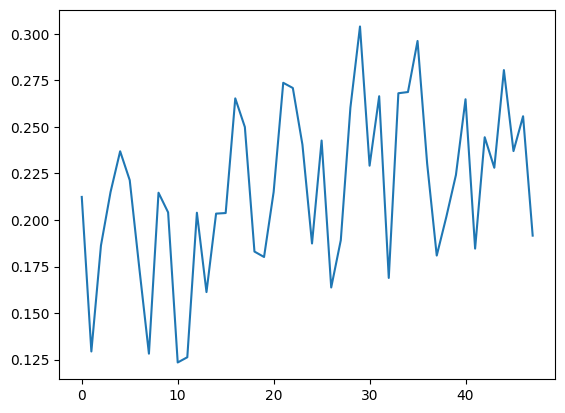

[PPO] Epoch 0: Loss=75.9025, Policy=0.0058, Value=151.8762
[PPO] Epoch 10: Loss=63.8231, Policy=-0.0022, Value=127.7344
[PPO] Epoch 20: Loss=47.2912, Policy=-0.0127, Value=94.6920
[PPO] Epoch 30: Loss=44.4635, Policy=-0.0219, Value=89.0526
Approx KL Learned: 0.022866562008857727
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 13/100 — steps: 2048


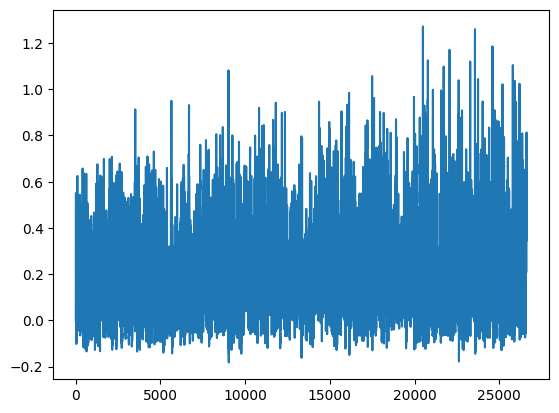

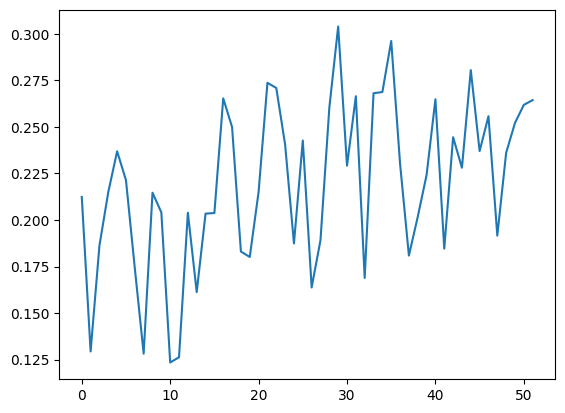

[PPO] Epoch 0: Loss=74.6282, Policy=0.0045, Value=149.3338
[PPO] Epoch 10: Loss=45.9289, Policy=-0.0171, Value=91.9785
[PPO] Epoch 20: Loss=29.4643, Policy=-0.0362, Value=59.0883
[PPO] Epoch 30: Loss=25.9592, Policy=-0.0495, Value=52.1014
Approx KL Learned: 0.04099002107977867
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 14/100 — steps: 2048


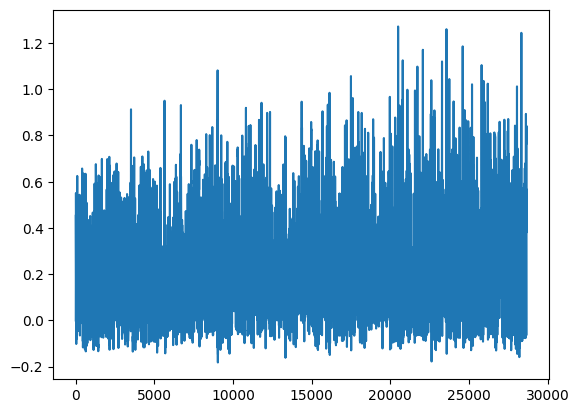

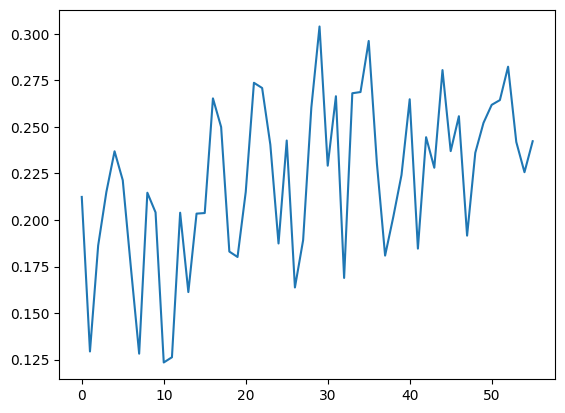

[PPO] Epoch 0: Loss=86.9564, Policy=0.0020, Value=173.9846
[PPO] Epoch 10: Loss=47.8969, Policy=-0.0014, Value=95.8741
[PPO] Epoch 20: Loss=30.8656, Policy=-0.0150, Value=61.8361
[PPO] Epoch 30: Loss=25.8313, Policy=-0.0253, Value=51.7922
Approx KL Learned: 0.03964579850435257
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 15/100 — steps: 2048


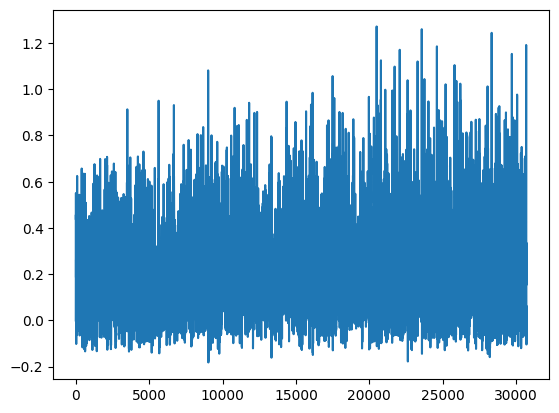

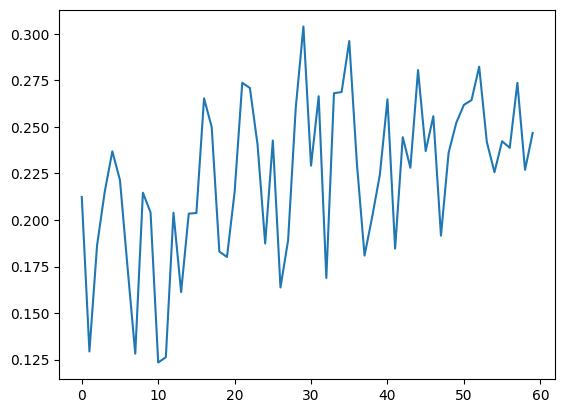

[PPO] Epoch 0: Loss=82.6305, Policy=0.0022, Value=165.3333
[PPO] Epoch 10: Loss=48.0928, Policy=-0.0060, Value=96.2744
[PPO] Epoch 20: Loss=37.4829, Policy=-0.0171, Value=75.0771
[PPO] Epoch 30: Loss=29.3041, Policy=-0.0249, Value=58.7375
Approx KL Learned: 0.029291806742548943
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 16/100 — steps: 2048


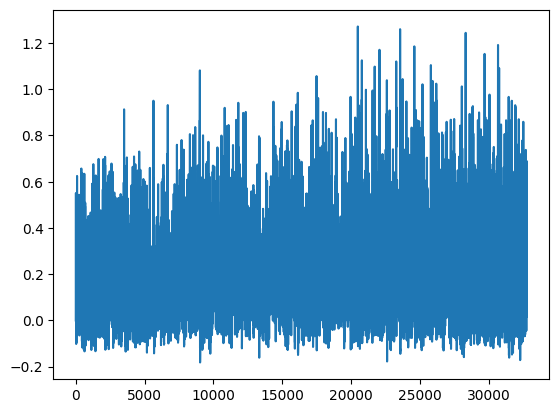

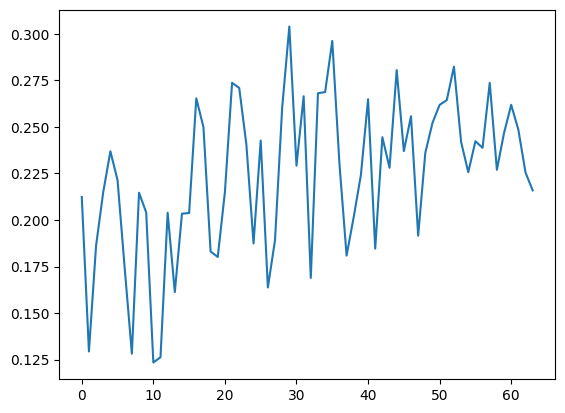

[PPO] Epoch 0: Loss=67.8157, Policy=0.0053, Value=135.6949
[PPO] Epoch 10: Loss=51.6223, Policy=0.0047, Value=103.3109
[PPO] Epoch 20: Loss=34.2433, Policy=-0.0101, Value=68.5804
[PPO] Epoch 30: Loss=28.7098, Policy=-0.0243, Value=57.5406
Approx KL Learned: 0.024784818291664124
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 17/100 — steps: 2048


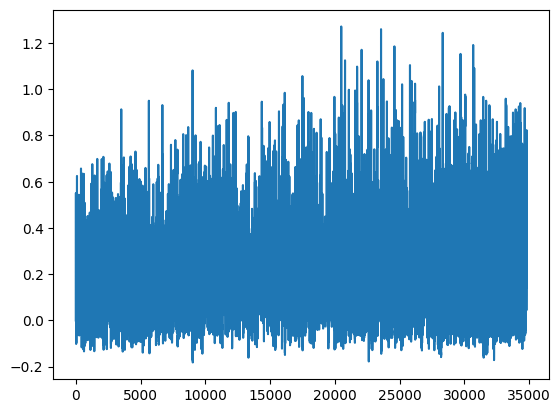

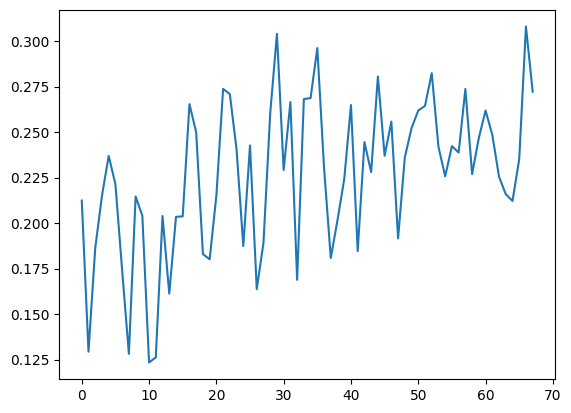

[PPO] Epoch 0: Loss=73.3968, Policy=0.0016, Value=146.8692
[PPO] Epoch 10: Loss=42.7943, Policy=-0.0108, Value=85.6872
[PPO] Epoch 20: Loss=30.1116, Policy=-0.0229, Value=60.3469
[PPO] Epoch 30: Loss=25.7006, Policy=-0.0377, Value=51.5531
Approx KL Learned: 0.0317569375038147
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 18/100 — steps: 2048


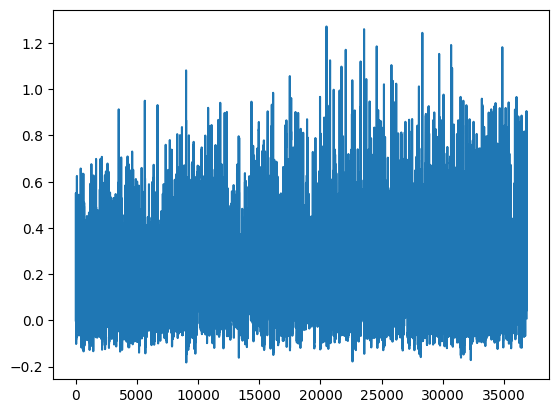

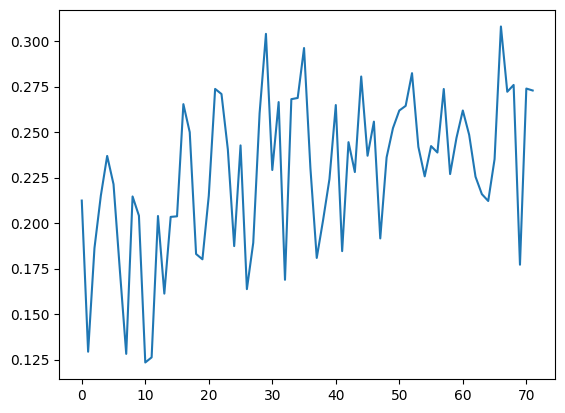

[PPO] Epoch 0: Loss=69.2702, Policy=0.0025, Value=138.6077
[PPO] Epoch 10: Loss=50.2512, Policy=-0.0038, Value=100.5833
[PPO] Epoch 20: Loss=49.4064, Policy=-0.0089, Value=98.9073
[PPO] Epoch 30: Loss=33.2614, Policy=-0.0244, Value=66.6438
Approx KL Learned: 0.03423948958516121
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 19/100 — steps: 2048


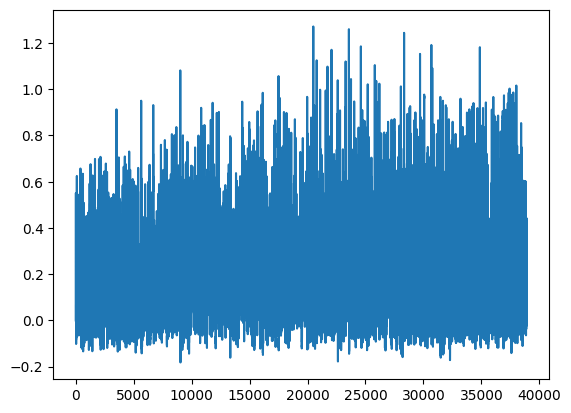

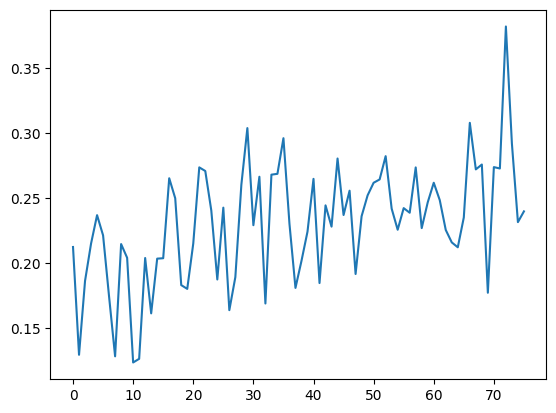

[PPO] Epoch 0: Loss=67.5016, Policy=0.0006, Value=135.0755
[PPO] Epoch 10: Loss=45.1047, Policy=0.0080, Value=90.2704
[PPO] Epoch 20: Loss=36.7904, Policy=0.0077, Value=73.6478
[PPO] Epoch 30: Loss=32.1163, Policy=-0.0270, Value=64.3639
Approx KL Learned: 0.052669696509838104
[✅] Actor-Critic checkpoint saved to chkpoint_19.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 20/100 — steps: 2048


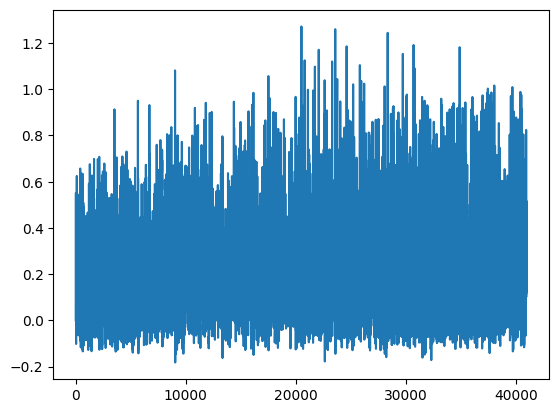

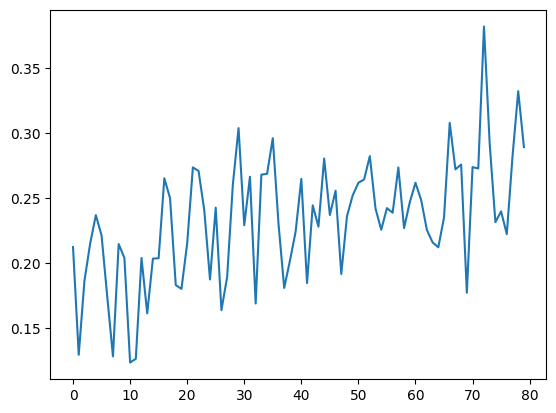

[PPO] Epoch 0: Loss=75.2069, Policy=0.0075, Value=150.4884
[PPO] Epoch 10: Loss=46.0650, Policy=-0.0049, Value=92.2307
[PPO] Epoch 20: Loss=34.5114, Policy=-0.0219, Value=69.1601
[PPO] Epoch 30: Loss=29.1165, Policy=-0.0347, Value=58.3911
Approx KL Learned: 0.037593744695186615
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 21/100 — steps: 2048


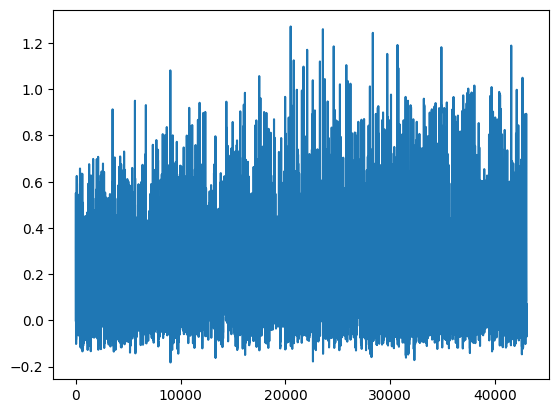

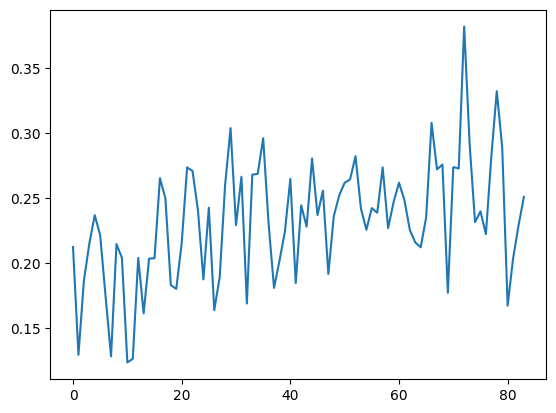

[PPO] Epoch 0: Loss=58.6187, Policy=0.0043, Value=117.3134
[PPO] Epoch 10: Loss=39.1299, Policy=-0.0127, Value=78.3701
[PPO] Epoch 20: Loss=30.7499, Policy=-0.0316, Value=61.6474
[PPO] Epoch 30: Loss=23.4290, Policy=-0.0449, Value=47.0315
Approx KL Learned: 0.06232249736785889
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 22/100 — steps: 2048


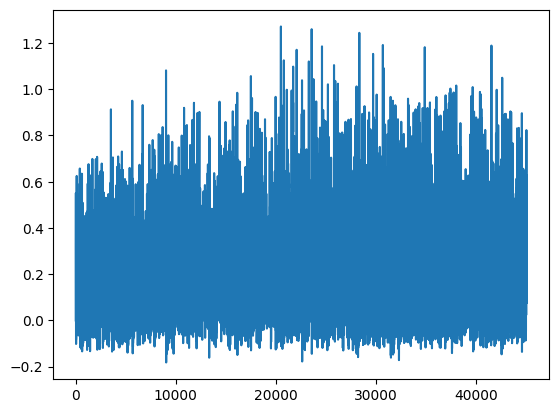

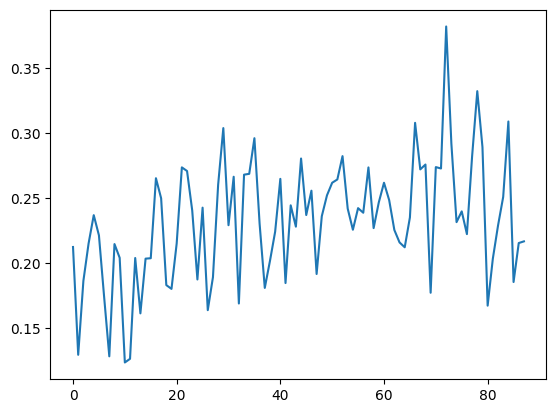

[PPO] Epoch 0: Loss=80.6013, Policy=0.0032, Value=161.2792
[PPO] Epoch 10: Loss=64.1754, Policy=-0.0066, Value=128.4476
[PPO] Epoch 20: Loss=52.4601, Policy=-0.0133, Value=105.0302
[PPO] Epoch 30: Loss=48.8085, Policy=-0.0271, Value=97.7531
Approx KL Learned: 0.025251299142837524
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 23/100 — steps: 2048


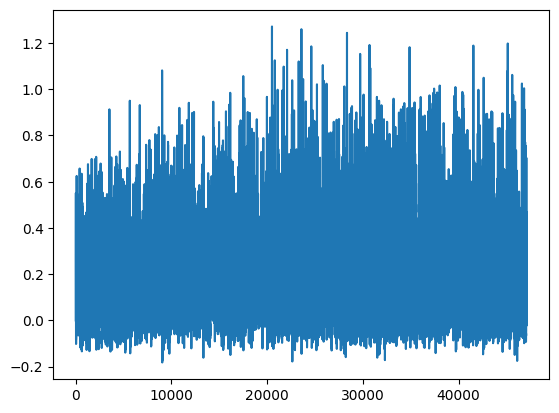

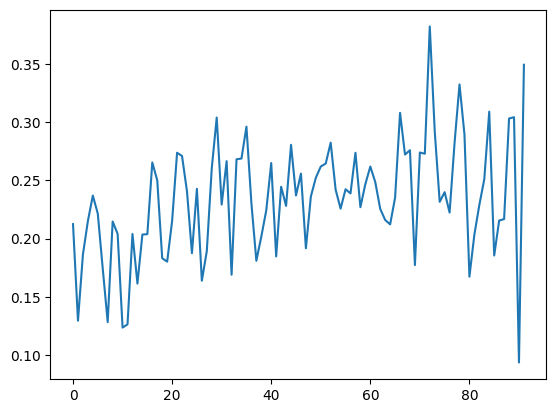

[PPO] Epoch 0: Loss=72.7664, Policy=-0.0001, Value=145.6047
[PPO] Epoch 10: Loss=43.6115, Policy=-0.0091, Value=87.3150
[PPO] Epoch 20: Loss=29.8553, Policy=-0.0257, Value=59.8364
[PPO] Epoch 30: Loss=22.4883, Policy=-0.0359, Value=45.1246
Approx KL Learned: 0.046931374818086624
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 24/100 — steps: 2048


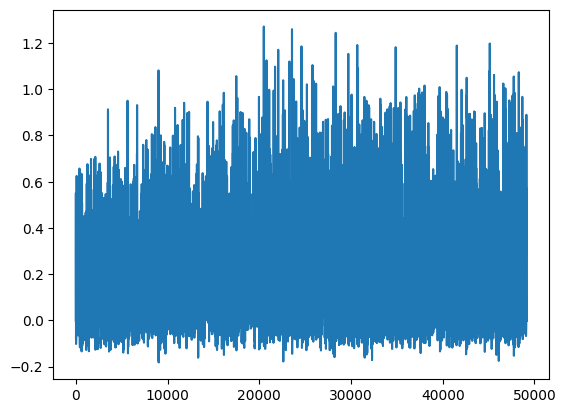

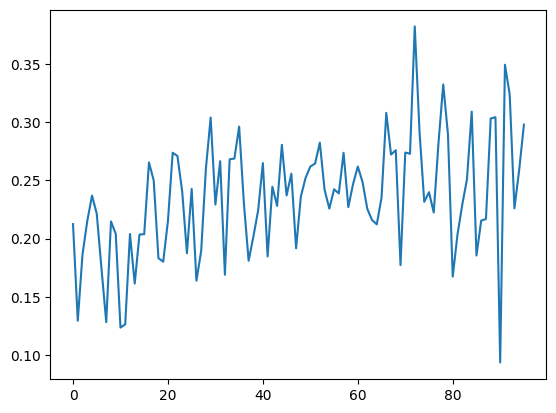

[PPO] Epoch 0: Loss=70.1354, Policy=0.0002, Value=140.3552
[PPO] Epoch 10: Loss=37.4201, Policy=-0.0108, Value=74.9474
[PPO] Epoch 20: Loss=28.2799, Policy=-0.0355, Value=56.7140
[PPO] Epoch 30: Loss=25.2858, Policy=-0.0439, Value=50.7407
Approx KL Learned: 0.08053852617740631
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 25/100 — steps: 2048


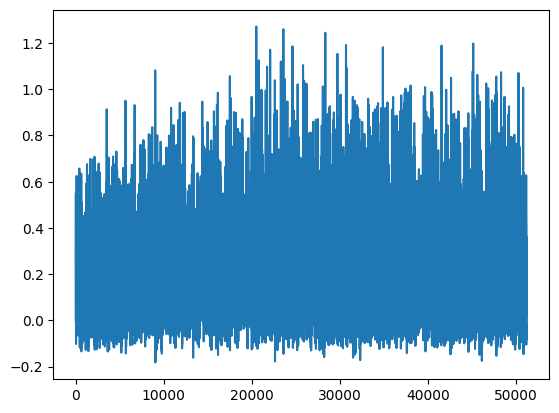

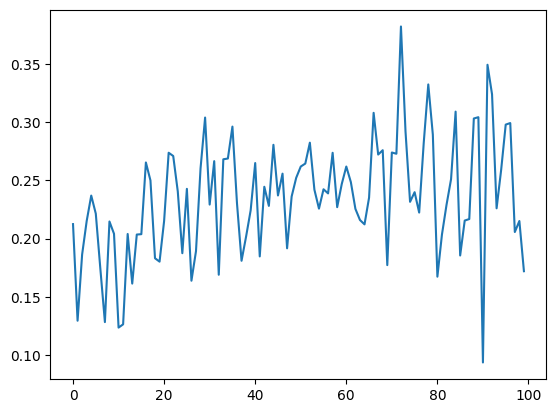

[PPO] Epoch 0: Loss=92.8125, Policy=0.0066, Value=185.6814
[PPO] Epoch 10: Loss=72.0518, Policy=0.0031, Value=144.1614
[PPO] Epoch 20: Loss=50.5791, Policy=-0.0040, Value=101.2383
[PPO] Epoch 30: Loss=31.6734, Policy=-0.0186, Value=63.4576
Approx KL Learned: 0.037184733897447586
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 26/100 — steps: 2048


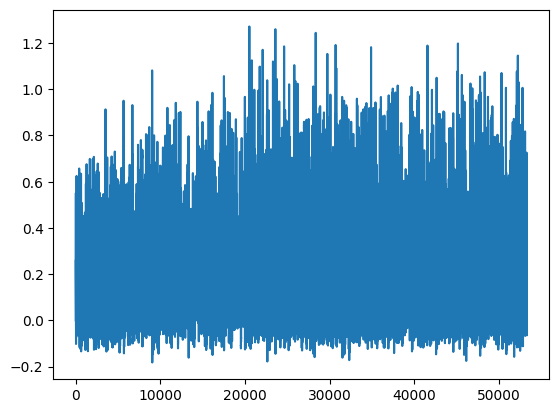

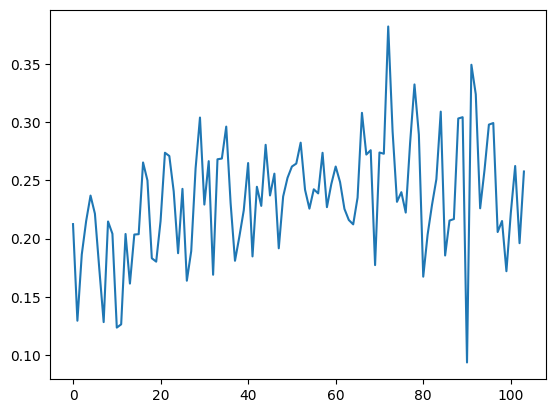

[PPO] Epoch 0: Loss=67.4271, Policy=0.0041, Value=134.9100
[PPO] Epoch 10: Loss=37.6053, Policy=-0.0059, Value=75.2919
[PPO] Epoch 20: Loss=31.7290, Policy=-0.0177, Value=63.5640
[PPO] Epoch 30: Loss=24.6172, Policy=-0.0305, Value=49.3647
Approx KL Learned: 0.04345257952809334
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 27/100 — steps: 2048


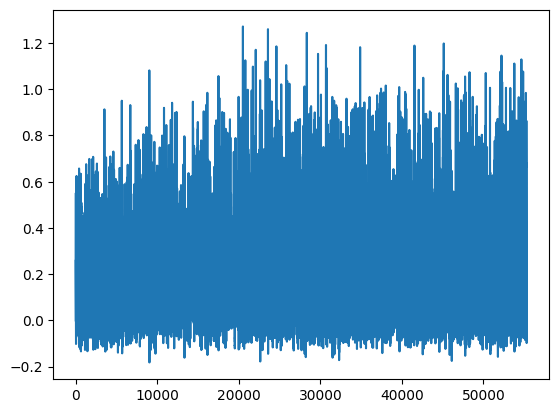

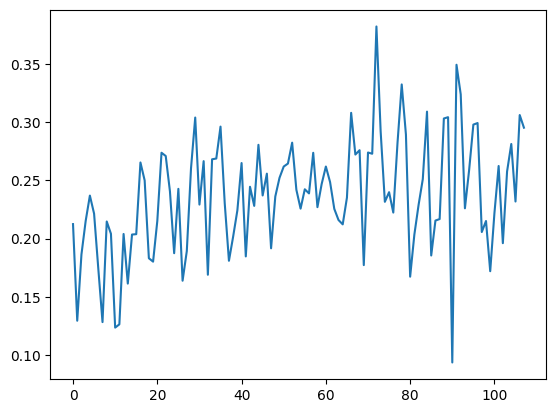

[PPO] Epoch 0: Loss=79.2672, Policy=0.0066, Value=158.5907
[PPO] Epoch 10: Loss=56.4695, Policy=-0.0025, Value=113.0205
[PPO] Epoch 20: Loss=39.1162, Policy=-0.0143, Value=78.3367
[PPO] Epoch 30: Loss=32.3970, Policy=-0.0259, Value=64.9222
Approx KL Learned: 0.04344809427857399
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 28/100 — steps: 2048


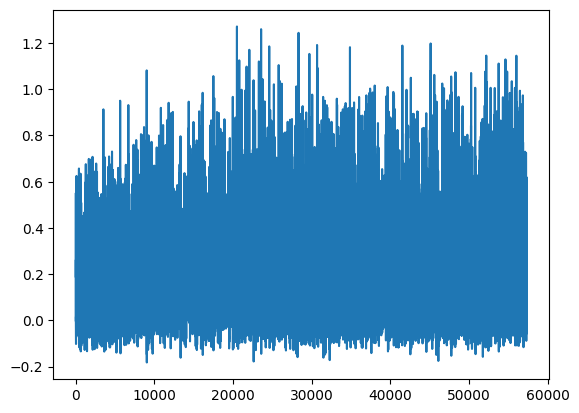

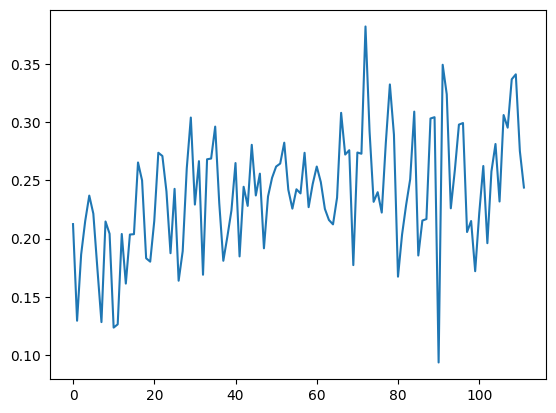

[PPO] Epoch 0: Loss=52.8371, Policy=-0.0009, Value=105.7549
[PPO] Epoch 10: Loss=29.9691, Policy=-0.0209, Value=60.0621
[PPO] Epoch 20: Loss=21.7929, Policy=-0.0421, Value=43.7505
[PPO] Epoch 30: Loss=23.2630, Policy=-0.0498, Value=46.7061
Approx KL Learned: 0.05543579161167145
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 29/100 — steps: 2048


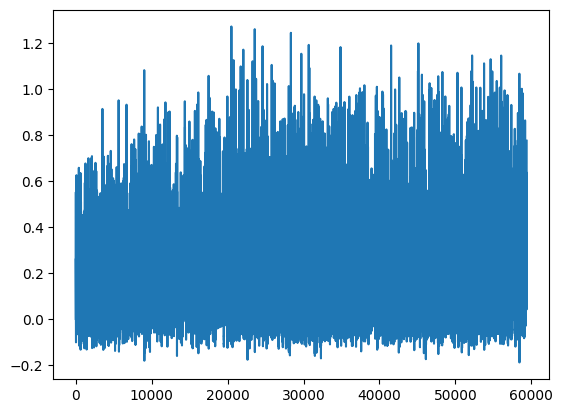

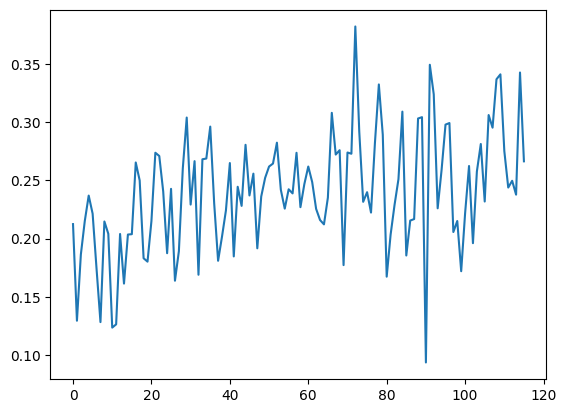

[PPO] Epoch 0: Loss=75.1320, Policy=0.0074, Value=150.3329
[PPO] Epoch 10: Loss=41.3090, Policy=-0.0122, Value=82.7267
[PPO] Epoch 20: Loss=28.4216, Policy=-0.0318, Value=56.9920
[PPO] Epoch 30: Loss=17.6948, Policy=-0.0504, Value=35.5732
Approx KL Learned: 0.05406919866800308
[✅] Actor-Critic checkpoint saved to chkpoint_29.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 30/100 — steps: 2048


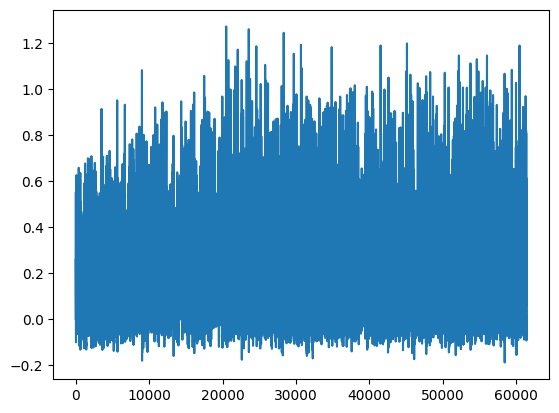

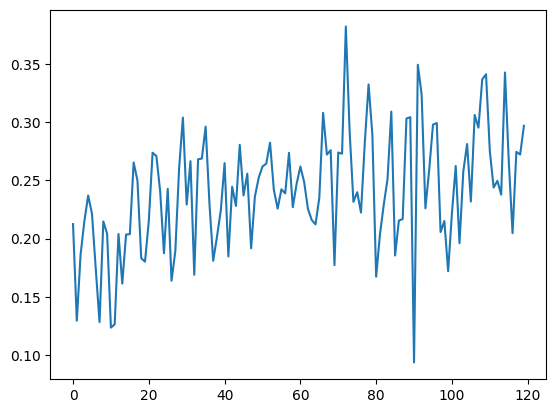

[PPO] Epoch 0: Loss=105.5527, Policy=0.0084, Value=211.1617
[PPO] Epoch 10: Loss=67.1811, Policy=-0.0015, Value=134.4424
[PPO] Epoch 20: Loss=47.0420, Policy=-0.0197, Value=94.2014
[PPO] Epoch 30: Loss=32.2683, Policy=-0.0372, Value=64.6876
Approx KL Learned: 0.05151461809873581
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 31/100 — steps: 2048


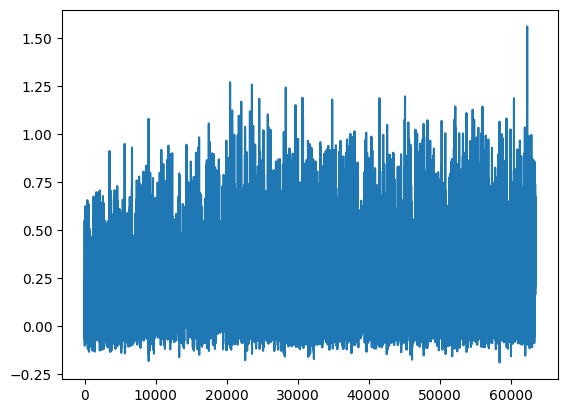

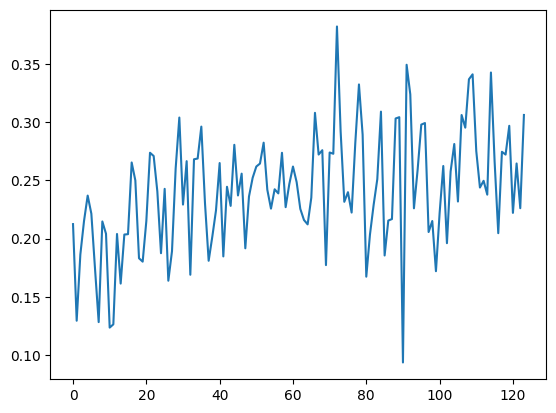

[PPO] Epoch 0: Loss=78.5716, Policy=0.0040, Value=157.2094
[PPO] Epoch 10: Loss=33.5783, Policy=-0.0101, Value=67.2559
[PPO] Epoch 20: Loss=18.3849, Policy=-0.0347, Value=36.9163
[PPO] Epoch 30: Loss=13.1348, Policy=-0.0479, Value=26.4455
Approx KL Learned: 0.07396391034126282
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 32/100 — steps: 2048


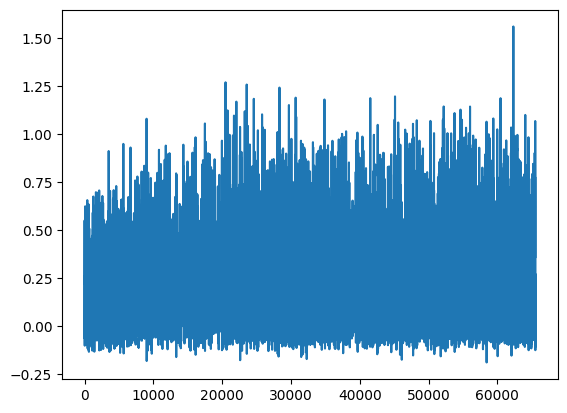

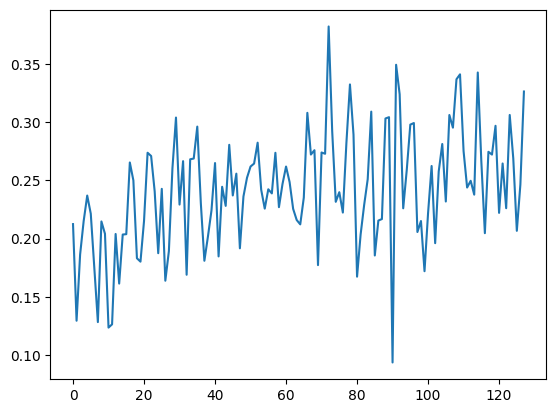

[PPO] Epoch 0: Loss=79.0111, Policy=0.0005, Value=158.1006
[PPO] Epoch 10: Loss=44.0808, Policy=-0.0065, Value=88.2557
[PPO] Epoch 20: Loss=26.1602, Policy=-0.0229, Value=52.4478
[PPO] Epoch 30: Loss=24.6555, Policy=-0.0364, Value=49.4642
Approx KL Learned: 0.027444984763860703
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 33/100 — steps: 2048


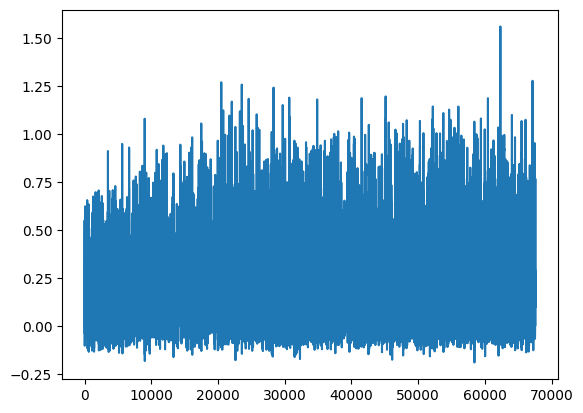

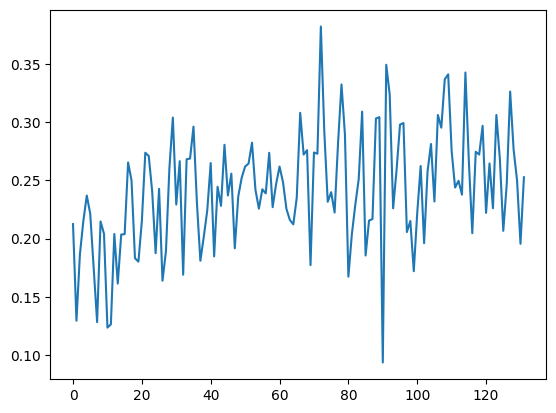

[PPO] Epoch 0: Loss=79.9395, Policy=0.0070, Value=159.9389
[PPO] Epoch 10: Loss=40.5225, Policy=-0.0137, Value=81.1478
[PPO] Epoch 20: Loss=16.8312, Policy=-0.0394, Value=33.8178
[PPO] Epoch 30: Loss=11.4757, Policy=-0.0596, Value=23.1480
Approx KL Learned: 0.091226726770401
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 34/100 — steps: 2048


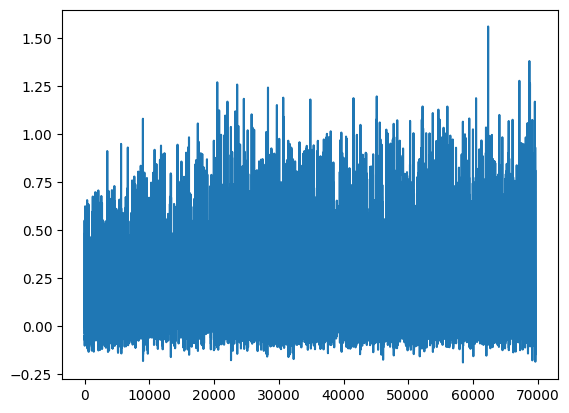

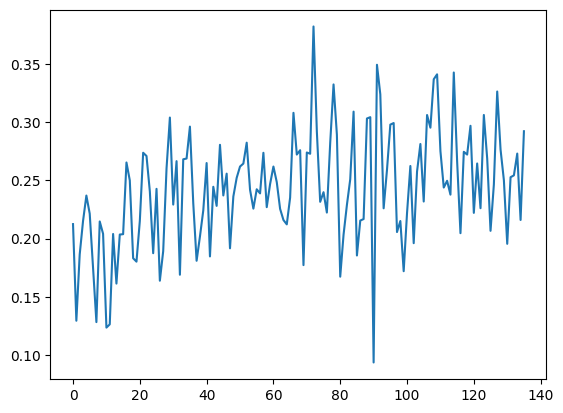

[PPO] Epoch 0: Loss=61.2563, Policy=0.0024, Value=122.5980
[PPO] Epoch 10: Loss=30.9439, Policy=-0.0123, Value=62.0028
[PPO] Epoch 20: Loss=18.1226, Policy=-0.0343, Value=36.4044
[PPO] Epoch 30: Loss=13.7349, Policy=-0.0491, Value=27.6592
Approx KL Learned: 0.059302542358636856
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 35/100 — steps: 2048


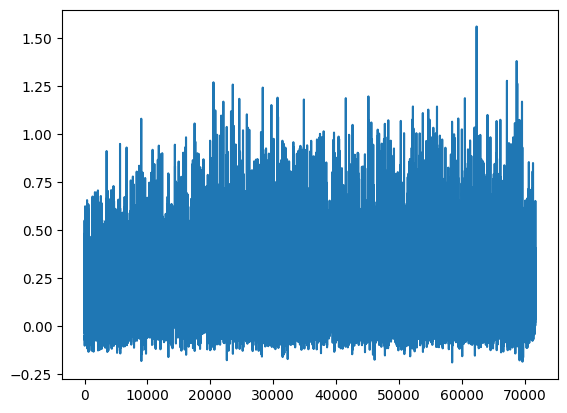

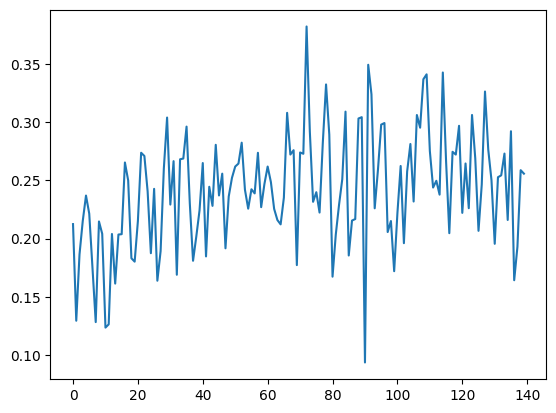

[PPO] Epoch 0: Loss=79.4230, Policy=0.0064, Value=158.9174
[PPO] Epoch 10: Loss=34.9332, Policy=-0.0154, Value=69.9833
[PPO] Epoch 20: Loss=17.6406, Policy=-0.0366, Value=35.4365
[PPO] Epoch 30: Loss=13.7425, Policy=-0.0503, Value=27.6683
Approx KL Learned: 0.0567178949713707
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 36/100 — steps: 2048


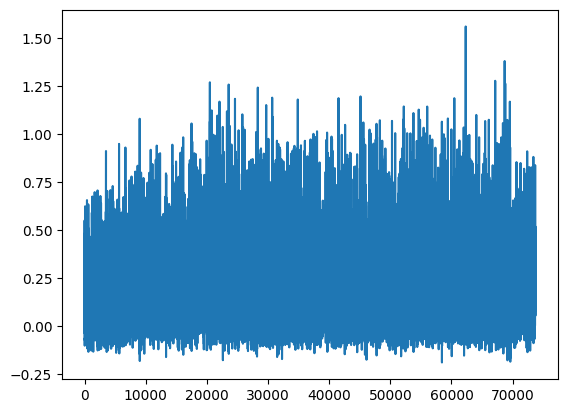

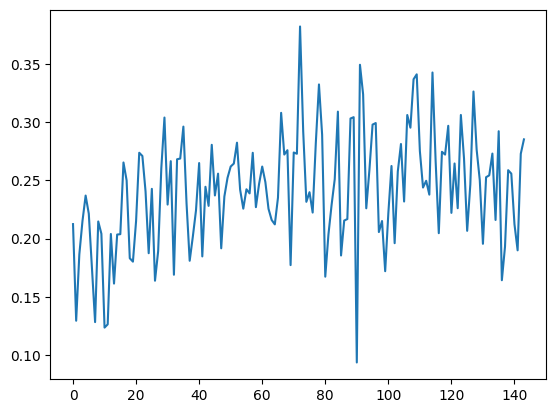

[PPO] Epoch 0: Loss=79.0850, Policy=0.0062, Value=158.2430
[PPO] Epoch 10: Loss=30.4165, Policy=-0.0076, Value=60.9370
[PPO] Epoch 20: Loss=15.3103, Policy=-0.0432, Value=30.7918
[PPO] Epoch 30: Loss=11.9168, Policy=-0.0620, Value=24.0420
Approx KL Learned: 0.05745343863964081
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 37/100 — steps: 2048


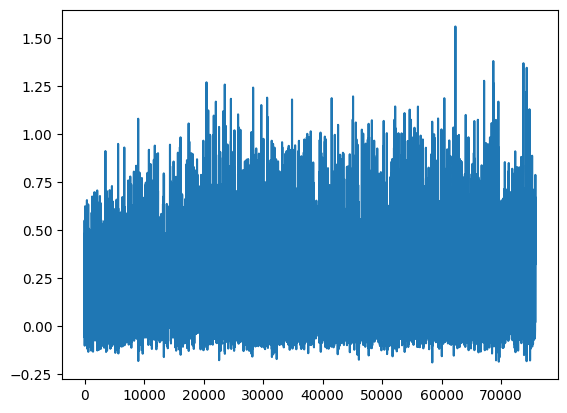

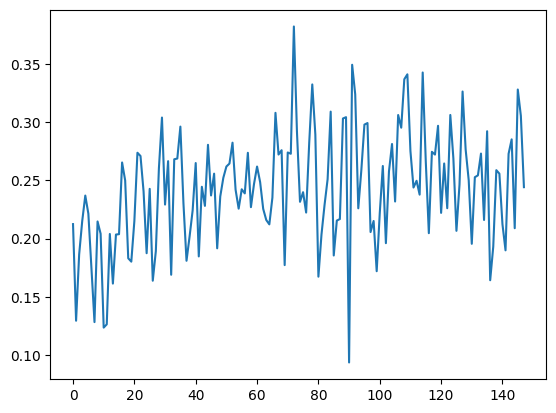

[PPO] Epoch 0: Loss=68.2983, Policy=0.0115, Value=136.6633
[PPO] Epoch 10: Loss=33.8958, Policy=-0.0129, Value=67.9107
[PPO] Epoch 20: Loss=19.3614, Policy=-0.0316, Value=38.8760
[PPO] Epoch 30: Loss=13.5943, Policy=-0.0016, Value=27.2810
Approx KL Learned: 0.09335900843143463
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 38/100 — steps: 2048


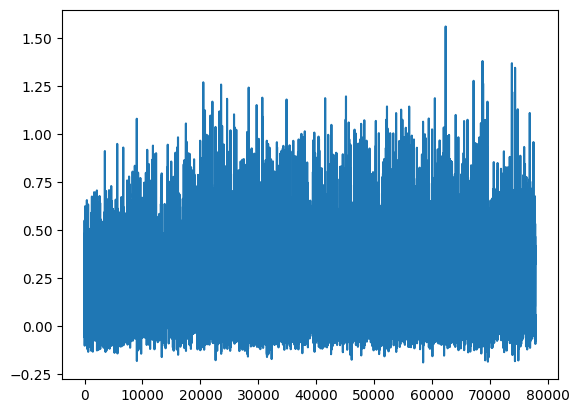

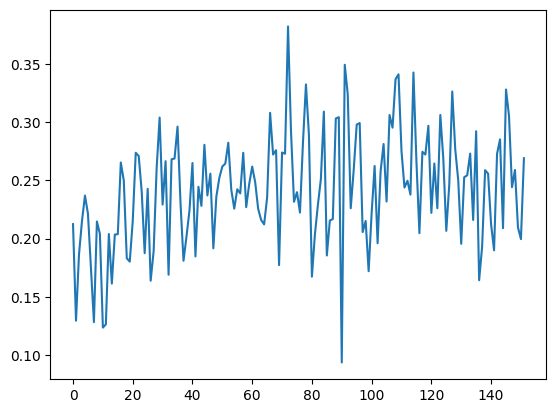

[PPO] Epoch 0: Loss=90.5644, Policy=0.0054, Value=181.2010
[PPO] Epoch 10: Loss=42.3499, Policy=-0.0032, Value=84.7895
[PPO] Epoch 20: Loss=32.6256, Policy=-0.0151, Value=65.3647
[PPO] Epoch 30: Loss=28.0172, Policy=-0.0282, Value=56.1721
Approx KL Learned: 0.03328052908182144
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 39/100 — steps: 2048


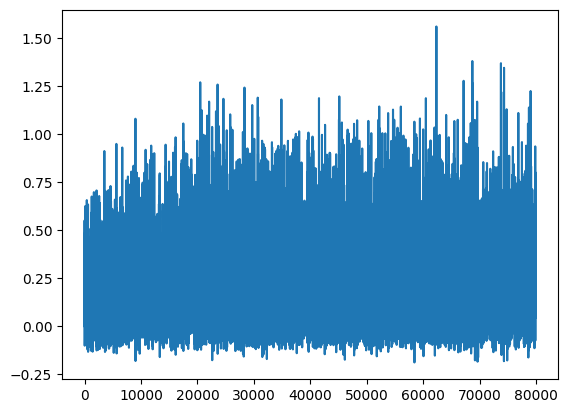

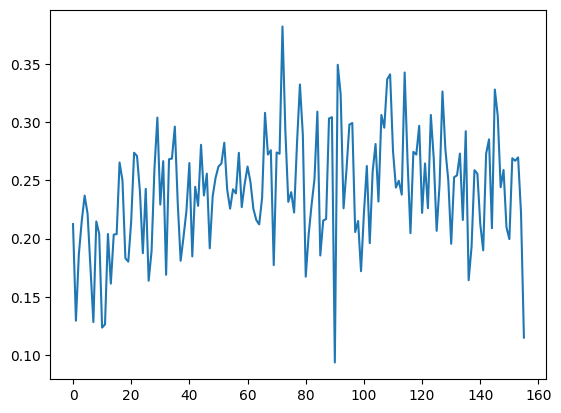

[PPO] Epoch 0: Loss=90.9863, Policy=0.0082, Value=182.0417
[PPO] Epoch 10: Loss=28.7578, Policy=-0.0100, Value=57.6218
[PPO] Epoch 20: Loss=15.4942, Policy=-0.0312, Value=31.1356
[PPO] Epoch 30: Loss=11.9036, Policy=-0.0352, Value=23.9576
Approx KL Learned: 0.096997931599617
[✅] Actor-Critic checkpoint saved to chkpoint_39.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 40/100 — steps: 2048


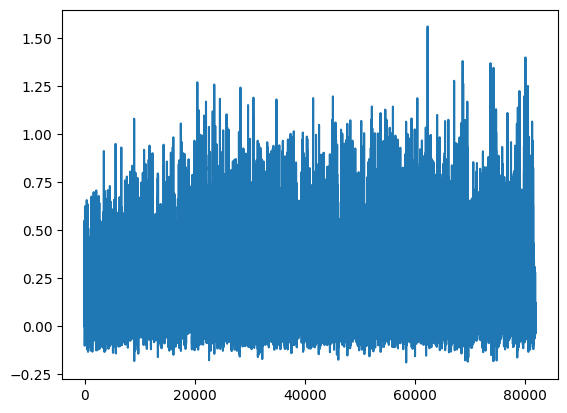

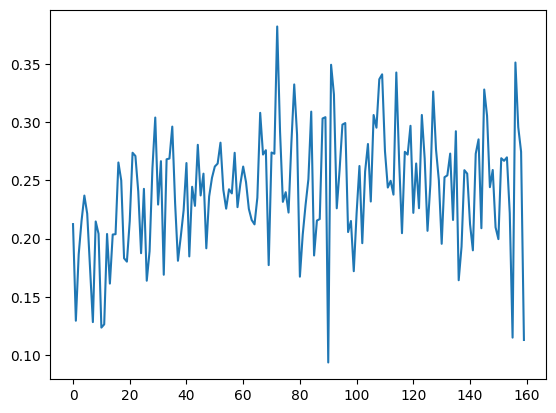

[PPO] Epoch 0: Loss=91.7488, Policy=0.0025, Value=183.5636
[PPO] Epoch 10: Loss=43.9551, Policy=0.0129, Value=87.9582
[PPO] Epoch 20: Loss=25.5495, Policy=-0.0061, Value=51.1846
[PPO] Epoch 30: Loss=18.0904, Policy=-0.0195, Value=36.2894
Approx KL Learned: 0.05219350755214691
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 41/100 — steps: 2048


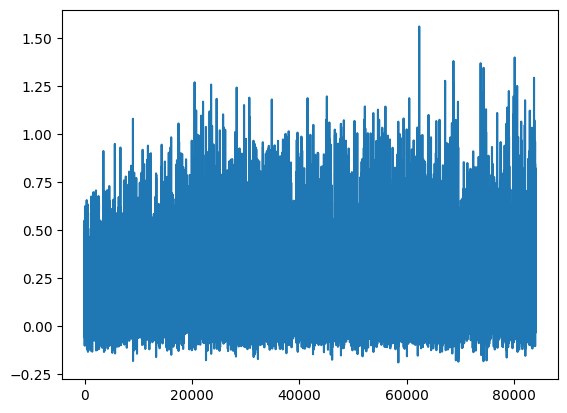

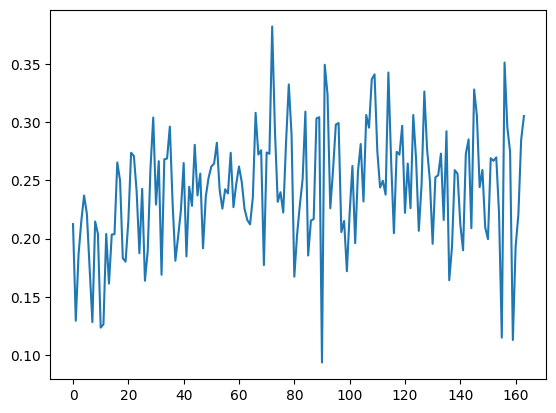

[PPO] Epoch 0: Loss=88.8773, Policy=0.0032, Value=177.8246
[PPO] Epoch 10: Loss=40.2981, Policy=-0.0036, Value=80.6840
[PPO] Epoch 20: Loss=28.2796, Policy=-0.0229, Value=56.6846
[PPO] Epoch 30: Loss=24.2316, Policy=-0.0314, Value=48.6054
Approx KL Learned: 0.04099873825907707
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 42/100 — steps: 2048


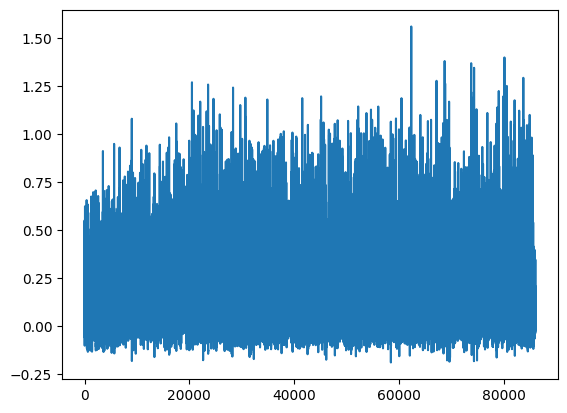

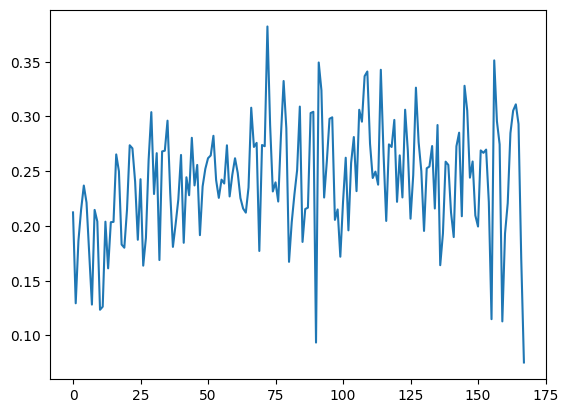

[PPO] Epoch 0: Loss=89.1237, Policy=0.0095, Value=178.3030
[PPO] Epoch 10: Loss=58.6995, Policy=-0.0024, Value=117.4819
[PPO] Epoch 20: Loss=45.3538, Policy=-0.0144, Value=90.8134
[PPO] Epoch 30: Loss=36.9024, Policy=-0.0257, Value=73.9332
Approx KL Learned: 0.028425950556993484
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 43/100 — steps: 2048


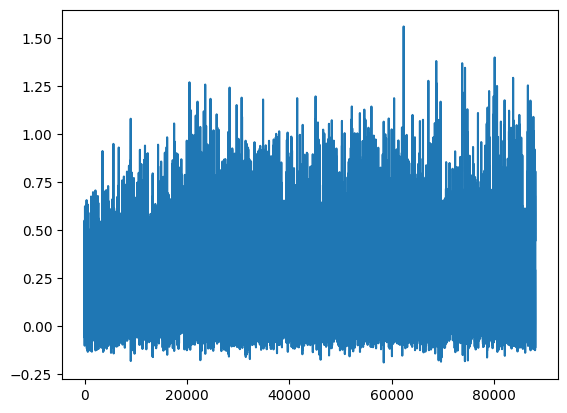

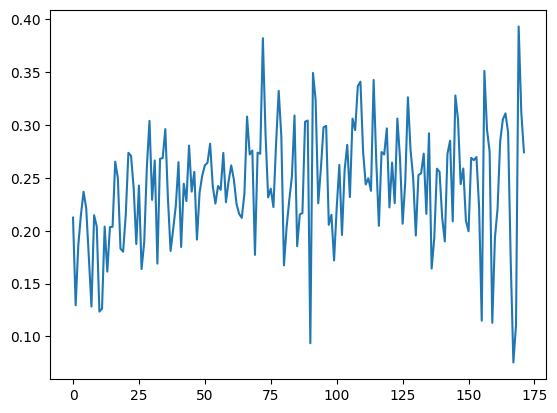

[PPO] Epoch 0: Loss=80.2210, Policy=0.0032, Value=160.5183
[PPO] Epoch 10: Loss=44.5300, Policy=-0.0089, Value=89.1617
[PPO] Epoch 20: Loss=34.2380, Policy=-0.0188, Value=68.5969
[PPO] Epoch 30: Loss=21.0064, Policy=-0.0269, Value=42.1514
Approx KL Learned: 0.027956511825323105
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 44/100 — steps: 2048


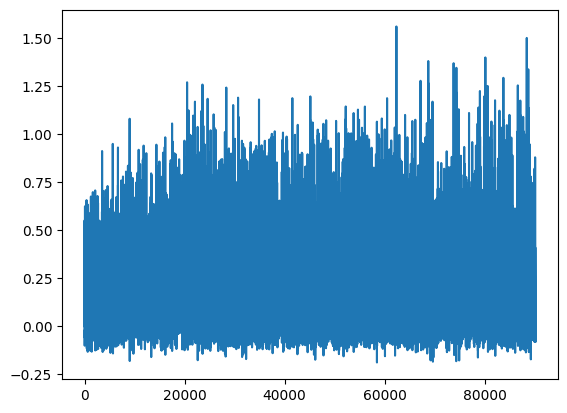

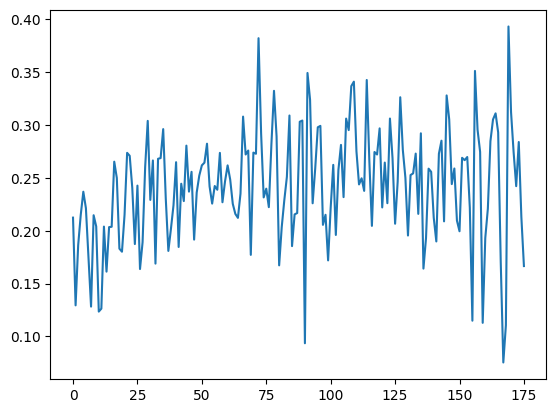

[PPO] Epoch 0: Loss=82.0772, Policy=0.0069, Value=164.2184
[PPO] Epoch 10: Loss=49.0215, Policy=-0.0015, Value=98.1261
[PPO] Epoch 20: Loss=32.7569, Policy=-0.0124, Value=65.6196
[PPO] Epoch 30: Loss=23.5174, Policy=-0.0225, Value=47.1604
Approx KL Learned: 0.053221121430397034
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 45/100 — steps: 2048


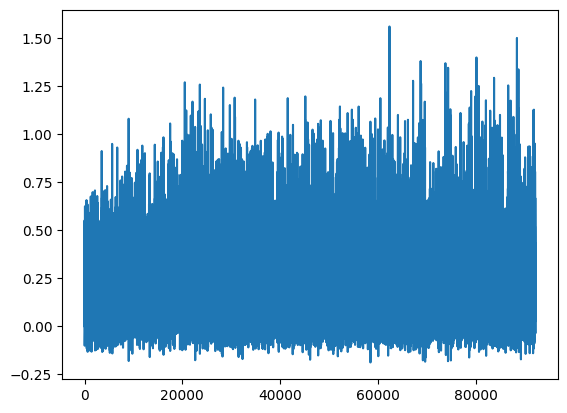

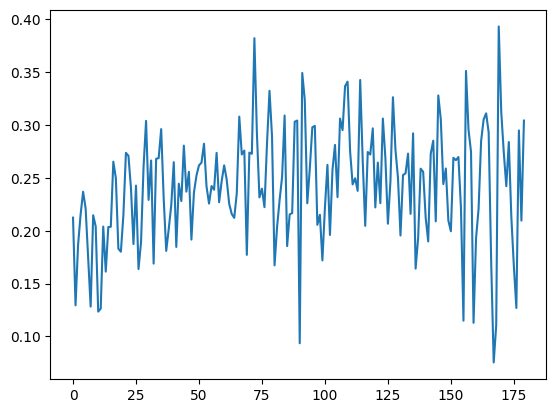

[PPO] Epoch 0: Loss=81.9816, Policy=0.0072, Value=164.0236
[PPO] Epoch 10: Loss=30.7155, Policy=-0.0103, Value=61.5261
[PPO] Epoch 20: Loss=15.9802, Policy=-0.0298, Value=32.0969
[PPO] Epoch 30: Loss=12.0163, Policy=-0.0395, Value=24.1851
Approx KL Learned: 0.05526375025510788
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 46/100 — steps: 2048


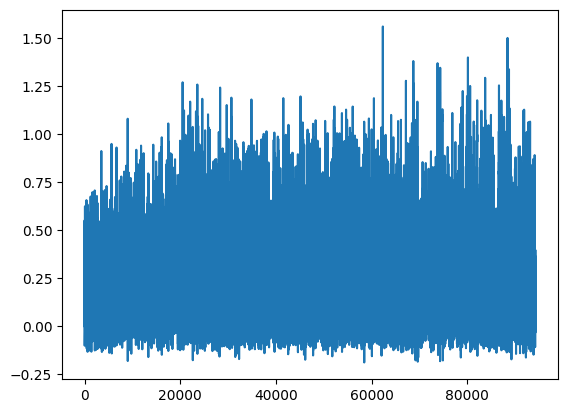

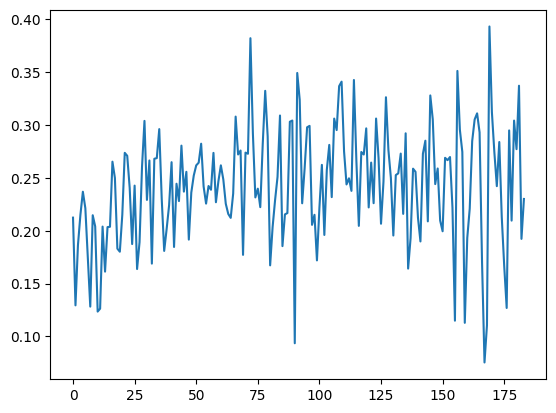

[PPO] Epoch 0: Loss=59.2691, Policy=0.0033, Value=118.6086
[PPO] Epoch 10: Loss=28.4732, Policy=0.0014, Value=57.0277
[PPO] Epoch 20: Loss=17.1405, Policy=-0.0259, Value=34.4103
[PPO] Epoch 30: Loss=14.0278, Policy=-0.0378, Value=28.2109
Approx KL Learned: 0.03453059494495392
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 47/100 — steps: 2048


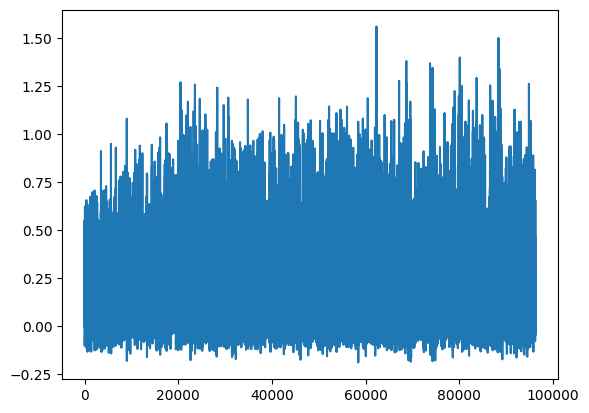

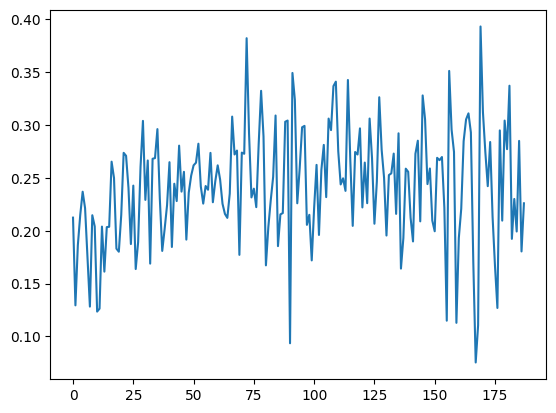

[PPO] Epoch 0: Loss=68.7829, Policy=0.0037, Value=137.6253
[PPO] Epoch 10: Loss=30.5418, Policy=-0.0042, Value=61.1627
[PPO] Epoch 20: Loss=11.5036, Policy=-0.0297, Value=23.1381
[PPO] Epoch 30: Loss=7.9969, Policy=-0.0498, Value=16.1665
Approx KL Learned: 0.10467827320098877
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 48/100 — steps: 2048


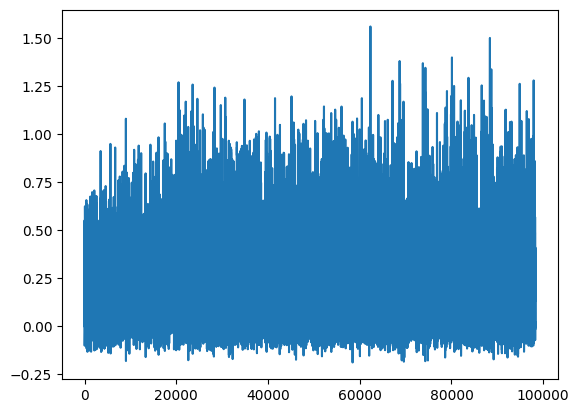

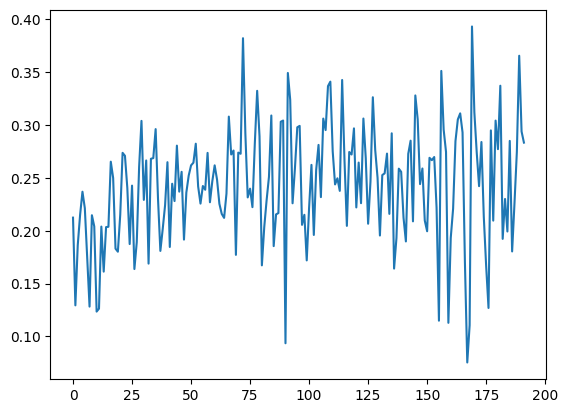

[PPO] Epoch 0: Loss=54.2594, Policy=0.0067, Value=108.5819
[PPO] Epoch 10: Loss=29.0569, Policy=-0.0042, Value=58.2009
[PPO] Epoch 20: Loss=18.7555, Policy=-0.0282, Value=37.6495
[PPO] Epoch 30: Loss=14.5905, Policy=-0.0432, Value=29.3492
Approx KL Learned: 0.052359819412231445
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 49/100 — steps: 2048


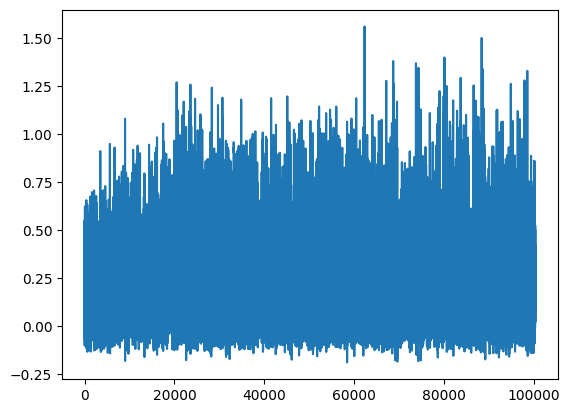

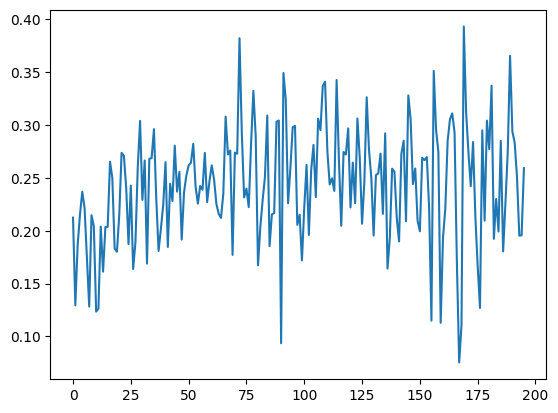

[PPO] Epoch 0: Loss=89.4562, Policy=0.0083, Value=178.9689
[PPO] Epoch 10: Loss=42.7765, Policy=-0.0041, Value=85.6353
[PPO] Epoch 20: Loss=17.9066, Policy=-0.0205, Value=35.9275
[PPO] Epoch 30: Loss=11.5099, Policy=-0.0399, Value=23.1718
Approx KL Learned: 0.041259974241256714
[✅] Actor-Critic checkpoint saved to chkpoint_49.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 50/100 — steps: 2048


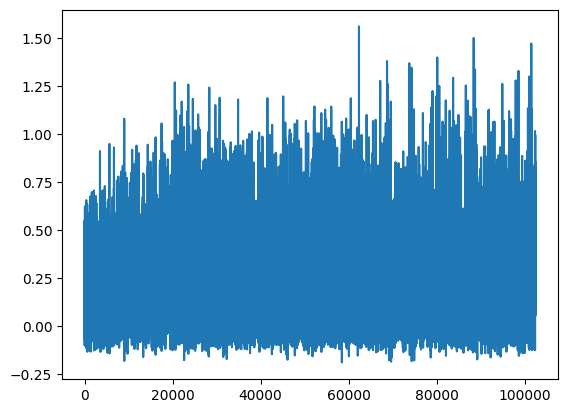

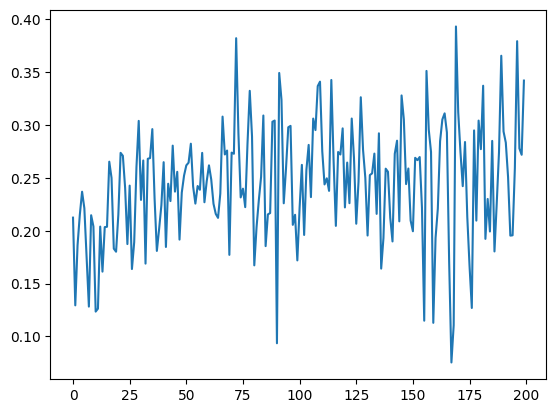

[PPO] Epoch 0: Loss=87.5298, Policy=0.0062, Value=175.1382
[PPO] Epoch 10: Loss=52.1066, Policy=0.0010, Value=104.3018
[PPO] Epoch 20: Loss=32.2268, Policy=-0.0154, Value=64.5730
[PPO] Epoch 30: Loss=21.6409, Policy=-0.0319, Value=43.4351
Approx KL Learned: 0.02790416032075882
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 51/100 — steps: 2048


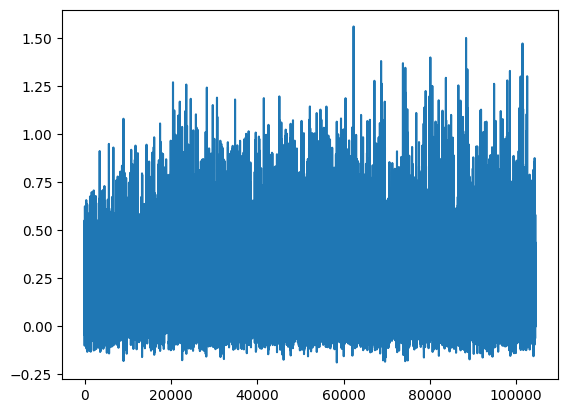

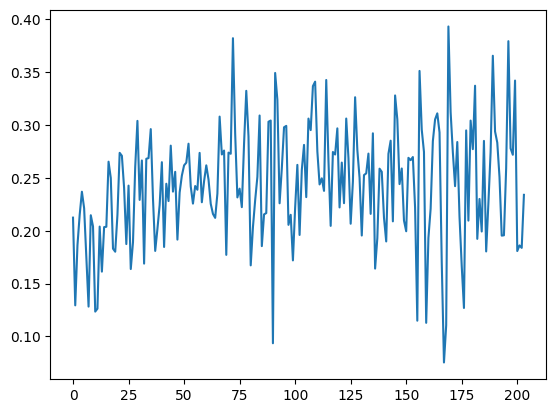

[PPO] Epoch 0: Loss=89.1671, Policy=0.0041, Value=178.4002
[PPO] Epoch 10: Loss=45.1511, Policy=-0.0082, Value=90.3929
[PPO] Epoch 20: Loss=25.5168, Policy=-0.0223, Value=51.1538
[PPO] Epoch 30: Loss=15.6214, Policy=-0.0286, Value=31.3727
Approx KL Learned: 0.10213293135166168
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 52/100 — steps: 2048


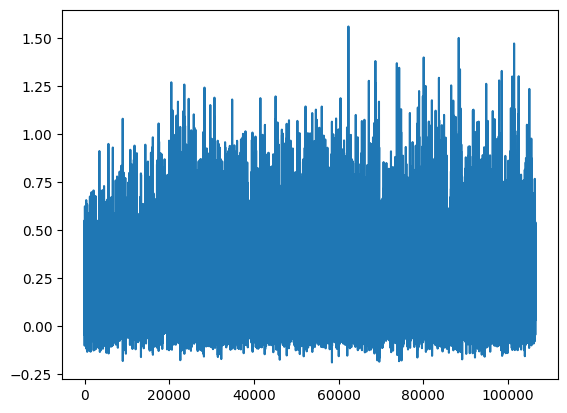

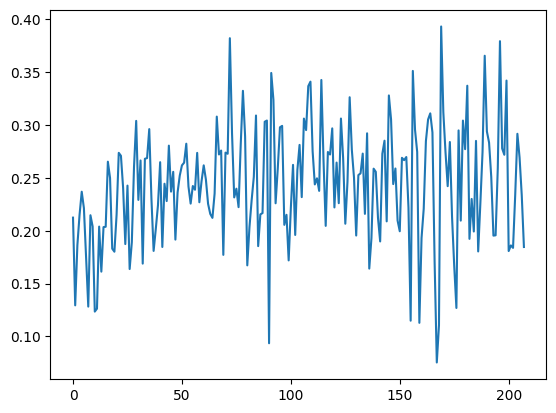

[PPO] Epoch 0: Loss=106.2603, Policy=0.0127, Value=212.5809
[PPO] Epoch 10: Loss=49.5863, Policy=0.0033, Value=99.2531
[PPO] Epoch 20: Loss=22.1624, Policy=-0.0119, Value=44.4368
[PPO] Epoch 30: Loss=12.4750, Policy=-0.0289, Value=25.0931
Approx KL Learned: 0.02905873954296112
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 53/100 — steps: 2048


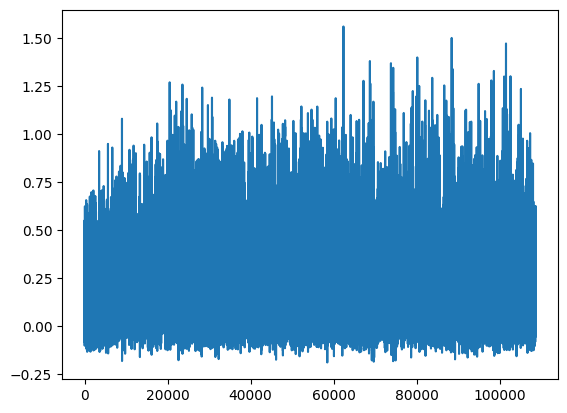

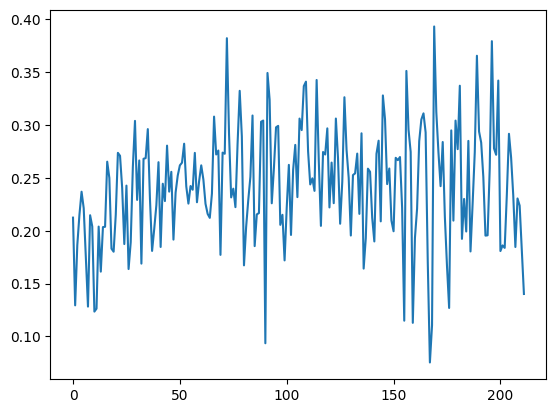

[PPO] Epoch 0: Loss=80.6767, Policy=0.0041, Value=161.4283
[PPO] Epoch 10: Loss=57.9486, Policy=0.0010, Value=115.9800
[PPO] Epoch 20: Loss=25.8750, Policy=-0.0100, Value=51.8552
[PPO] Epoch 30: Loss=28.8757, Policy=-0.0193, Value=57.8733
Approx KL Learned: 0.033791087567806244
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 54/100 — steps: 2048


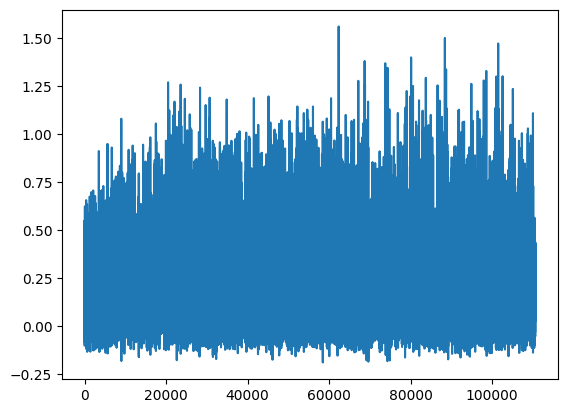

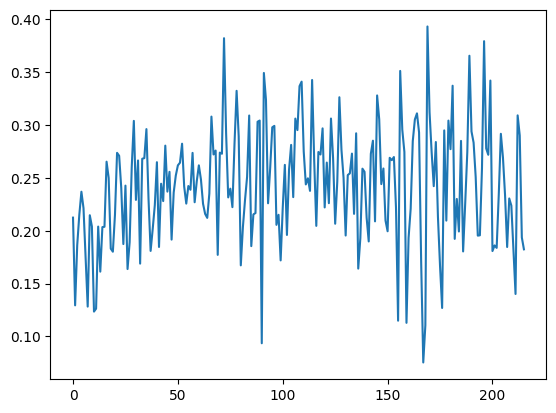

[PPO] Epoch 0: Loss=52.0115, Policy=0.0051, Value=104.1014
[PPO] Epoch 10: Loss=30.4199, Policy=-0.0064, Value=60.9398
[PPO] Epoch 20: Loss=22.5622, Policy=-0.0236, Value=45.2601
[PPO] Epoch 30: Loss=14.8857, Policy=-0.0374, Value=29.9343
Approx KL Learned: 0.040585197508335114
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 55/100 — steps: 2048


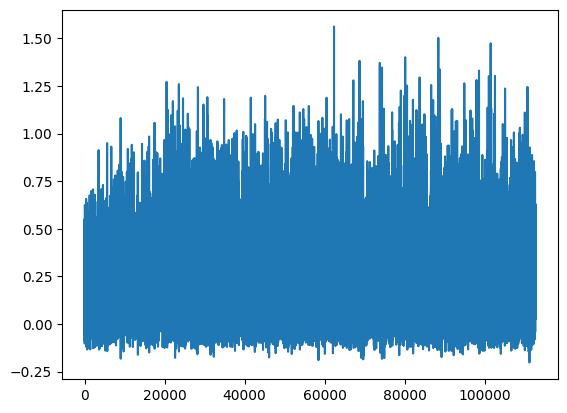

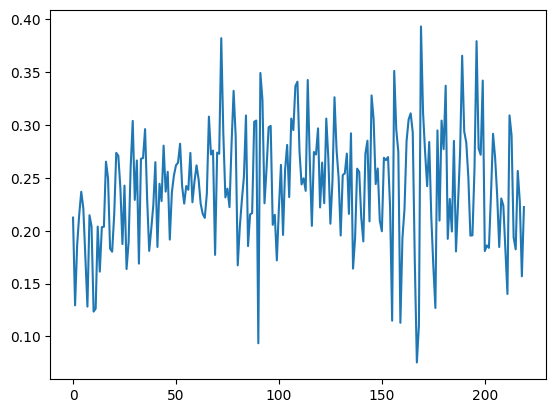

[PPO] Epoch 0: Loss=73.4011, Policy=0.0027, Value=146.8842
[PPO] Epoch 10: Loss=39.3782, Policy=-0.0105, Value=78.8642
[PPO] Epoch 20: Loss=18.4295, Policy=-0.0228, Value=36.9919
[PPO] Epoch 30: Loss=10.7508, Policy=-0.0376, Value=21.6646
Approx KL Learned: 0.053520407527685165
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 56/100 — steps: 2048


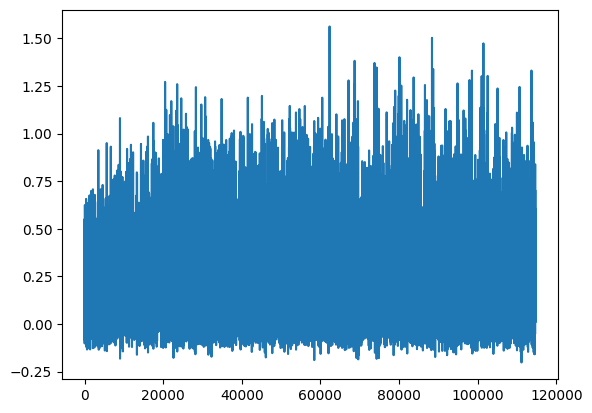

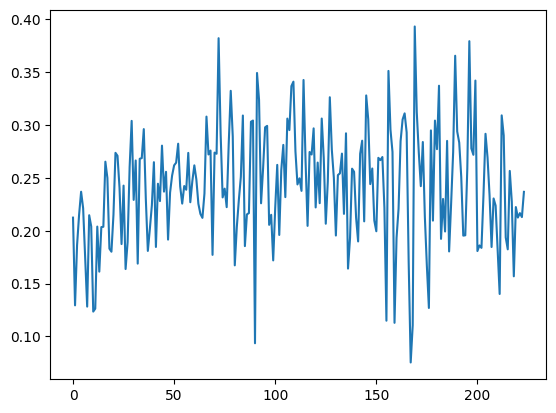

[PPO] Epoch 0: Loss=89.9488, Policy=0.0074, Value=179.9701
[PPO] Epoch 10: Loss=34.1881, Policy=-0.0058, Value=68.4771
[PPO] Epoch 20: Loss=21.4861, Policy=-0.0393, Value=43.1389
[PPO] Epoch 30: Loss=16.7676, Policy=-0.0599, Value=33.7431
Approx KL Learned: 0.06591270864009857
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 57/100 — steps: 2048


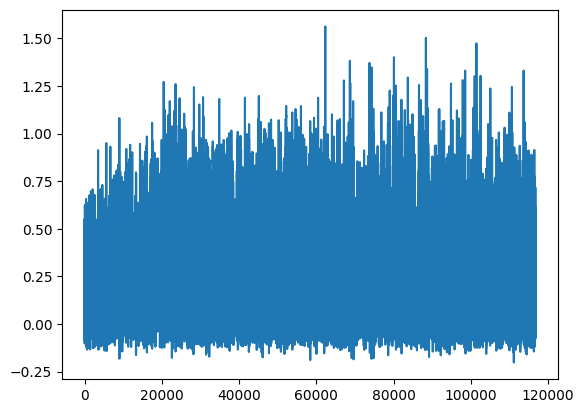

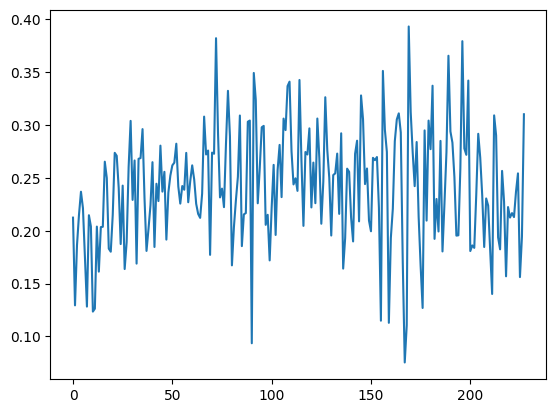

[PPO] Epoch 0: Loss=86.6639, Policy=0.0075, Value=173.3972
[PPO] Epoch 10: Loss=31.8499, Policy=-0.0088, Value=63.8009
[PPO] Epoch 20: Loss=17.2766, Policy=-0.0308, Value=34.6973
[PPO] Epoch 30: Loss=11.7364, Policy=-0.0482, Value=23.6527
Approx KL Learned: 0.03834298253059387
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 58/100 — steps: 2048


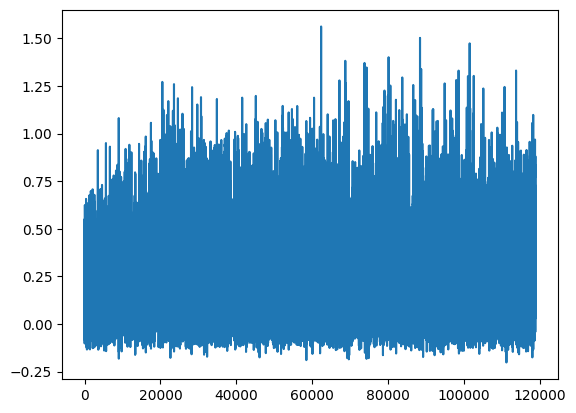

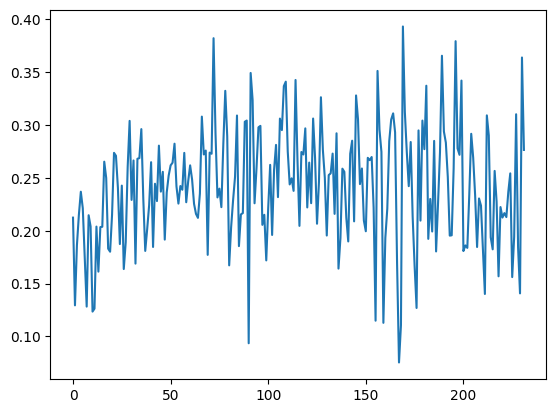

[PPO] Epoch 0: Loss=64.0521, Policy=0.0148, Value=128.1630
[PPO] Epoch 10: Loss=30.0388, Policy=-0.0207, Value=60.2086
[PPO] Epoch 20: Loss=12.8948, Policy=-0.0427, Value=25.9627
[PPO] Epoch 30: Loss=12.6373, Policy=-0.0521, Value=25.4658
Approx KL Learned: 0.04385128989815712
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 59/100 — steps: 2048


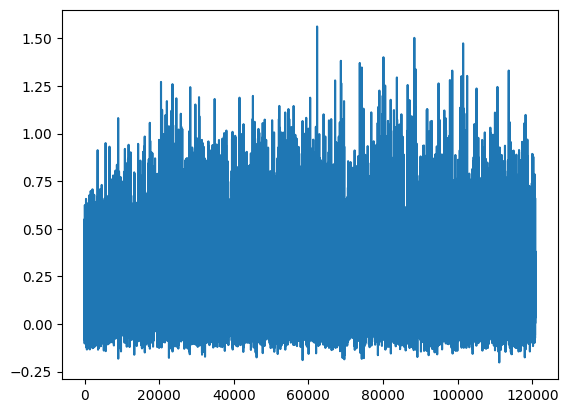

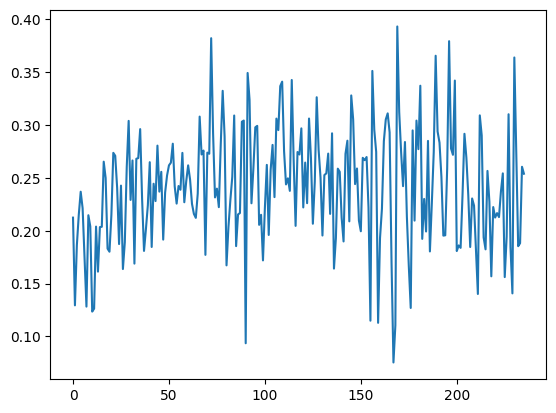

[PPO] Epoch 0: Loss=64.1091, Policy=0.0031, Value=128.3037
[PPO] Epoch 10: Loss=22.1600, Policy=-0.0040, Value=44.4218
[PPO] Epoch 20: Loss=11.5734, Policy=-0.0365, Value=23.3130
[PPO] Epoch 30: Loss=7.8824, Policy=-0.0535, Value=15.9651
Approx KL Learned: 0.045230407267808914
[✅] Actor-Critic checkpoint saved to chkpoint_59.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 60/100 — steps: 2048


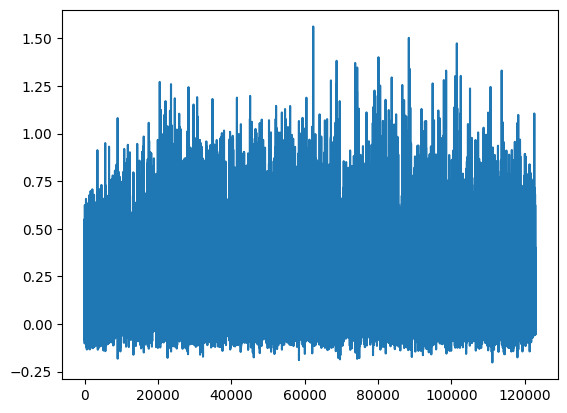

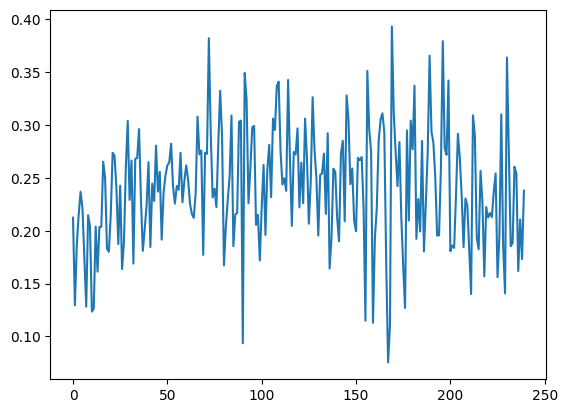

[PPO] Epoch 0: Loss=101.6154, Policy=0.0126, Value=203.2928
[PPO] Epoch 10: Loss=44.8690, Policy=-0.0020, Value=89.8297
[PPO] Epoch 20: Loss=25.9577, Policy=-0.0216, Value=52.0434
[PPO] Epoch 30: Loss=17.0371, Policy=-0.0314, Value=34.2219
Approx KL Learned: 0.03387831151485443
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 61/100 — steps: 2048


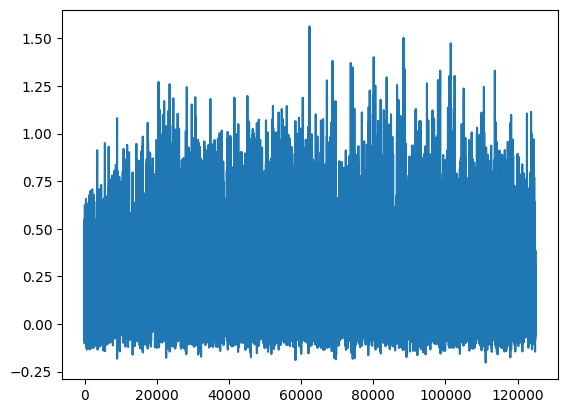

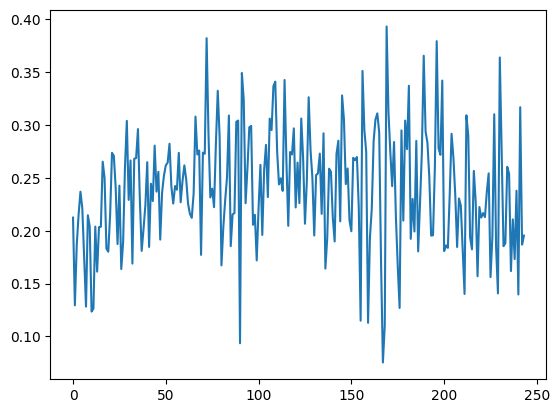

[PPO] Epoch 0: Loss=88.0112, Policy=0.0062, Value=176.0927
[PPO] Epoch 10: Loss=41.2201, Policy=-0.0099, Value=82.5432
[PPO] Epoch 20: Loss=23.7733, Policy=-0.0285, Value=47.6874
[PPO] Epoch 30: Loss=17.9428, Policy=-0.0432, Value=36.0560
Approx KL Learned: 0.04879568889737129
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 62/100 — steps: 2048


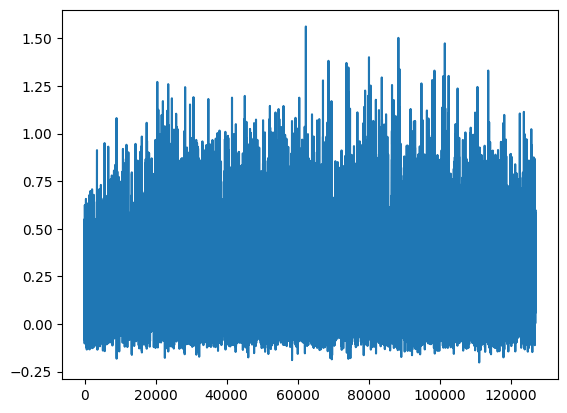

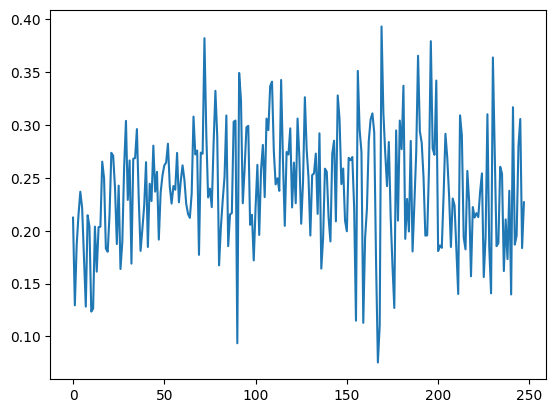

[PPO] Epoch 0: Loss=111.4557, Policy=0.0015, Value=222.9914
[PPO] Epoch 10: Loss=53.4315, Policy=-0.0137, Value=106.9730
[PPO] Epoch 20: Loss=32.5328, Policy=-0.0286, Value=65.2049
[PPO] Epoch 30: Loss=22.9754, Policy=-0.0399, Value=46.1127
Approx KL Learned: 0.03389713540673256
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 63/100 — steps: 2048


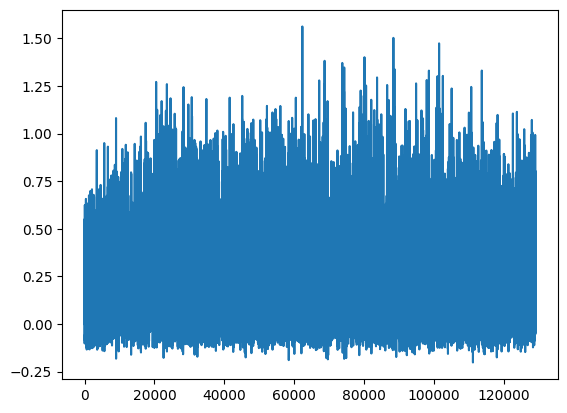

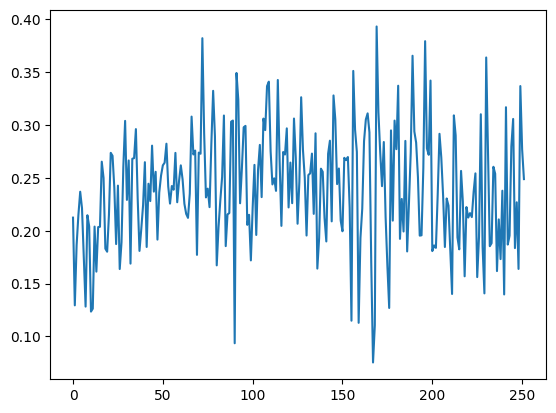

[PPO] Epoch 0: Loss=94.6217, Policy=0.0087, Value=189.3054
[PPO] Epoch 10: Loss=56.0853, Policy=-0.0037, Value=112.2586
[PPO] Epoch 20: Loss=42.2517, Policy=-0.0183, Value=84.6199
[PPO] Epoch 30: Loss=31.0339, Policy=-0.0287, Value=62.2075
Approx KL Learned: 0.04137616604566574
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 64/100 — steps: 2048


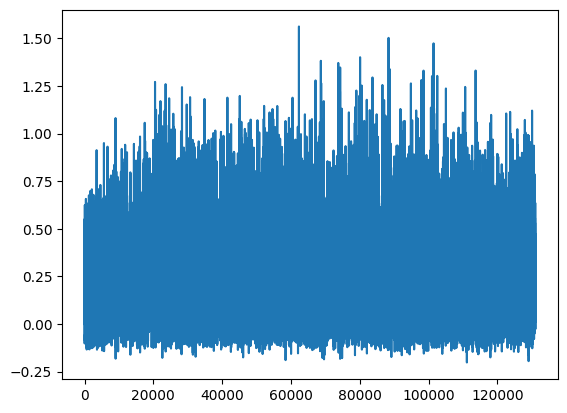

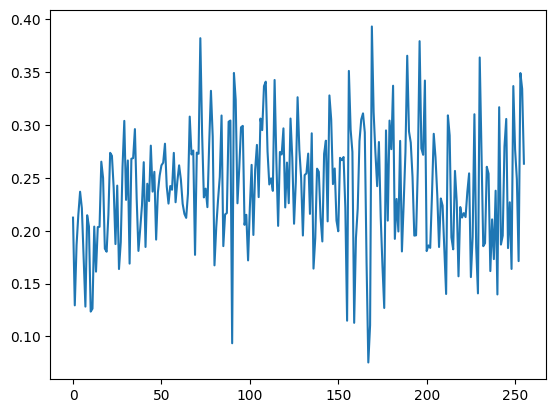

[PPO] Epoch 0: Loss=83.8552, Policy=0.0092, Value=167.7768
[PPO] Epoch 10: Loss=36.3953, Policy=-0.0201, Value=72.9189
[PPO] Epoch 20: Loss=18.7059, Policy=-0.0465, Value=37.5885
[PPO] Epoch 30: Loss=12.1884, Policy=-0.0613, Value=24.5851
Approx KL Learned: 0.05042169988155365
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 65/100 — steps: 2048


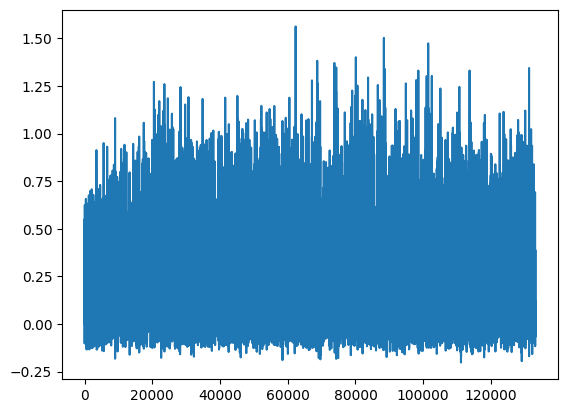

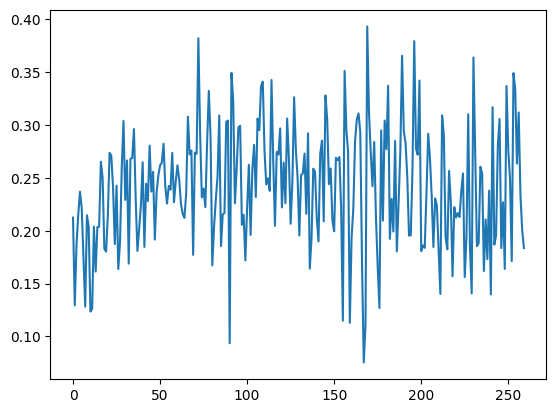

[PPO] Epoch 0: Loss=87.6684, Policy=0.0075, Value=175.4029
[PPO] Epoch 10: Loss=28.7858, Policy=-0.0150, Value=57.6854
[PPO] Epoch 20: Loss=14.9692, Policy=-0.0359, Value=30.0948
[PPO] Epoch 30: Loss=10.0273, Policy=-0.0487, Value=20.2346
Approx KL Learned: 0.048219725489616394
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 66/100 — steps: 2048


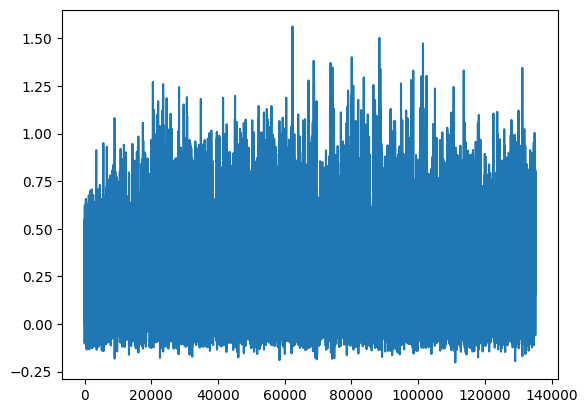

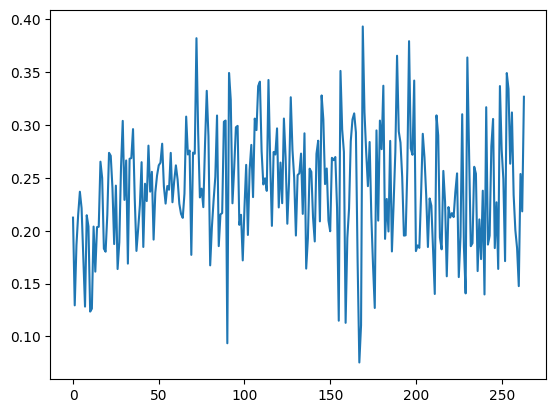

[PPO] Epoch 0: Loss=91.2646, Policy=0.0026, Value=182.6106
[PPO] Epoch 10: Loss=35.9823, Policy=-0.0258, Value=72.1038
[PPO] Epoch 20: Loss=18.4896, Policy=-0.0435, Value=37.1522
[PPO] Epoch 30: Loss=12.6874, Policy=-0.0581, Value=25.5772
Approx KL Learned: 0.05779699608683586
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 67/100 — steps: 2048


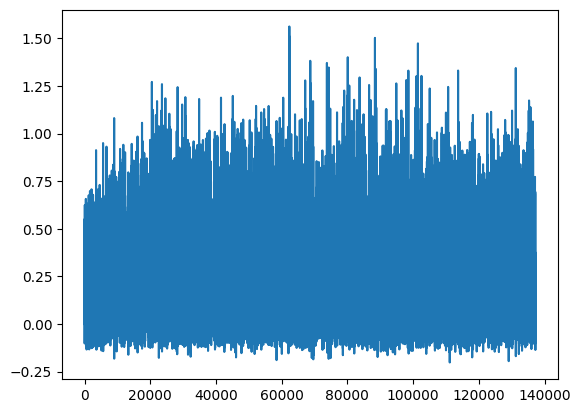

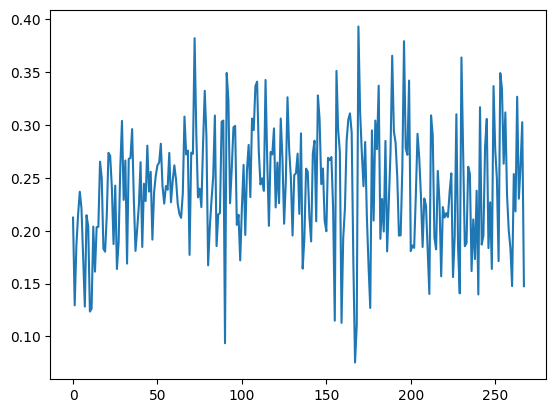

[PPO] Epoch 0: Loss=96.2497, Policy=0.0135, Value=192.5612
[PPO] Epoch 10: Loss=29.7322, Policy=-0.0061, Value=59.5669
[PPO] Epoch 20: Loss=14.3311, Policy=-0.0350, Value=28.8208
[PPO] Epoch 30: Loss=10.6682, Policy=-0.0505, Value=21.5241
Approx KL Learned: 0.06226898357272148
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 68/100 — steps: 2048


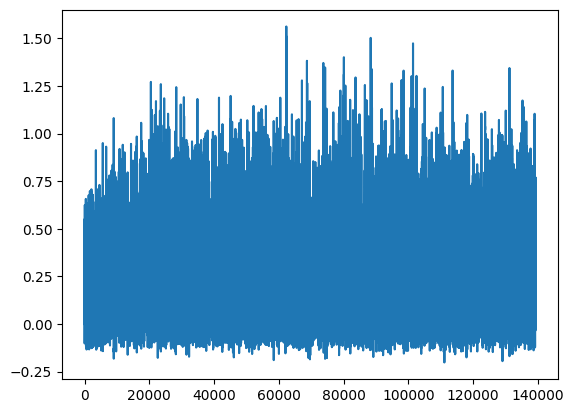

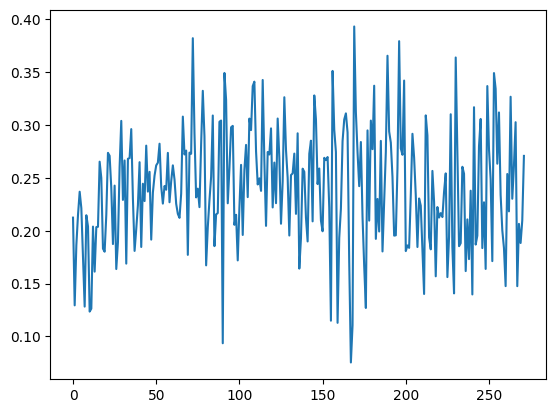

[PPO] Epoch 0: Loss=98.1224, Policy=0.0132, Value=196.2954
[PPO] Epoch 10: Loss=56.2257, Policy=-0.0047, Value=112.5398
[PPO] Epoch 20: Loss=27.7935, Policy=-0.0279, Value=55.7225
[PPO] Epoch 30: Loss=17.2461, Policy=-0.0354, Value=34.6444
Approx KL Learned: 0.04886060953140259
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 69/100 — steps: 2048


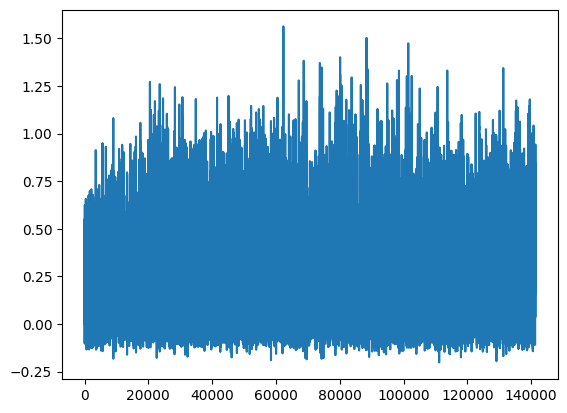

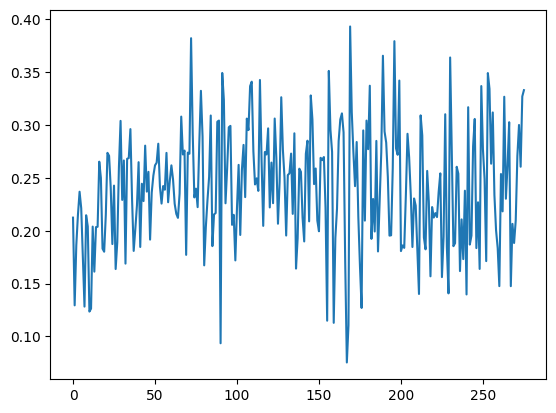

[PPO] Epoch 0: Loss=86.7696, Policy=0.0070, Value=173.6001
[PPO] Epoch 10: Loss=42.0772, Policy=-0.0091, Value=84.2491
[PPO] Epoch 20: Loss=19.4645, Policy=-0.0335, Value=39.0710
[PPO] Epoch 30: Loss=11.2674, Policy=-0.0217, Value=22.6447
Approx KL Learned: 0.06437396258115768
[✅] Actor-Critic checkpoint saved to chkpoint_69.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 70/100 — steps: 2048


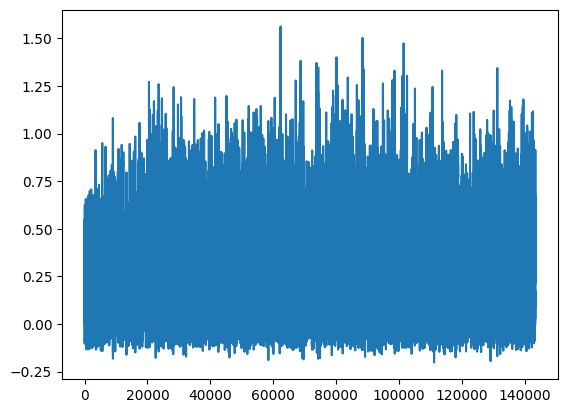

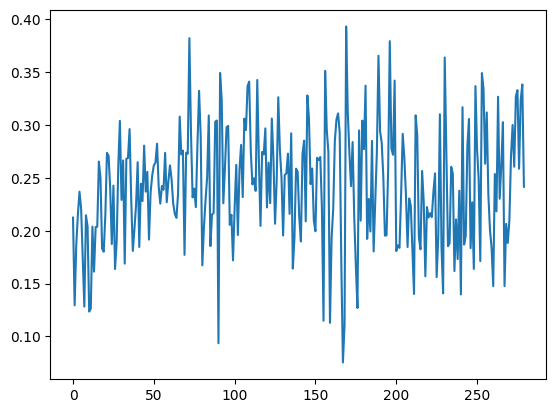

[PPO] Epoch 0: Loss=74.3805, Policy=0.0092, Value=148.8343
[PPO] Epoch 10: Loss=25.1639, Policy=-0.0123, Value=50.4424
[PPO] Epoch 20: Loss=14.1972, Policy=-0.0378, Value=28.5584
[PPO] Epoch 30: Loss=9.0424, Policy=-0.0580, Value=18.2892
Approx KL Learned: 0.04616329073905945
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 71/100 — steps: 2048


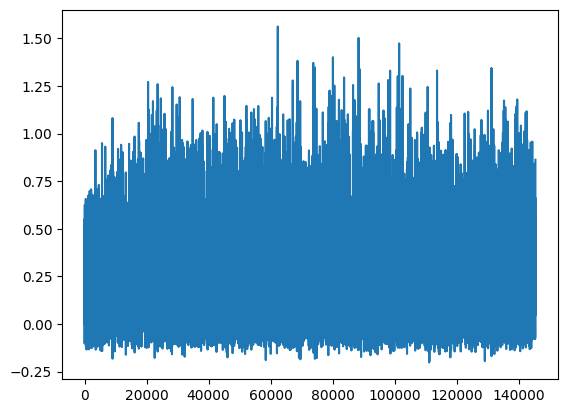

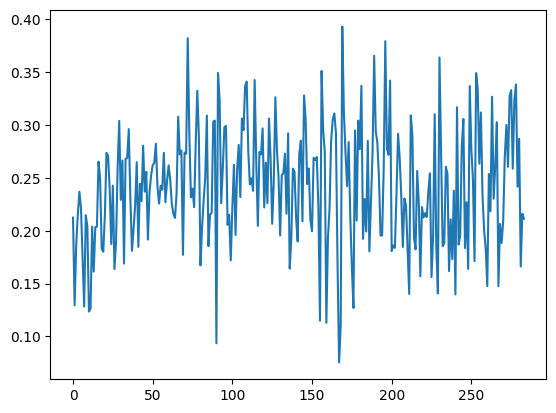

[PPO] Epoch 0: Loss=82.6331, Policy=0.0026, Value=165.3403
[PPO] Epoch 10: Loss=47.3681, Policy=-0.0183, Value=94.8541
[PPO] Epoch 20: Loss=22.9418, Policy=-0.0441, Value=46.0525
[PPO] Epoch 30: Loss=13.4337, Policy=-0.0603, Value=27.0687
Approx KL Learned: 0.05712420493364334
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 72/100 — steps: 2048


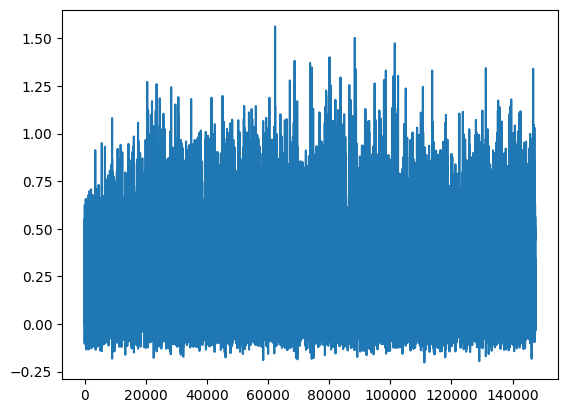

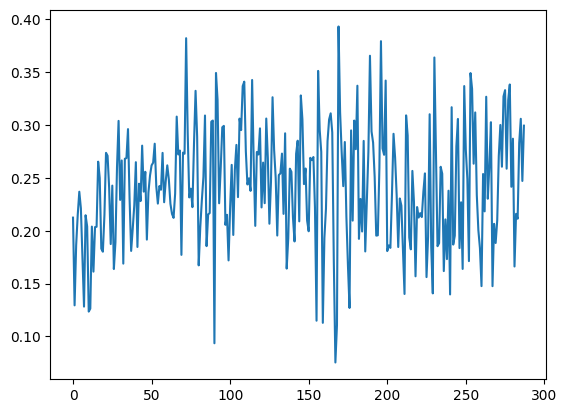

[PPO] Epoch 0: Loss=79.9924, Policy=0.0075, Value=160.0537
[PPO] Epoch 10: Loss=43.9132, Policy=-0.0127, Value=87.9350
[PPO] Epoch 20: Loss=30.5533, Policy=-0.0236, Value=61.2379
[PPO] Epoch 30: Loss=20.6341, Policy=-0.0390, Value=41.4261
Approx KL Learned: 0.027046717703342438
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 73/100 — steps: 2048


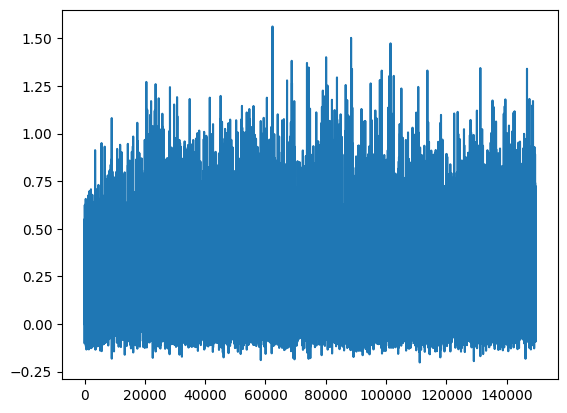

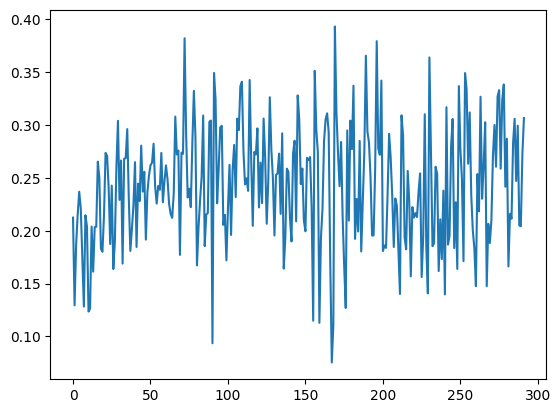

[PPO] Epoch 0: Loss=84.1172, Policy=0.0067, Value=168.3009
[PPO] Epoch 10: Loss=35.1550, Policy=-0.0193, Value=70.4282
[PPO] Epoch 20: Loss=14.9258, Policy=-0.0433, Value=30.0202
[PPO] Epoch 30: Loss=8.6505, Policy=-0.0639, Value=17.5089
Approx KL Learned: 0.06923389434814453
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 74/100 — steps: 2048


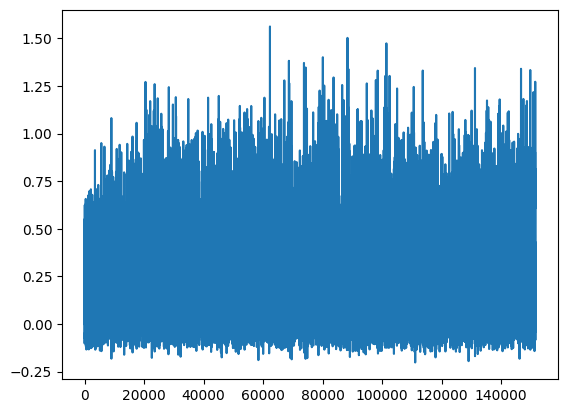

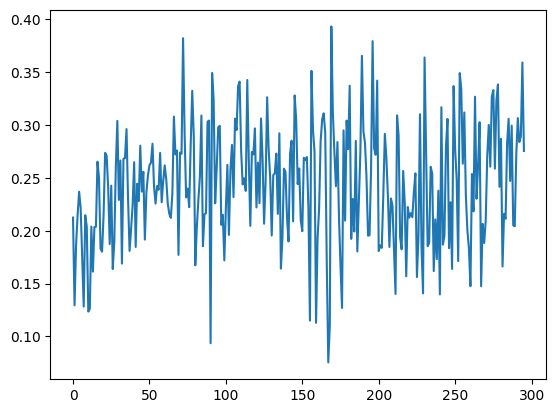

[PPO] Epoch 0: Loss=52.9797, Policy=0.0079, Value=106.0207
[PPO] Epoch 10: Loss=28.8434, Policy=-0.0146, Value=57.7956
[PPO] Epoch 20: Loss=16.3939, Policy=-0.0252, Value=32.9218
[PPO] Epoch 30: Loss=11.0789, Policy=-0.0538, Value=22.3442
Approx KL Learned: 0.05823000147938728
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 75/100 — steps: 2048


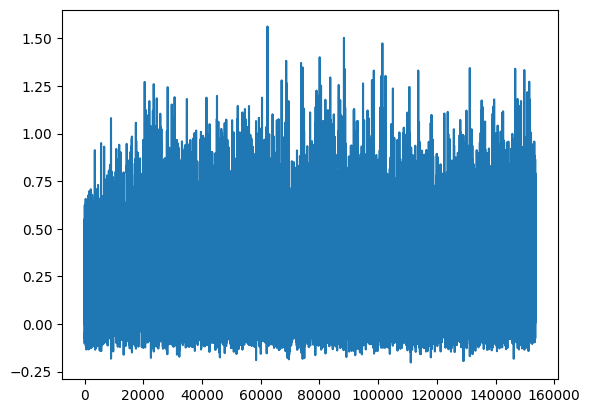

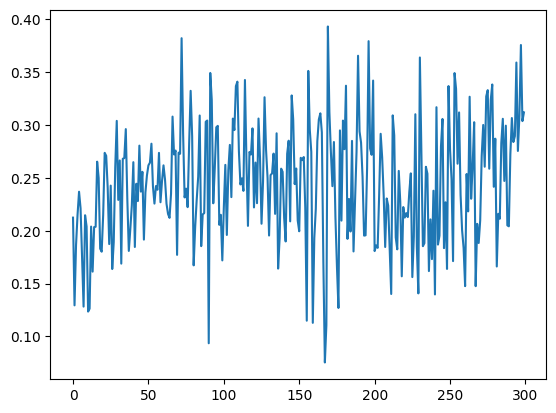

[PPO] Epoch 0: Loss=62.3168, Policy=0.0164, Value=124.6816
[PPO] Epoch 10: Loss=25.9100, Policy=-0.0180, Value=51.9358
[PPO] Epoch 20: Loss=12.1649, Policy=-0.0460, Value=24.5053
[PPO] Epoch 30: Loss=5.9255, Policy=-0.0625, Value=12.0528
Approx KL Learned: 0.09054137766361237
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 76/100 — steps: 2048


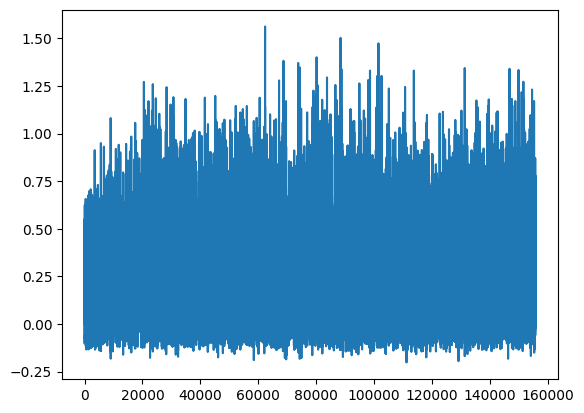

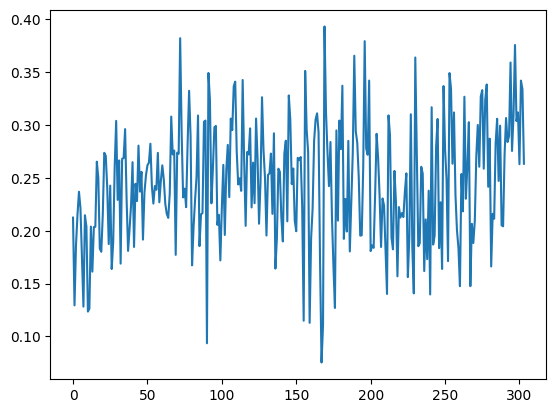

[PPO] Epoch 0: Loss=61.6163, Policy=0.0083, Value=123.2973
[PPO] Epoch 10: Loss=22.9244, Policy=-0.0182, Value=45.9660
[PPO] Epoch 20: Loss=10.3895, Policy=-0.0459, Value=20.9513
[PPO] Epoch 30: Loss=5.9969, Policy=-0.0670, Value=12.2070
Approx KL Learned: 0.0677807405591011
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 77/100 — steps: 2048


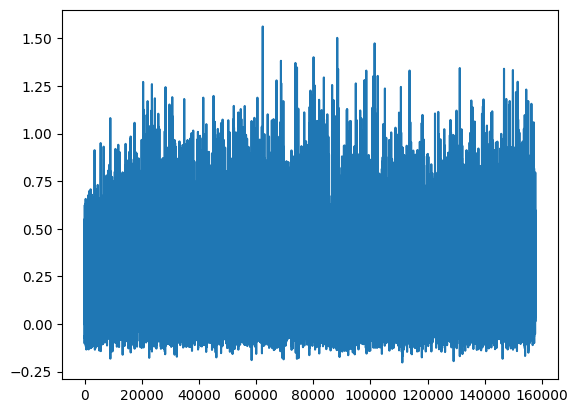

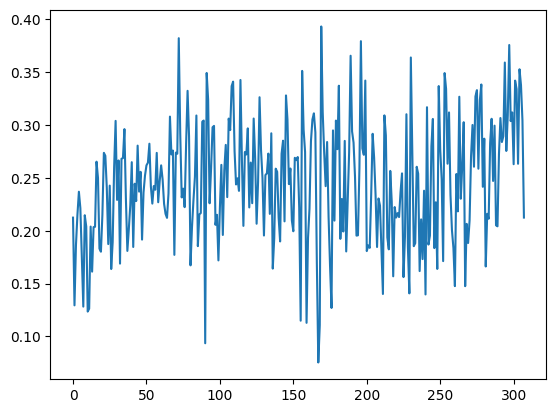

[PPO] Epoch 0: Loss=117.8992, Policy=0.0150, Value=235.8500
[PPO] Epoch 10: Loss=43.0689, Policy=-0.0021, Value=86.2241
[PPO] Epoch 20: Loss=28.6523, Policy=-0.0179, Value=57.4206
[PPO] Epoch 30: Loss=19.7272, Policy=-0.0343, Value=39.6040
Approx KL Learned: 0.02698090299963951
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 78/100 — steps: 2048


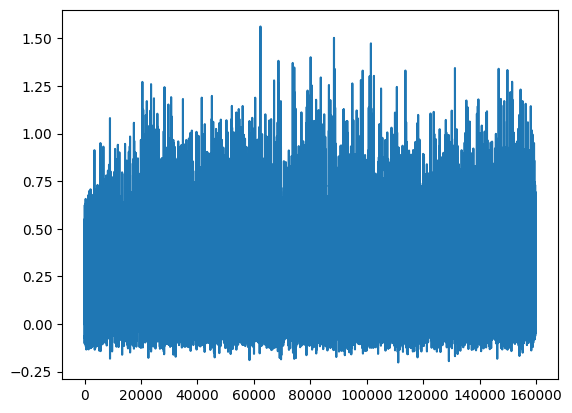

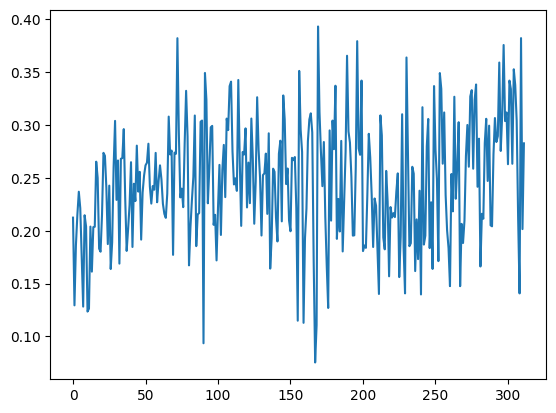

[PPO] Epoch 0: Loss=96.1552, Policy=0.0204, Value=192.3367
[PPO] Epoch 10: Loss=65.1527, Policy=0.0042, Value=130.3634
[PPO] Epoch 20: Loss=45.4141, Policy=-0.0010, Value=90.8977
[PPO] Epoch 30: Loss=36.9499, Policy=-0.0150, Value=74.0028
Approx KL Learned: 0.08140778541564941
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 79/100 — steps: 2048


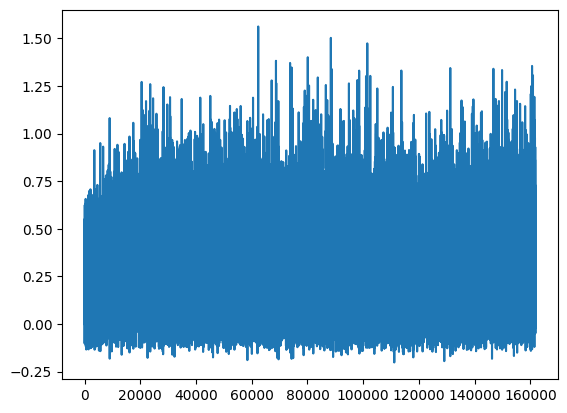

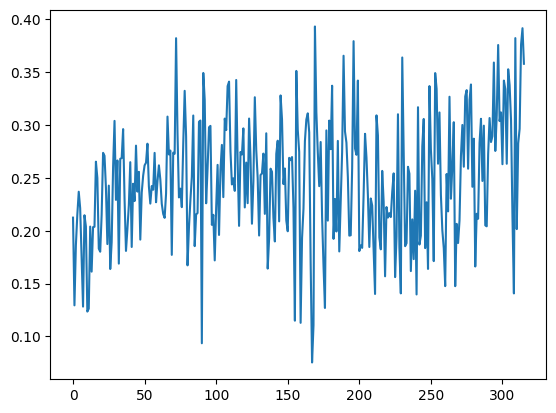

[PPO] Epoch 0: Loss=72.5582, Policy=0.0055, Value=145.1823
[PPO] Epoch 10: Loss=32.2970, Policy=-0.0143, Value=64.6996
[PPO] Epoch 20: Loss=15.1310, Policy=-0.0493, Value=30.4362
[PPO] Epoch 30: Loss=12.5311, Policy=-0.0584, Value=25.2573
Approx KL Learned: 0.06934981048107147
[✅] Actor-Critic checkpoint saved to chkpoint_79.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 80/100 — steps: 2048


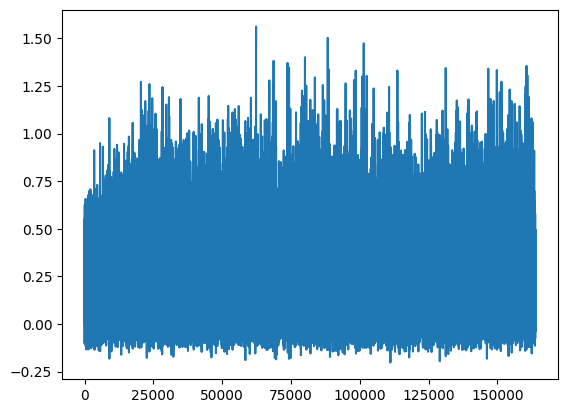

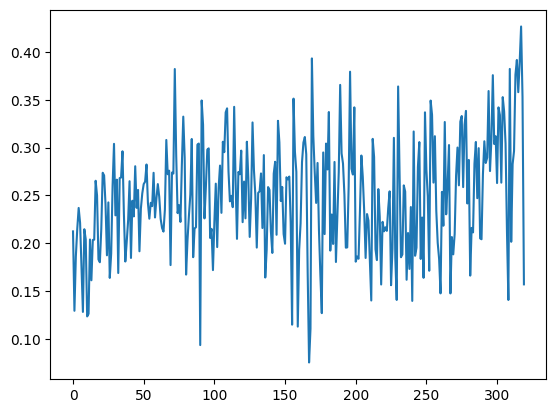

[PPO] Epoch 0: Loss=89.1081, Policy=0.0093, Value=178.2688
[PPO] Epoch 10: Loss=44.2836, Policy=0.0050, Value=88.6312
[PPO] Epoch 20: Loss=35.0107, Policy=-0.0069, Value=70.1114
[PPO] Epoch 30: Loss=17.9036, Policy=-0.0304, Value=35.9386
Approx KL Learned: 0.0442996583878994
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 81/100 — steps: 2048


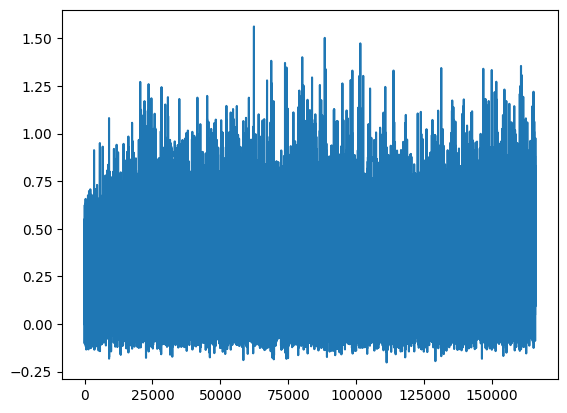

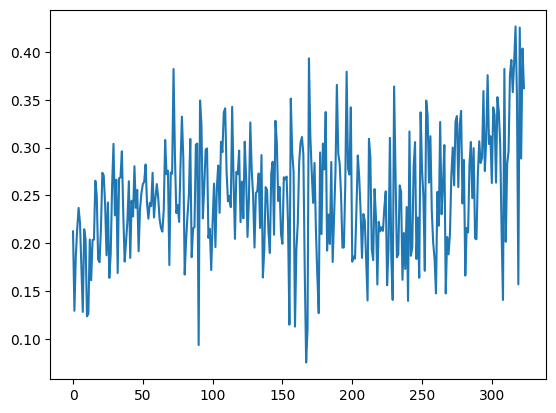

[PPO] Epoch 0: Loss=76.5647, Policy=0.0092, Value=153.1882
[PPO] Epoch 10: Loss=33.6226, Policy=-0.0097, Value=67.3435
[PPO] Epoch 20: Loss=21.8483, Policy=-0.0277, Value=43.8294
[PPO] Epoch 30: Loss=17.1803, Policy=-0.0432, Value=34.5225
Approx KL Learned: 0.035407163202762604
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 82/100 — steps: 2048


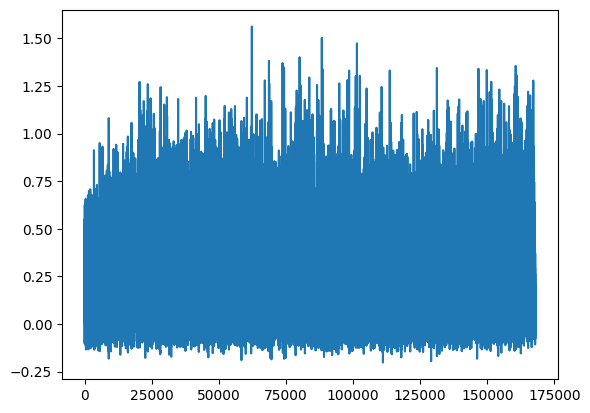

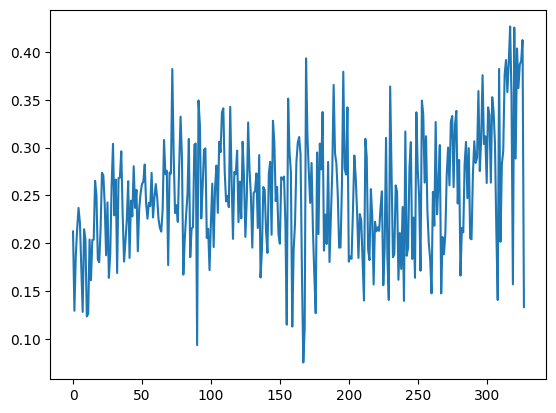

[PPO] Epoch 0: Loss=85.5045, Policy=0.0073, Value=171.0803
[PPO] Epoch 10: Loss=42.2547, Policy=0.0038, Value=84.5855
[PPO] Epoch 20: Loss=24.9439, Policy=-0.0186, Value=50.0120
[PPO] Epoch 30: Loss=14.0115, Policy=-0.0451, Value=28.1998
Approx KL Learned: 0.05178020894527435
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 83/100 — steps: 2048


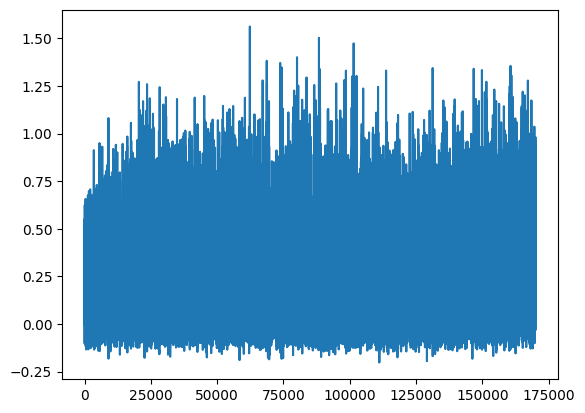

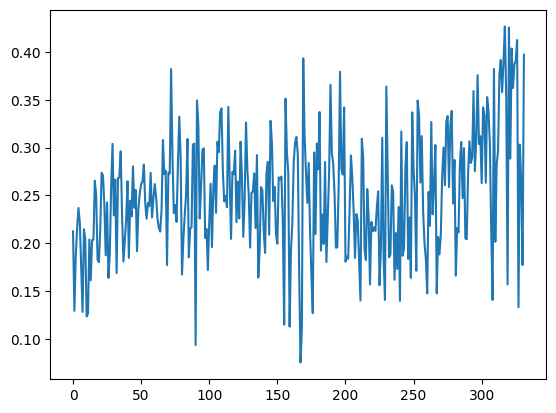

[PPO] Epoch 0: Loss=72.3694, Policy=0.0147, Value=144.7817
[PPO] Epoch 10: Loss=40.0852, Policy=-0.0022, Value=80.2513
[PPO] Epoch 20: Loss=30.3419, Policy=-0.0300, Value=60.8163
[PPO] Epoch 30: Loss=24.7161, Policy=-0.0477, Value=49.5979
Approx KL Learned: 0.060412295162677765
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 84/100 — steps: 2048


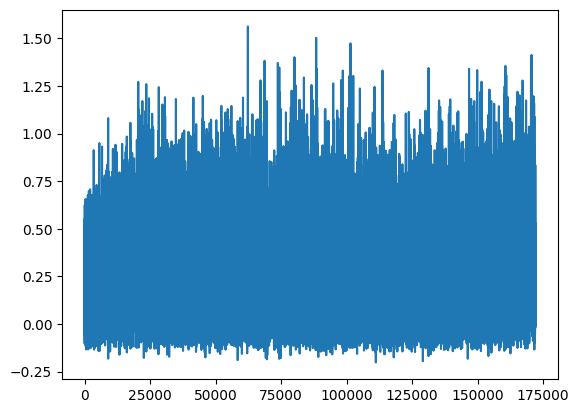

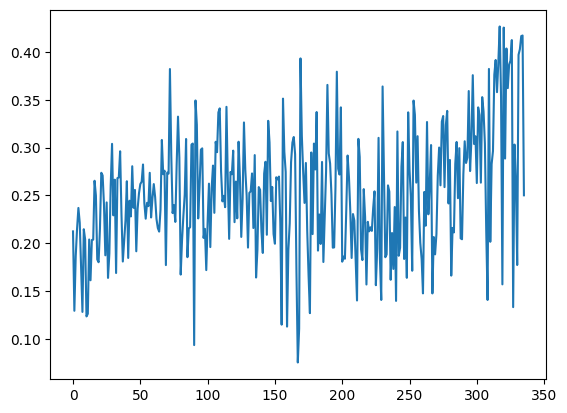

[PPO] Epoch 0: Loss=50.3486, Policy=0.0088, Value=100.7502
[PPO] Epoch 10: Loss=30.8507, Policy=-0.0092, Value=61.7938
[PPO] Epoch 20: Loss=22.2116, Policy=-0.0390, Value=44.5725
[PPO] Epoch 30: Loss=17.8969, Policy=-0.0567, Value=35.9764
Approx KL Learned: 0.13087108731269836
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 85/100 — steps: 2048


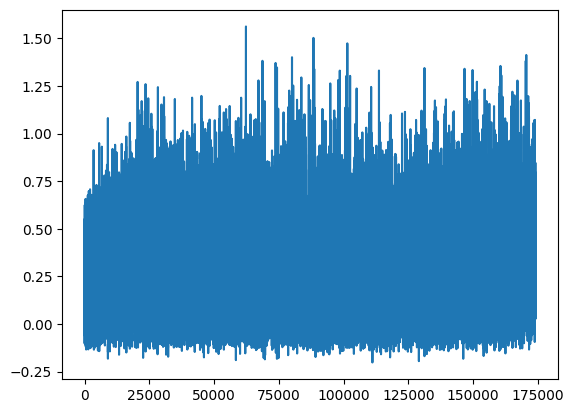

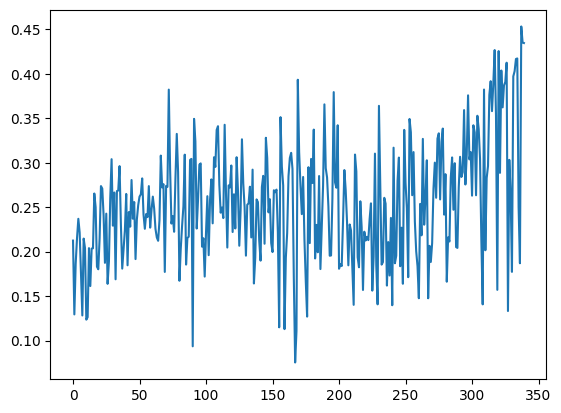

[PPO] Epoch 0: Loss=85.5860, Policy=0.0258, Value=171.1939
[PPO] Epoch 10: Loss=50.2160, Policy=0.0118, Value=100.4845
[PPO] Epoch 20: Loss=23.5849, Policy=-0.0161, Value=47.2808
[PPO] Epoch 30: Loss=11.7615, Policy=-0.0474, Value=23.6957
Approx KL Learned: 0.13326269388198853
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 86/100 — steps: 2048


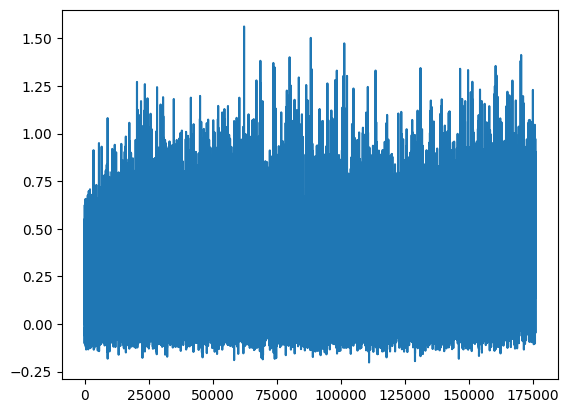

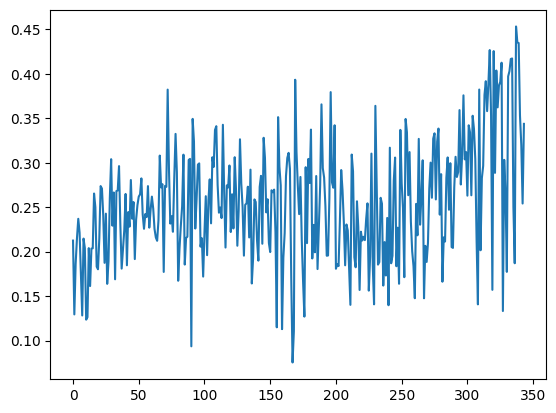

[PPO] Epoch 0: Loss=69.1449, Policy=0.0086, Value=138.3386
[PPO] Epoch 10: Loss=39.7532, Policy=0.0049, Value=79.5636
[PPO] Epoch 20: Loss=27.8647, Policy=-0.0291, Value=55.8488
[PPO] Epoch 30: Loss=23.9538, Policy=-0.0446, Value=48.0616
Approx KL Learned: 0.10713796317577362
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 87/100 — steps: 2048


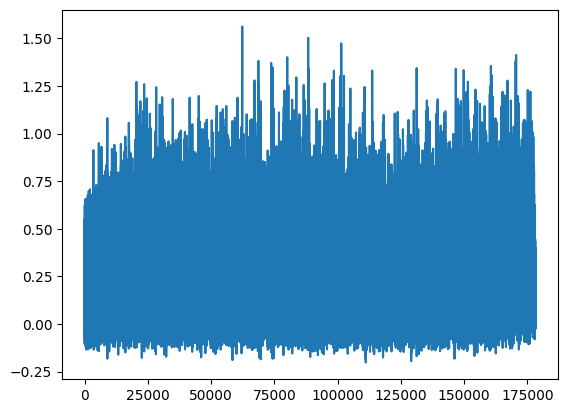

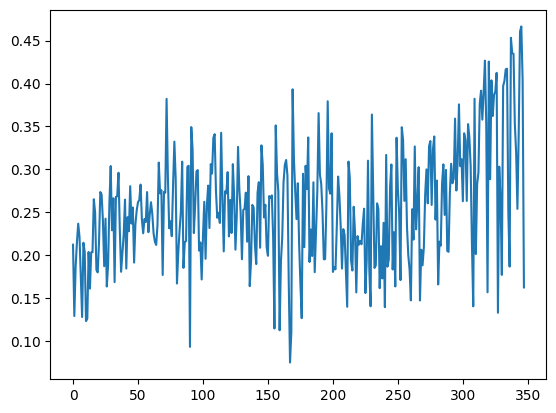

[PPO] Epoch 0: Loss=81.7722, Policy=0.0141, Value=163.5773
[PPO] Epoch 10: Loss=43.3168, Policy=0.0304, Value=86.6372
[PPO] Epoch 20: Loss=21.0499, Policy=-0.0027, Value=42.1630
[PPO] Epoch 30: Loss=14.1925, Policy=-0.0190, Value=28.4857
Approx KL Learned: 0.06804772466421127
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 88/100 — steps: 2048


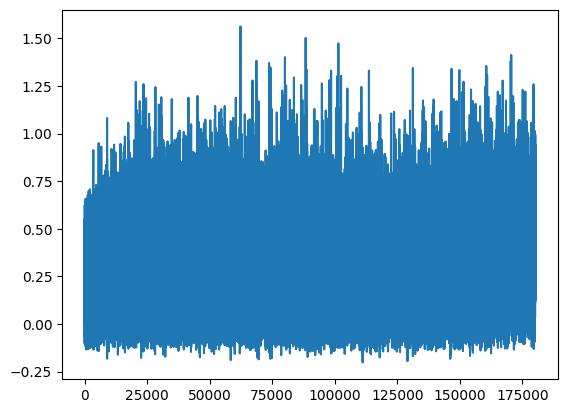

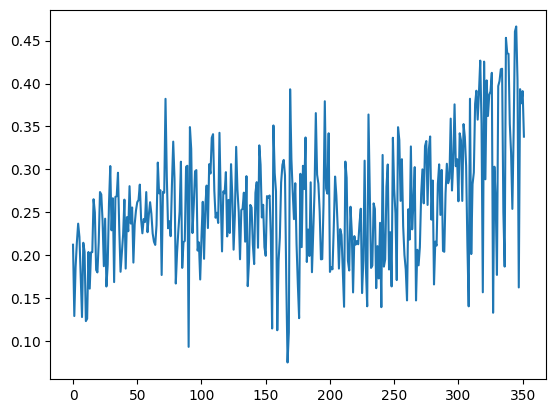

[PPO] Epoch 0: Loss=60.5364, Policy=0.0060, Value=121.1153
[PPO] Epoch 10: Loss=32.1628, Policy=-0.0043, Value=64.3873
[PPO] Epoch 20: Loss=18.6736, Policy=-0.0280, Value=37.4572
[PPO] Epoch 30: Loss=20.0405, Policy=-0.0425, Value=40.2187
Approx KL Learned: 0.06377847492694855
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 89/100 — steps: 2048


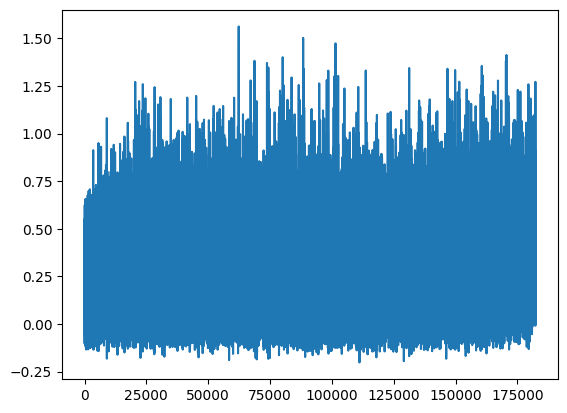

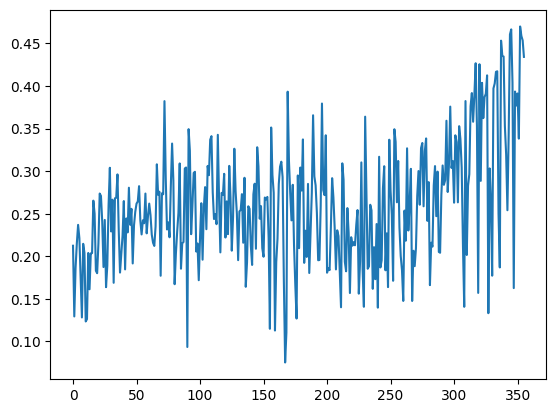

[PPO] Epoch 0: Loss=78.9257, Policy=0.0071, Value=157.8934
[PPO] Epoch 10: Loss=33.0298, Policy=-0.0038, Value=66.1263
[PPO] Epoch 20: Loss=15.4224, Policy=-0.0258, Value=30.9542
[PPO] Epoch 30: Loss=7.0102, Policy=-0.0424, Value=14.1636
Approx KL Learned: 0.055324748158454895
[✅] Actor-Critic checkpoint saved to chkpoint_89.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 90/100 — steps: 2048


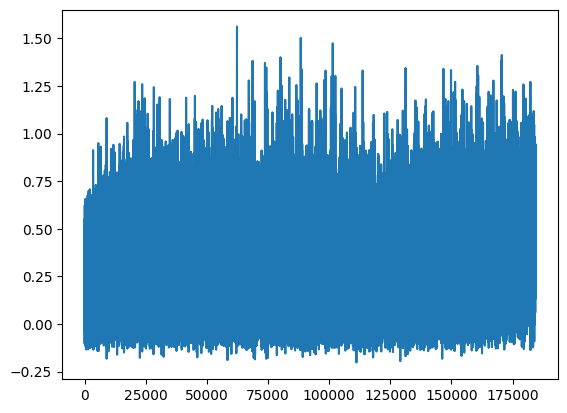

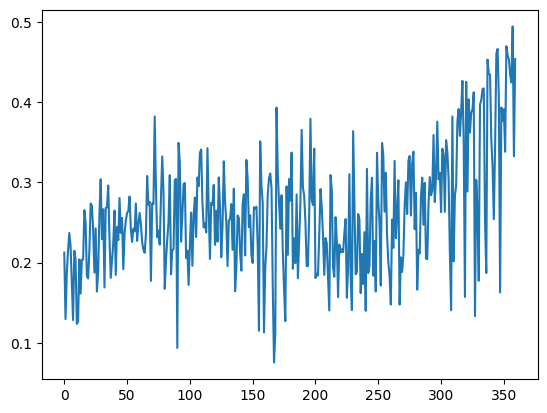

[PPO] Epoch 0: Loss=94.9281, Policy=0.0139, Value=189.8998
[PPO] Epoch 10: Loss=37.3451, Policy=0.0011, Value=74.7574
[PPO] Epoch 20: Loss=15.0616, Policy=-0.0230, Value=30.2407
[PPO] Epoch 30: Loss=7.3532, Policy=-0.0427, Value=14.8621
Approx KL Learned: 0.08805381506681442
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 91/100 — steps: 2048


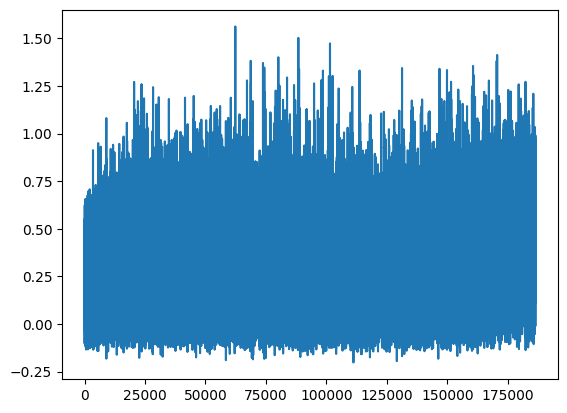

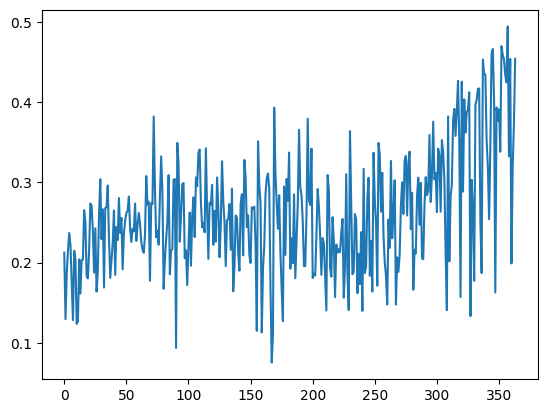

[PPO] Epoch 0: Loss=82.6098, Policy=0.0153, Value=165.2550
[PPO] Epoch 10: Loss=32.5195, Policy=-0.0018, Value=65.1090
[PPO] Epoch 20: Loss=18.0253, Policy=-0.0247, Value=36.1651
[PPO] Epoch 30: Loss=12.4387, Policy=-0.0452, Value=25.0295
Approx KL Learned: 0.050076331943273544
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 92/100 — steps: 2048


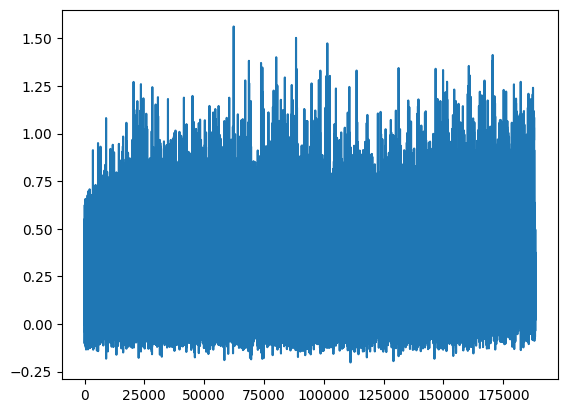

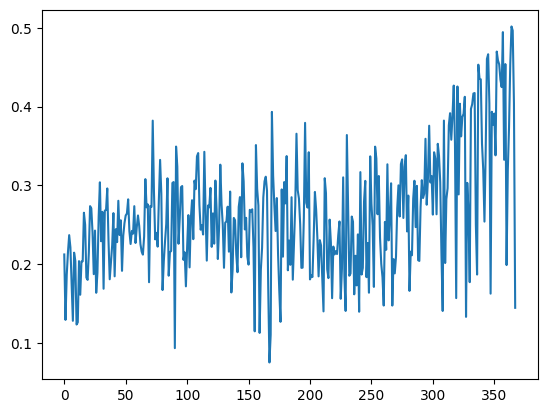

[PPO] Epoch 0: Loss=75.8694, Policy=0.0176, Value=151.7492
[PPO] Epoch 10: Loss=30.6355, Policy=0.0012, Value=61.3168
[PPO] Epoch 20: Loss=21.2850, Policy=-0.0165, Value=42.6513
[PPO] Epoch 30: Loss=13.4877, Policy=-0.0342, Value=27.0927
Approx KL Learned: 0.08088404685258865
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 93/100 — steps: 2048


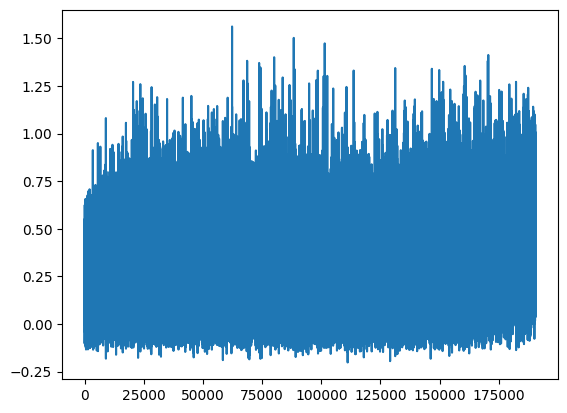

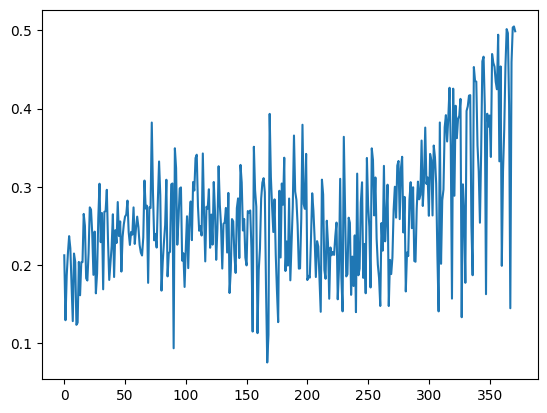

[PPO] Epoch 0: Loss=72.8264, Policy=0.0103, Value=145.6945
[PPO] Epoch 10: Loss=32.8646, Policy=-0.0067, Value=65.8036
[PPO] Epoch 20: Loss=24.5550, Policy=-0.0290, Value=49.2266
[PPO] Epoch 30: Loss=14.1134, Policy=-0.0355, Value=28.3596
Approx KL Learned: 0.06960403919219971
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 94/100 — steps: 2048


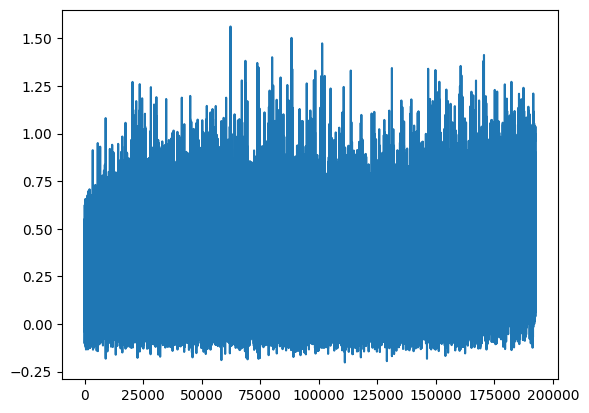

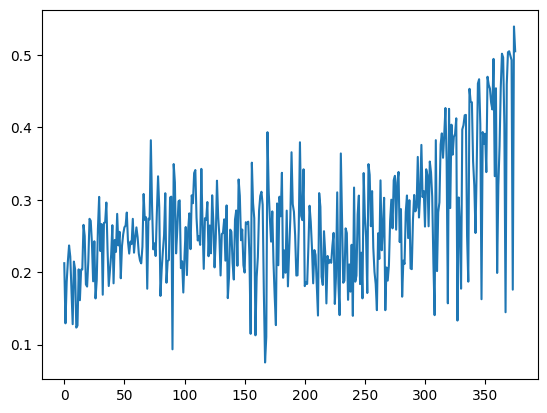

[PPO] Epoch 0: Loss=73.4169, Policy=0.0002, Value=146.9047
[PPO] Epoch 10: Loss=37.7393, Policy=-0.0074, Value=75.5665
[PPO] Epoch 20: Loss=27.0679, Policy=-0.0277, Value=54.2606
[PPO] Epoch 30: Loss=22.5207, Policy=-0.0447, Value=45.1997
Approx KL Learned: 0.05126980319619179
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 95/100 — steps: 2048


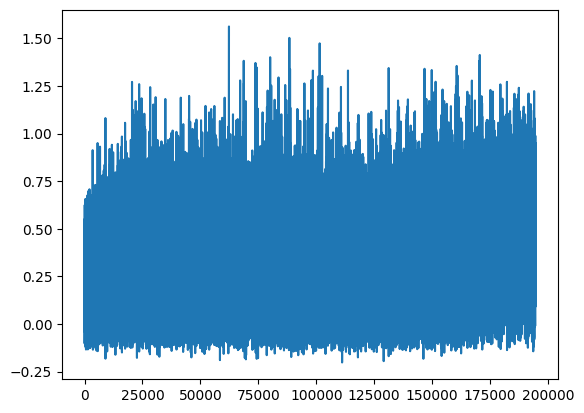

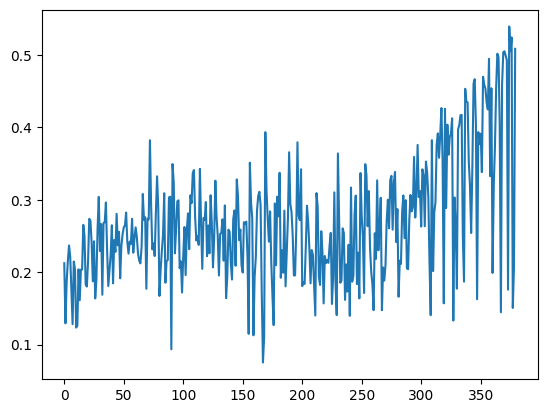

[PPO] Epoch 0: Loss=76.6283, Policy=0.0099, Value=153.2794
[PPO] Epoch 10: Loss=38.5668, Policy=-0.0086, Value=77.1941
[PPO] Epoch 20: Loss=20.1425, Policy=-0.0229, Value=40.3760
[PPO] Epoch 30: Loss=14.0258, Policy=-0.0371, Value=28.1714
Approx KL Learned: 0.08829374611377716
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 96/100 — steps: 2048


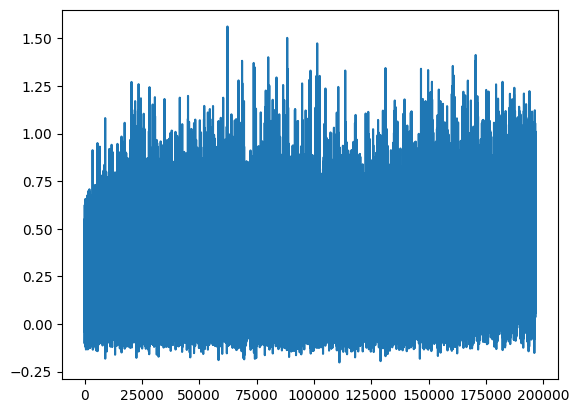

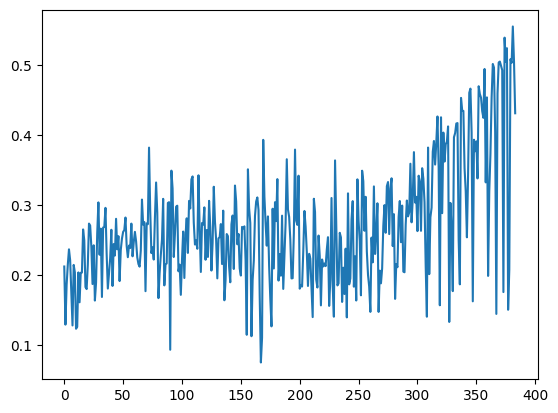

[PPO] Epoch 0: Loss=75.1682, Policy=0.0160, Value=150.3769
[PPO] Epoch 10: Loss=38.5211, Policy=-0.0023, Value=77.1208
[PPO] Epoch 20: Loss=29.7578, Policy=-0.0184, Value=59.6248
[PPO] Epoch 30: Loss=25.1665, Policy=-0.0350, Value=50.4737
Approx KL Learned: 0.04245679825544357
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 97/100 — steps: 2048


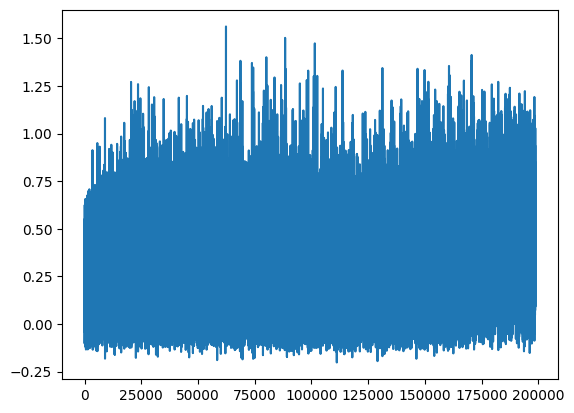

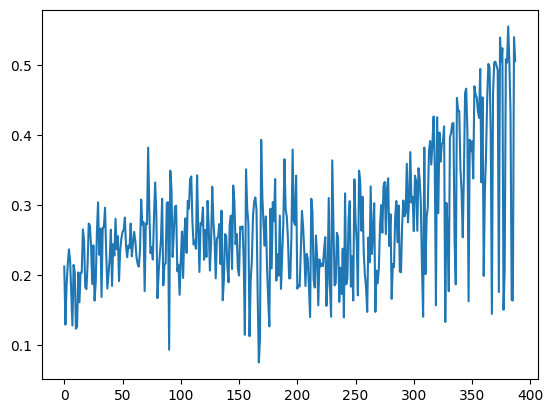

[PPO] Epoch 0: Loss=62.3546, Policy=0.0101, Value=124.7614
[PPO] Epoch 10: Loss=37.7796, Policy=-0.0051, Value=75.6409
[PPO] Epoch 20: Loss=30.1487, Policy=-0.0222, Value=60.4141
[PPO] Epoch 30: Loss=19.0671, Policy=-0.0400, Value=38.2844
Approx KL Learned: 0.06311600655317307
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 98/100 — steps: 2048


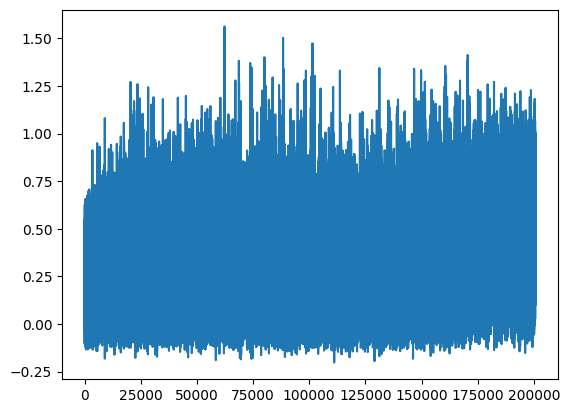

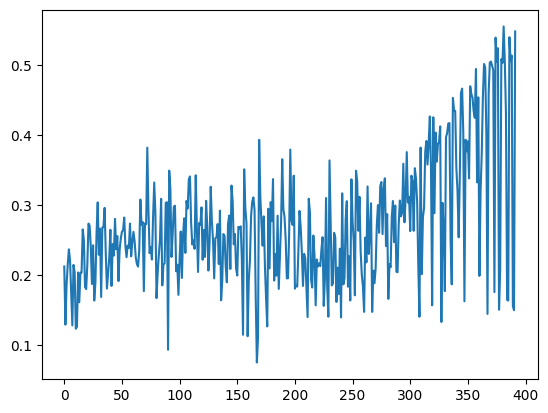

[PPO] Epoch 0: Loss=68.4799, Policy=0.0131, Value=136.9831
[PPO] Epoch 10: Loss=42.8863, Policy=-0.0052, Value=85.8325
[PPO] Epoch 20: Loss=35.6117, Policy=-0.0231, Value=71.3217
[PPO] Epoch 30: Loss=30.2575, Policy=-0.0389, Value=60.6435
Approx KL Learned: 0.08490872383117676
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 99/100 — steps: 2048


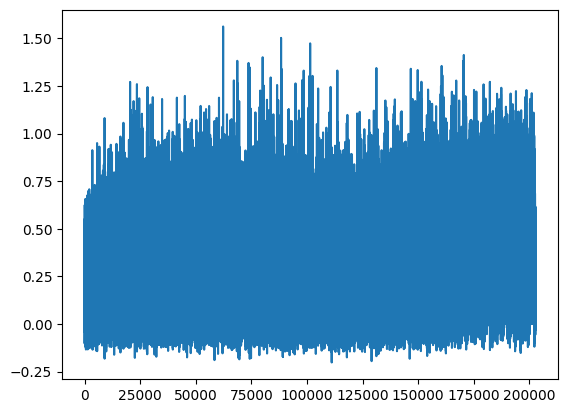

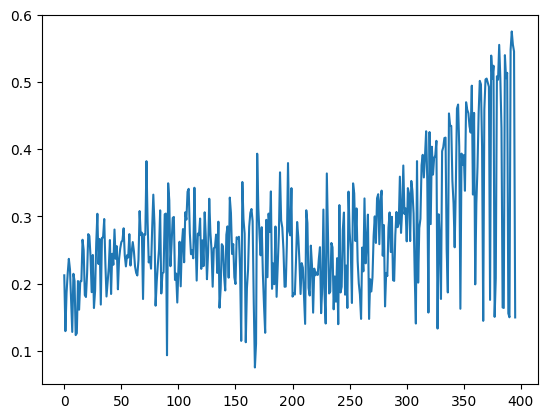

[PPO] Epoch 0: Loss=181.2437, Policy=0.0103, Value=362.5692
[PPO] Epoch 10: Loss=74.8422, Policy=-0.0024, Value=149.7919
[PPO] Epoch 20: Loss=42.1086, Policy=-0.0249, Value=84.3668
[PPO] Epoch 30: Loss=27.2661, Policy=-0.0312, Value=54.6960
Approx KL Learned: 0.03589315339922905
[✅] Actor-Critic checkpoint saved to chkpoint_99.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 100/100 — steps: 2048


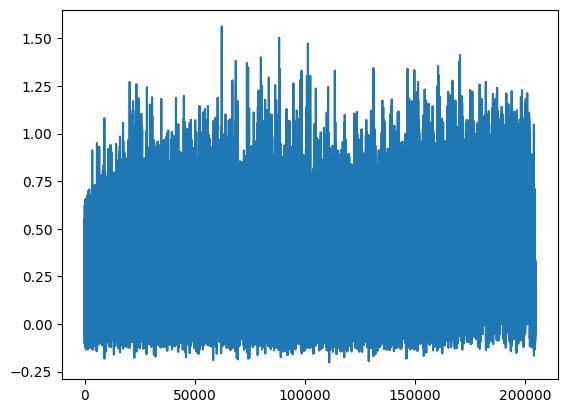

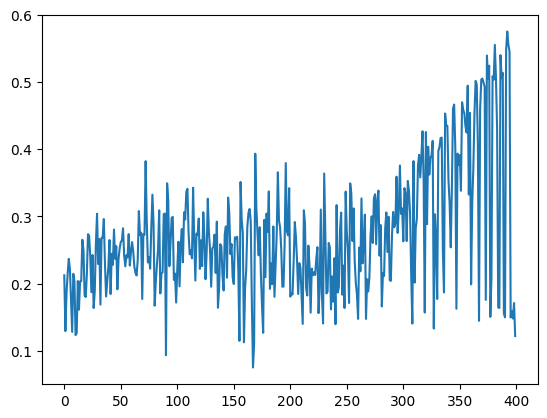

In [7]:
buf, rewards = train(controller, "clip_actor_critic_checkpoint_long_training.pt", ppo, clip_env, clip_actor_critic, 100)

[PPO] Epoch 0: Loss=88.0769, Policy=0.0110, Value=176.1808
[PPO] Epoch 10: Loss=30.1053, Policy=-0.0079, Value=60.2778
[PPO] Epoch 20: Loss=17.4728, Policy=-0.0293, Value=35.0505
[PPO] Epoch 30: Loss=10.0778, Policy=-0.0471, Value=20.2991
Approx KL Learned: 0.05416448414325714
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 1/100 — steps: 2048


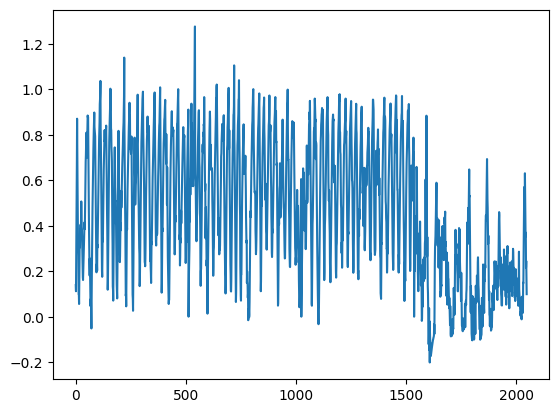

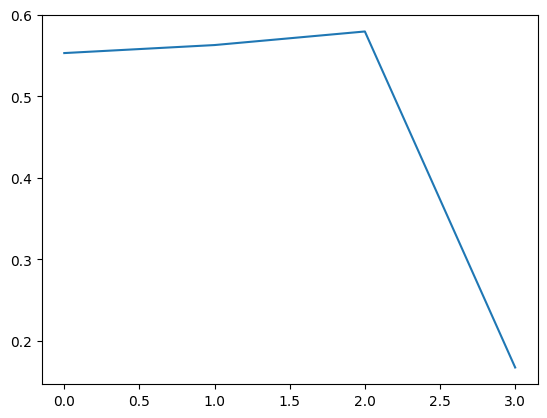

[PPO] Epoch 0: Loss=118.9301, Policy=0.0110, Value=237.9253
[PPO] Epoch 10: Loss=38.5040, Policy=0.0093, Value=77.0763
[PPO] Epoch 20: Loss=34.6468, Policy=-0.0077, Value=69.3943
[PPO] Epoch 30: Loss=30.2992, Policy=-0.0023, Value=60.6897
Approx KL Learned: 0.03507554903626442
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 2/100 — steps: 2048


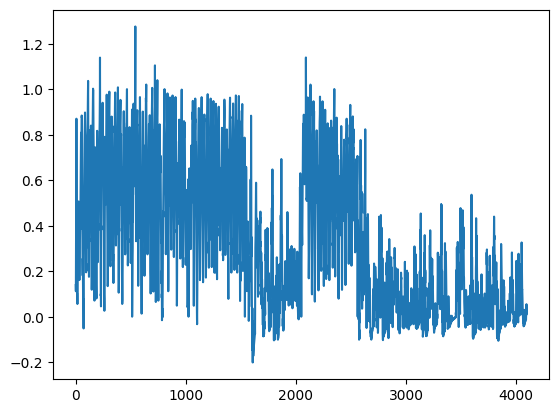

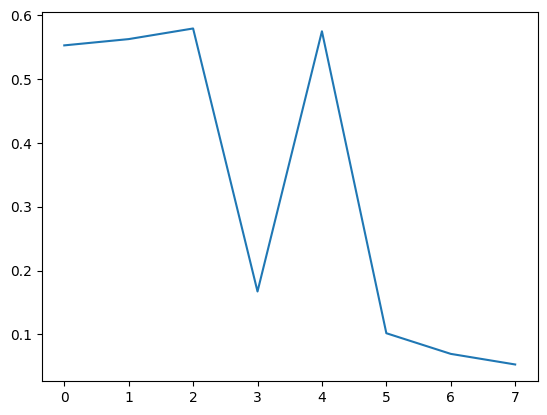

[PPO] Epoch 0: Loss=158.3675, Policy=0.0158, Value=316.7791
[PPO] Epoch 10: Loss=77.4949, Policy=0.0057, Value=155.0553
[PPO] Epoch 20: Loss=45.9489, Policy=-0.0220, Value=92.0196
[PPO] Epoch 30: Loss=35.6091, Policy=-0.0419, Value=71.3778
Approx KL Learned: 0.06047386676073074
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 3/100 — steps: 2048


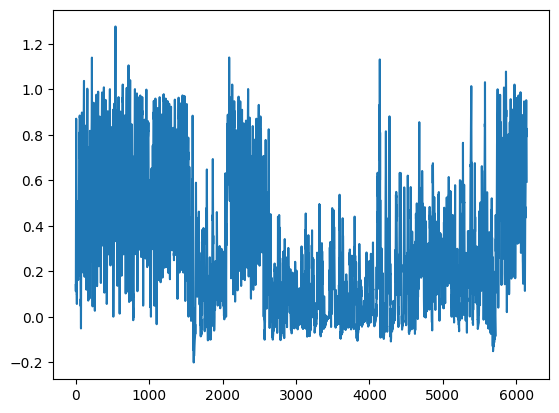

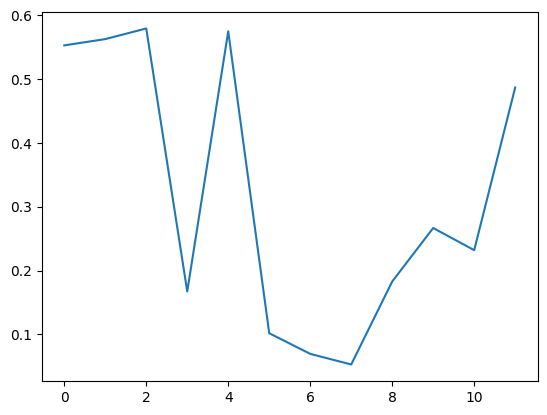

[PPO] Epoch 0: Loss=179.1168, Policy=0.0068, Value=358.2975
[PPO] Epoch 10: Loss=80.3137, Policy=0.0144, Value=160.6830
[PPO] Epoch 20: Loss=37.9387, Policy=-0.0140, Value=75.9932
[PPO] Epoch 30: Loss=21.4623, Policy=-0.0307, Value=43.0688
Approx KL Learned: 0.08193258941173553
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 4/100 — steps: 2048


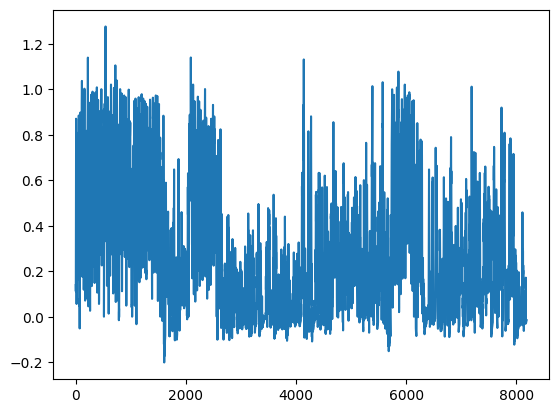

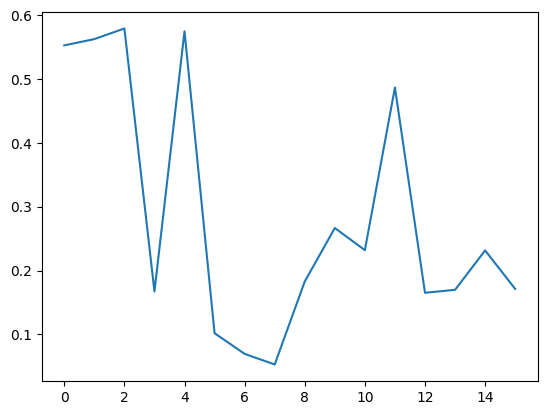

[PPO] Epoch 0: Loss=112.9537, Policy=0.0111, Value=225.9465
[PPO] Epoch 10: Loss=60.2272, Policy=-0.0044, Value=120.5255
[PPO] Epoch 20: Loss=38.4308, Policy=-0.0232, Value=76.9759
[PPO] Epoch 30: Loss=34.3651, Policy=-0.0456, Value=68.8886
Approx KL Learned: 0.09468930214643478
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 5/100 — steps: 2048


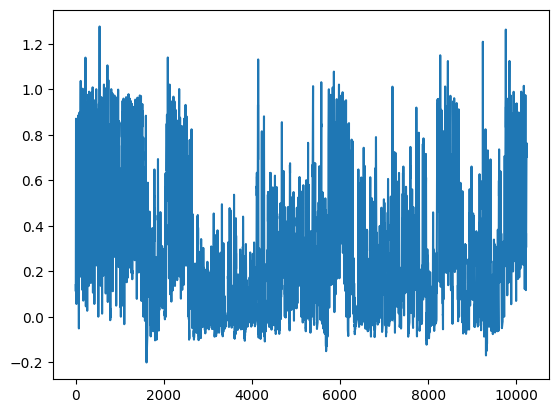

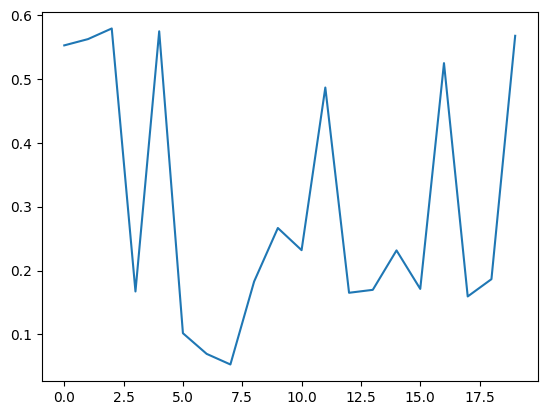

[PPO] Epoch 0: Loss=163.0760, Policy=0.0132, Value=326.1654
[PPO] Epoch 10: Loss=57.4838, Policy=0.0061, Value=114.9953
[PPO] Epoch 20: Loss=36.2213, Policy=0.0009, Value=72.4814
[PPO] Epoch 30: Loss=21.0974, Policy=-0.0129, Value=42.2629
Approx KL Learned: 0.06790877878665924
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 6/100 — steps: 2048


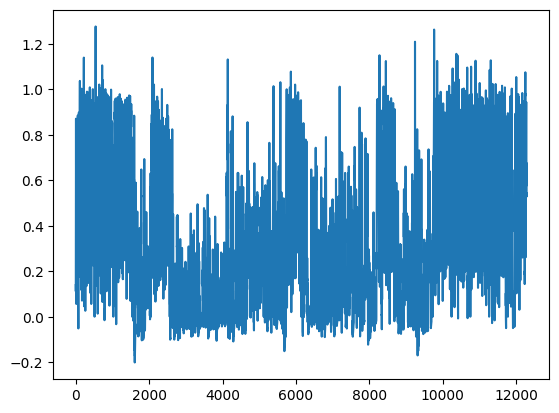

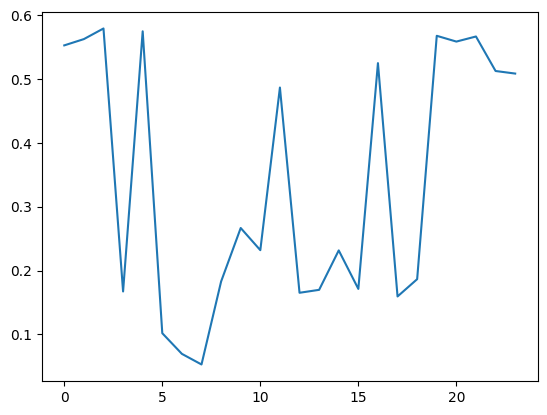

[PPO] Epoch 0: Loss=130.7062, Policy=0.0150, Value=261.4396
[PPO] Epoch 10: Loss=53.6498, Policy=0.0053, Value=107.3400
[PPO] Epoch 20: Loss=23.2827, Policy=-0.0173, Value=46.6516
[PPO] Epoch 30: Loss=18.5008, Policy=-0.0269, Value=37.1108
Approx KL Learned: 0.0548524372279644
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 7/100 — steps: 2048


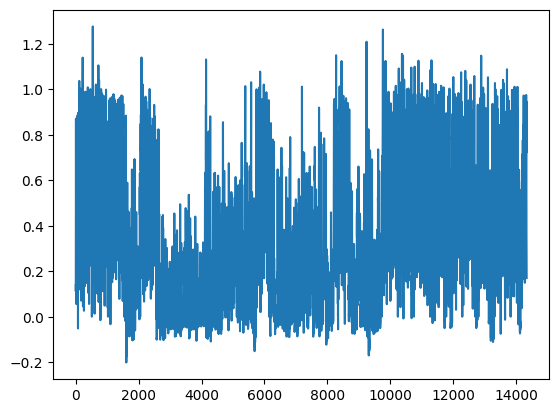

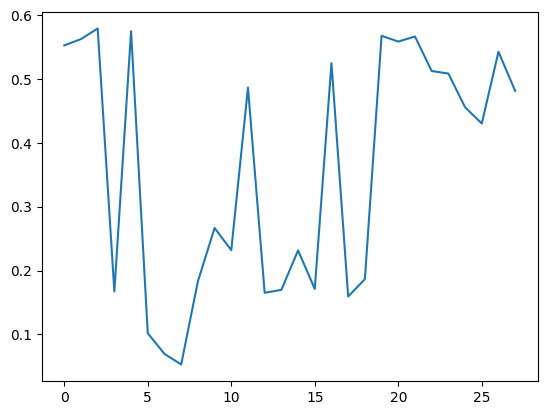

[PPO] Epoch 0: Loss=81.3106, Policy=0.0139, Value=162.6497
[PPO] Epoch 10: Loss=24.5657, Policy=-0.0041, Value=49.1938
[PPO] Epoch 20: Loss=15.5588, Policy=-0.0157, Value=31.2025
[PPO] Epoch 30: Loss=7.7016, Policy=-0.0378, Value=15.5334
Approx KL Learned: 0.02943704091012478
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 8/100 — steps: 2048


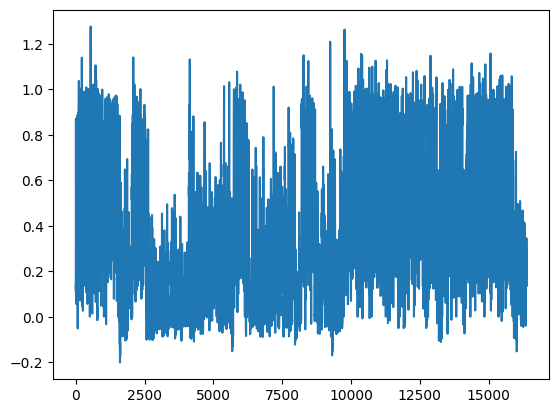

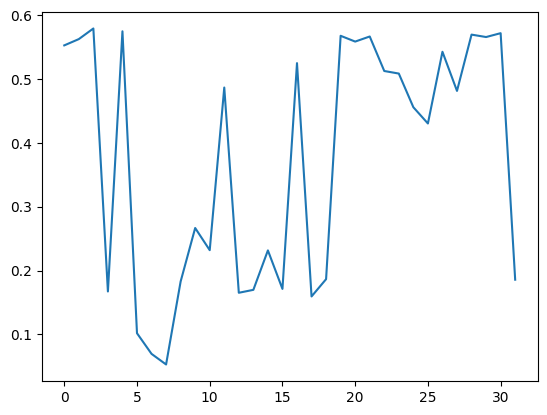

[PPO] Epoch 0: Loss=76.1420, Policy=0.0104, Value=152.3048
[PPO] Epoch 10: Loss=33.7571, Policy=-0.0002, Value=67.5489
[PPO] Epoch 20: Loss=19.5022, Policy=-0.0147, Value=39.0746
[PPO] Epoch 30: Loss=15.6363, Policy=-0.0189, Value=31.3537
Approx KL Learned: 0.0577954426407814
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 9/100 — steps: 2048


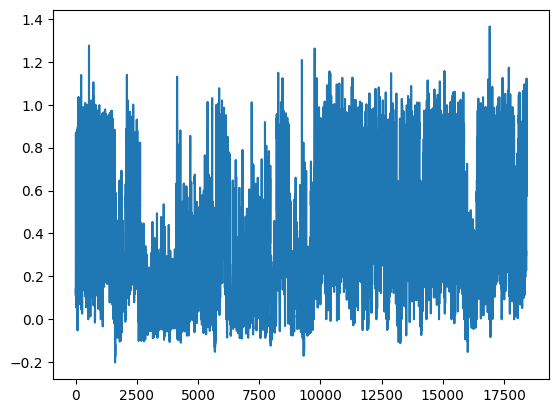

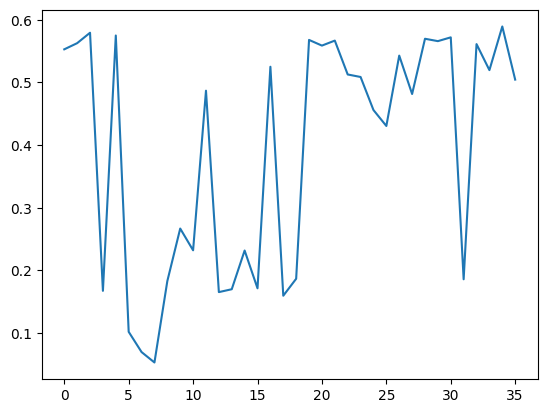

[PPO] Epoch 0: Loss=65.4605, Policy=0.0068, Value=130.9464
[PPO] Epoch 10: Loss=37.5556, Policy=-0.0014, Value=75.1552
[PPO] Epoch 20: Loss=26.3425, Policy=-0.0116, Value=52.7543
[PPO] Epoch 30: Loss=17.5477, Policy=-0.0273, Value=35.1977
Approx KL Learned: 0.07614479959011078
[✅] Actor-Critic checkpoint saved to chkpoint_9.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 10/100 — steps: 2048


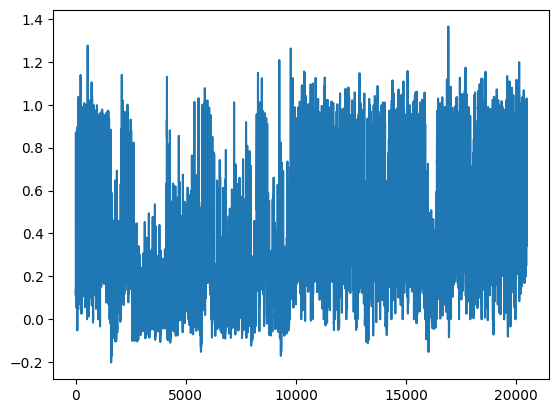

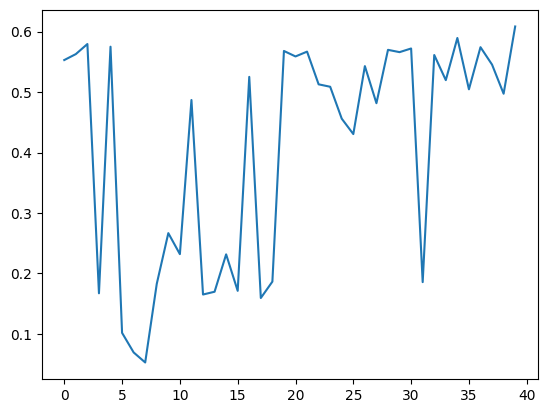

[PPO] Epoch 0: Loss=85.4142, Policy=0.0075, Value=170.8826
[PPO] Epoch 10: Loss=37.8107, Policy=-0.0108, Value=75.7091
[PPO] Epoch 20: Loss=23.4573, Policy=-0.0312, Value=47.0436
[PPO] Epoch 30: Loss=13.9388, Policy=-0.0460, Value=28.0359
Approx KL Learned: 0.04759887978434563
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 11/100 — steps: 2048


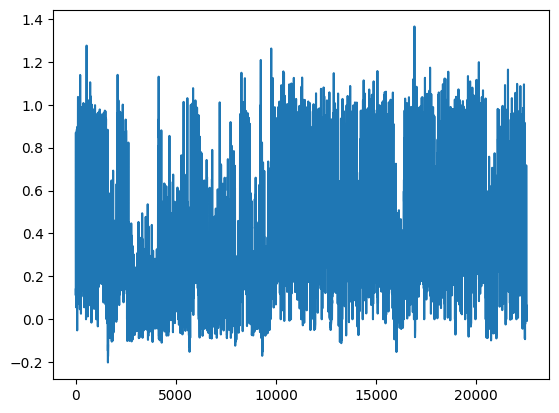

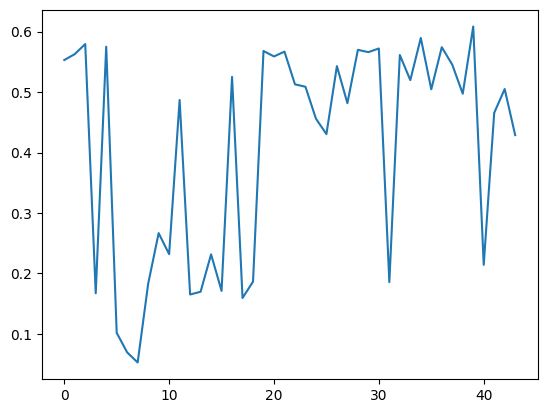

[PPO] Epoch 0: Loss=67.8909, Policy=0.0234, Value=135.7788
[PPO] Epoch 10: Loss=32.2581, Policy=0.0012, Value=64.5533
[PPO] Epoch 20: Loss=17.9830, Policy=-0.0261, Value=36.0628
[PPO] Epoch 30: Loss=13.5427, Policy=-0.0379, Value=27.2057
Approx KL Learned: 0.09436649084091187
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 12/100 — steps: 2048


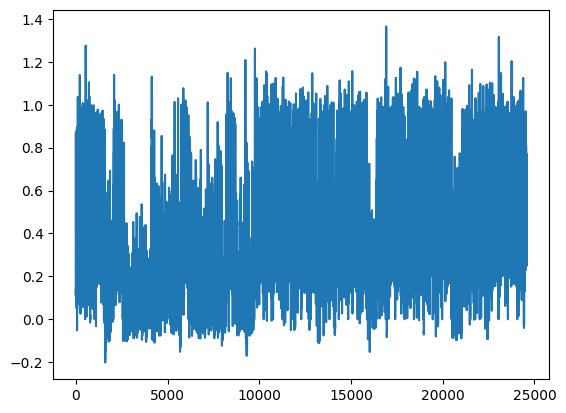

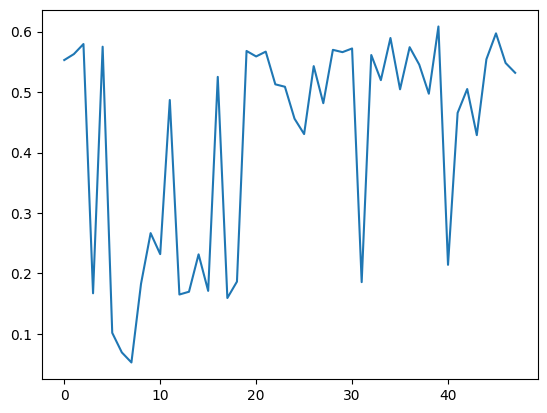

[PPO] Epoch 0: Loss=137.4070, Policy=0.0063, Value=274.9008
[PPO] Epoch 10: Loss=71.3544, Policy=-0.0003, Value=142.8084
[PPO] Epoch 20: Loss=34.5952, Policy=-0.0175, Value=69.3238
[PPO] Epoch 30: Loss=31.2920, Policy=-0.0352, Value=62.7493
Approx KL Learned: 0.027527639642357826
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 13/100 — steps: 2048


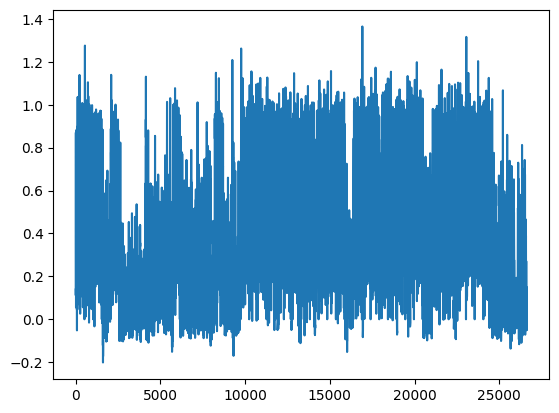

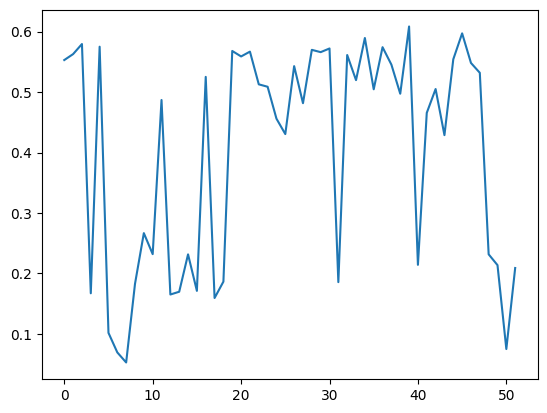

[PPO] Epoch 0: Loss=99.9047, Policy=0.0152, Value=199.8522
[PPO] Epoch 10: Loss=30.3247, Policy=-0.0065, Value=60.7339
[PPO] Epoch 20: Loss=16.0477, Policy=-0.0325, Value=32.2301
[PPO] Epoch 30: Loss=7.5979, Policy=-0.0641, Value=15.3918
Approx KL Learned: 0.07055783271789551
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 14/100 — steps: 2048


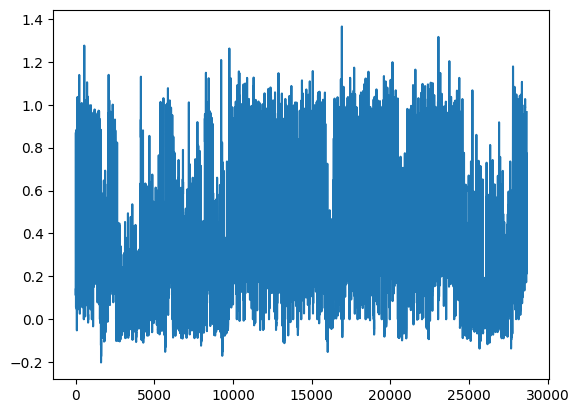

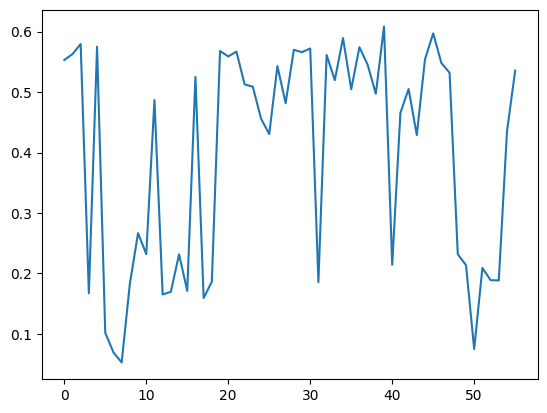

[PPO] Epoch 0: Loss=74.2911, Policy=0.0158, Value=148.5963
[PPO] Epoch 10: Loss=24.2394, Policy=0.0024, Value=48.5170
[PPO] Epoch 20: Loss=12.3052, Policy=-0.0305, Value=24.7164
[PPO] Epoch 30: Loss=5.3260, Policy=-0.0541, Value=10.8024
Approx KL Learned: 0.07560886442661285
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 15/100 — steps: 2048


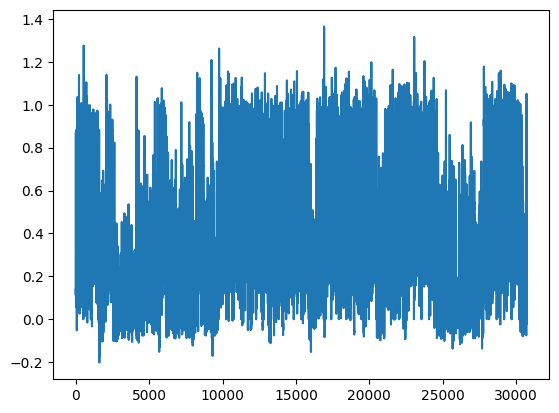

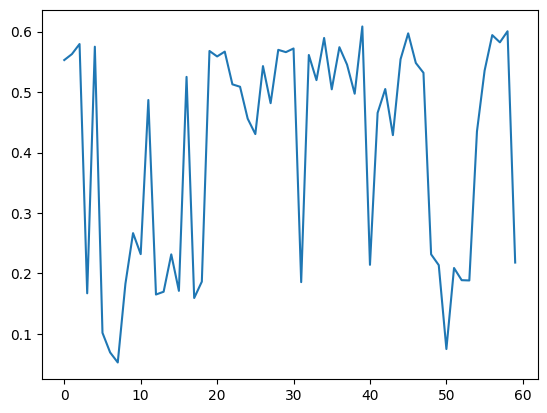

[PPO] Epoch 0: Loss=99.5007, Policy=0.0175, Value=199.0437
[PPO] Epoch 10: Loss=51.2556, Policy=0.0161, Value=102.5555
[PPO] Epoch 20: Loss=28.4018, Policy=-0.0135, Value=56.9118
[PPO] Epoch 30: Loss=18.2535, Policy=-0.0387, Value=36.6624
Approx KL Learned: 0.07141362130641937
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 16/100 — steps: 2048


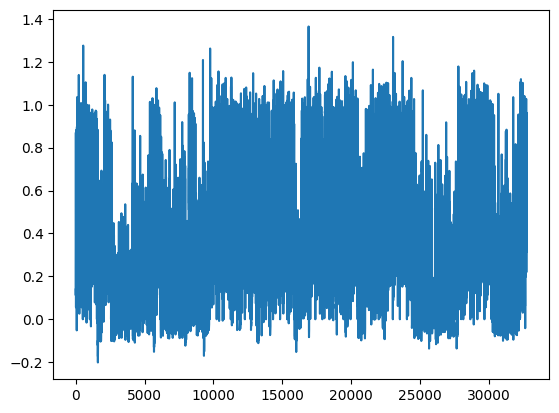

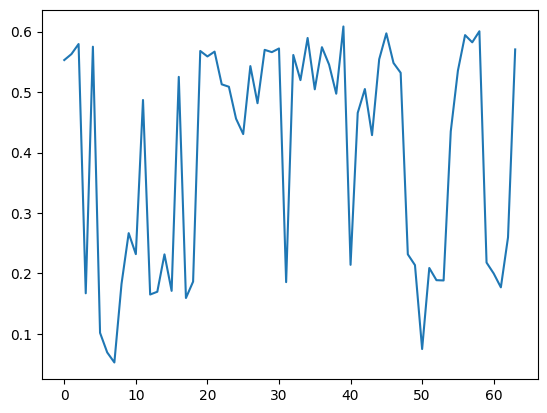

[PPO] Epoch 0: Loss=101.2782, Policy=0.0195, Value=202.5395
[PPO] Epoch 10: Loss=35.3122, Policy=0.0102, Value=70.6260
[PPO] Epoch 20: Loss=20.6400, Policy=-0.0128, Value=41.3399
[PPO] Epoch 30: Loss=10.2932, Policy=-0.0219, Value=20.6728
Approx KL Learned: 0.18926341831684113
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 17/100 — steps: 2048


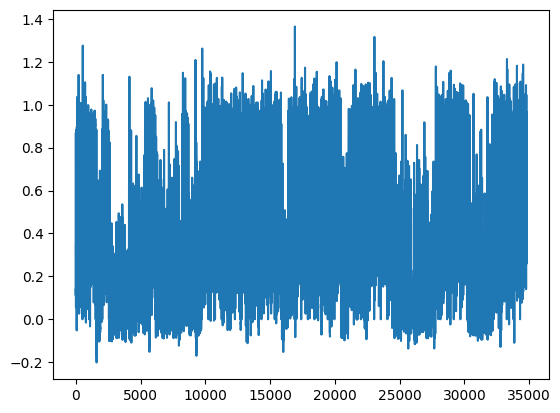

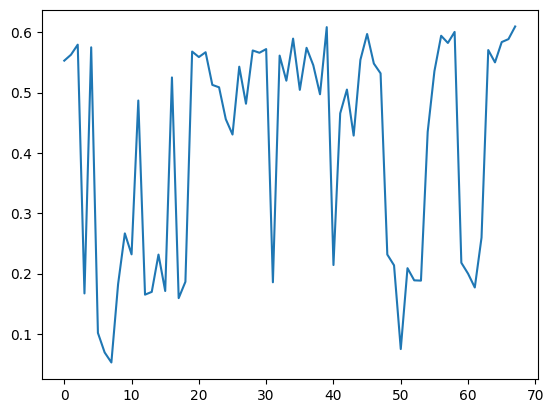

[PPO] Epoch 0: Loss=125.1981, Policy=0.0150, Value=250.4429
[PPO] Epoch 10: Loss=51.4357, Policy=0.0193, Value=102.9107
[PPO] Epoch 20: Loss=24.4931, Policy=-0.0243, Value=49.1127
[PPO] Epoch 30: Loss=12.9927, Policy=-0.0386, Value=26.1442
Approx KL Learned: 0.09935830533504486
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 18/100 — steps: 2048


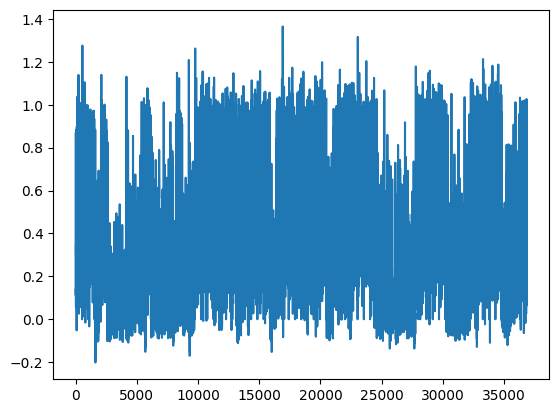

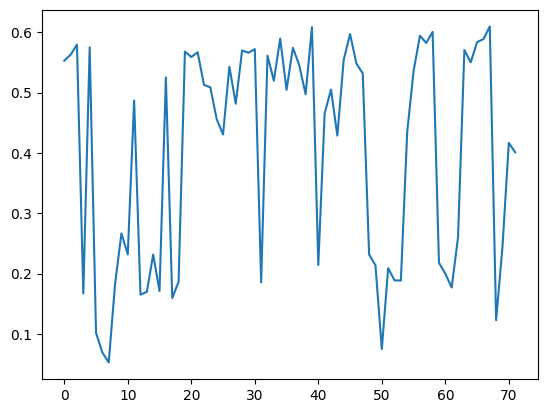

[PPO] Epoch 0: Loss=92.3569, Policy=0.0088, Value=184.7599
[PPO] Epoch 10: Loss=42.0963, Policy=-0.0051, Value=84.2636
[PPO] Epoch 20: Loss=23.7494, Policy=-0.0220, Value=47.6021
[PPO] Epoch 30: Loss=12.9891, Policy=-0.0421, Value=26.1217
Approx KL Learned: 0.038148850202560425
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 19/100 — steps: 2048


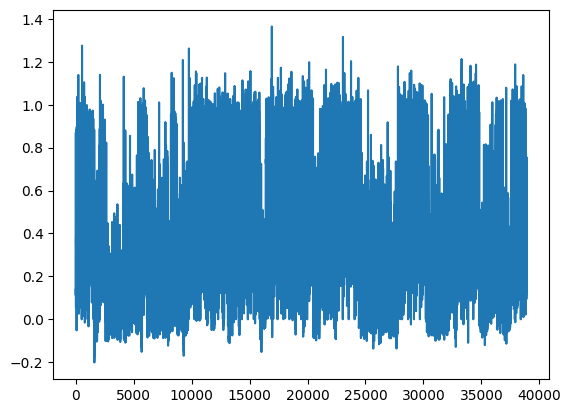

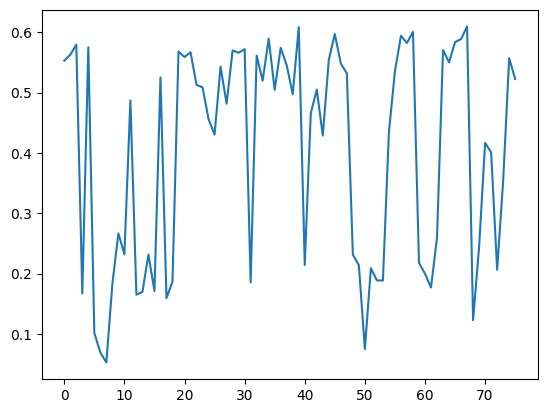

[PPO] Epoch 0: Loss=98.2755, Policy=0.0055, Value=196.5950
[PPO] Epoch 10: Loss=31.5976, Policy=-0.0056, Value=63.2594
[PPO] Epoch 20: Loss=19.7369, Policy=-0.0297, Value=39.5866
[PPO] Epoch 30: Loss=12.2691, Policy=-0.0438, Value=24.6804
Approx KL Learned: 0.05399185046553612
[✅] Actor-Critic checkpoint saved to chkpoint_19.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 20/100 — steps: 2048


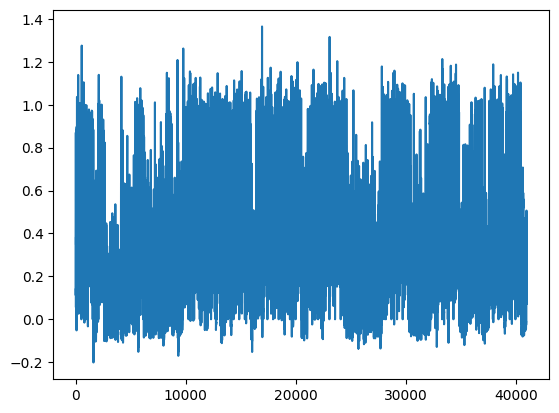

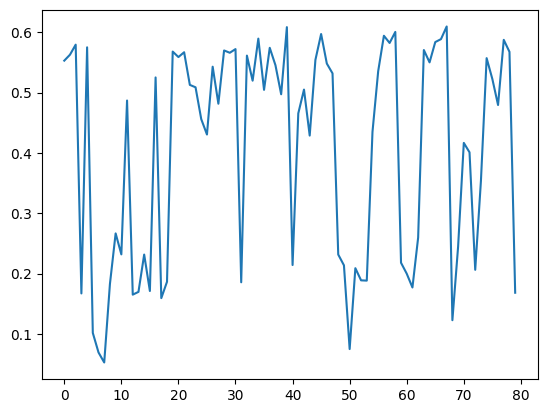

[PPO] Epoch 0: Loss=73.3421, Policy=0.0106, Value=146.6986
[PPO] Epoch 10: Loss=28.9853, Policy=-0.0035, Value=58.0151
[PPO] Epoch 20: Loss=16.0031, Policy=-0.0198, Value=32.0874
[PPO] Epoch 30: Loss=10.5490, Policy=-0.0287, Value=21.2062
Approx KL Learned: 0.08354903757572174
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 21/100 — steps: 2048


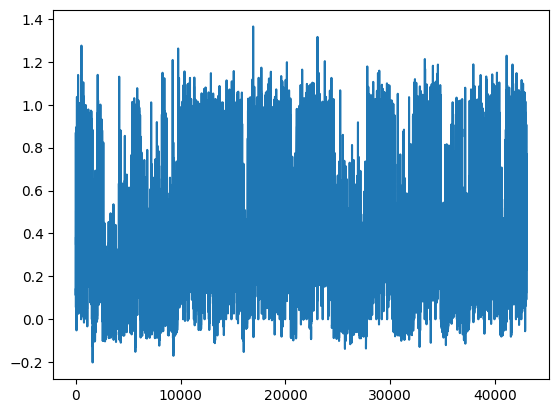

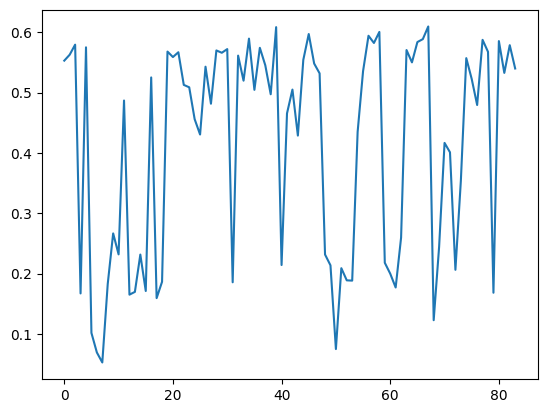

[PPO] Epoch 0: Loss=124.6062, Policy=0.0134, Value=249.2467
[PPO] Epoch 10: Loss=47.6075, Policy=-0.0054, Value=95.2822
[PPO] Epoch 20: Loss=28.0017, Policy=-0.0213, Value=56.1095
[PPO] Epoch 30: Loss=17.5199, Policy=-0.0309, Value=35.1656
Approx KL Learned: 0.15578165650367737
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 22/100 — steps: 2048


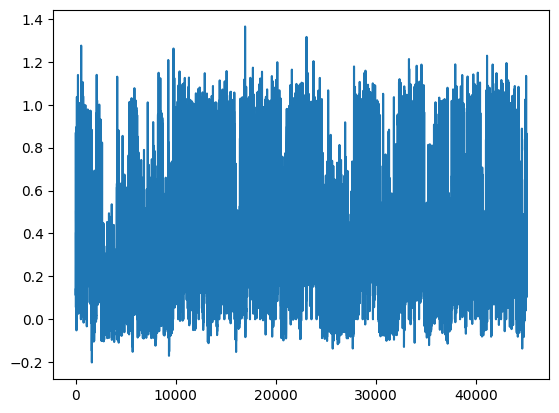

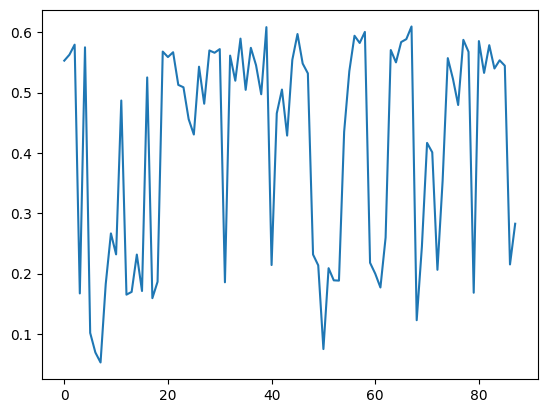

[PPO] Epoch 0: Loss=55.8482, Policy=0.0189, Value=111.6990
[PPO] Epoch 10: Loss=22.5364, Policy=0.0022, Value=45.1131
[PPO] Epoch 20: Loss=11.9368, Policy=-0.0282, Value=23.9766
[PPO] Epoch 30: Loss=12.7988, Policy=-0.0341, Value=25.7102
Approx KL Learned: 0.10570017248392105
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 23/100 — steps: 2048


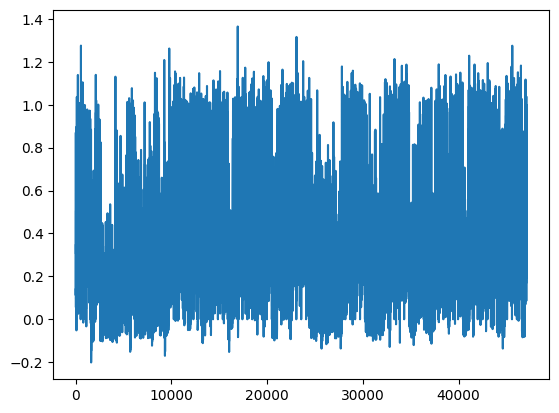

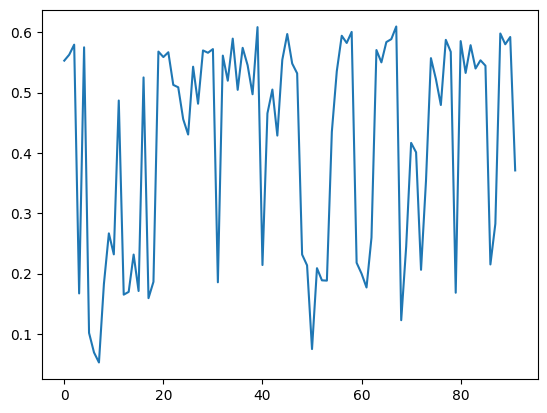

[PPO] Epoch 0: Loss=33.1066, Policy=0.0120, Value=66.2283
[PPO] Epoch 10: Loss=18.4110, Policy=0.0018, Value=36.8537
[PPO] Epoch 20: Loss=11.7801, Policy=-0.0195, Value=23.6396
[PPO] Epoch 30: Loss=7.4449, Policy=-0.0349, Value=15.0013
Approx KL Learned: 0.07244516909122467
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 24/100 — steps: 2048


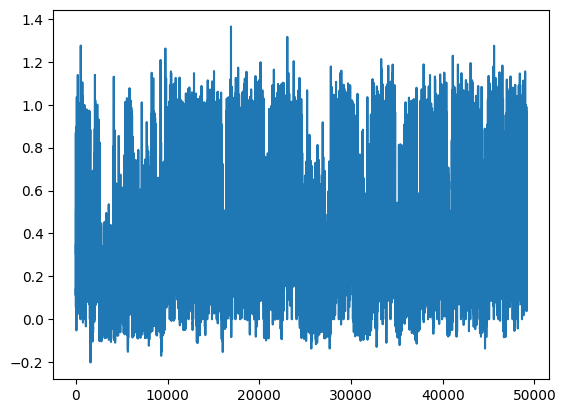

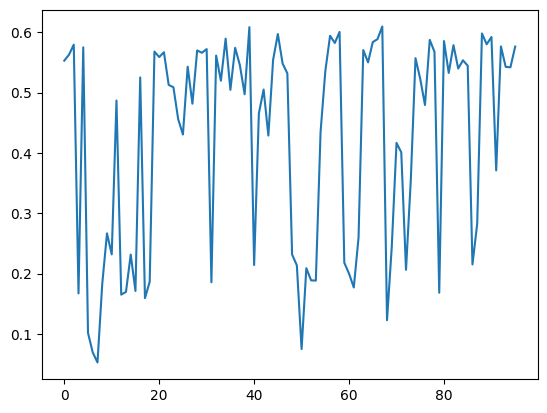

KeyboardInterrupt: 

In [12]:
buf, rewards = train(controller, "clip_actor_critic_checkpoint_long_training.pt", ppo, clip_env, clip_actor_critic, 100)

In [8]:
from rl import load_actor_critic

load_actor_critic(clip_actor_critic, "chkpoint_99.pt")

[🔁] Actor-Critic checkpoint loaded from chkpoint_99.pt


In [11]:
from cons import ACTIONS
from collections import deque
import matplotlib.pyplot as plt
import numpy as np
from typing import Callable
import imageio


def inference(get_distribution: Callable[[torch.Tensor, ActorCritic], torch.distributions.Categorical], init_position: dict[str, float], env: Env, actor_critic: ActorCritic, plot=True):
    n = 256
    n_row = 32
    positions = []

    plt.figure(figsize=(n // n_row * 2, n_row * 2))
    event = teleport(controller, init_position)
    episode_seq = deque(maxlen=EPISODE_STEPS)
    actions_seq = deque(maxlen=EPISODE_STEPS)
    raw_obs = []
    for t in range(1, n + 1):
        positions.append([event.metadata["agent"]["position"]["x"], event.metadata["agent"]["position"]["z"]])
        with torch.no_grad():
            obs_t = ppo.obs_from_event(event)  # (C,H,W)
            obs_t_encoded = actor_critic.actor_critic_encoder(obs_t.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0)
            obs_seq = torch.stack(list(episode_seq) + [obs_t_encoded], dim=0).to(device=DEVICE)

        if len(actions_seq) == 0:
            actions_seq.append(torch.randint(0, NUM_ACTIONS, (1, 1)).item())
        
        actions_tensor = torch.tensor(actions_seq, dtype=torch.long, device=DEVICE).unsqueeze(0)
        dist = get_distribution(obs_seq, actions_tensor, actor_critic)
        action_idx = dist.sample()
        logp = dist.log_prob(action_idx)
        
        action_idx, logp = action_idx.item(), logp.item()
        event, reward = env.step_env(controller, action_idx)

        # store one step
        episode_seq.append(obs_t_encoded)
        actions_seq.append(action_idx)
        raw_obs.append(obs_t)
        
        if plot:
            # Plot frame and action
            plt.subplot(n_row, n // n_row, t)
            plt.title("action: " + ACTIONS[action_idx] + ", r: " + f"{reward:.2f}" + "\n, prob = " + f"{torch.exp(dist.log_prob(torch.tensor([0, 1, 2], device=DEVICE))).cpu().numpy()}", fontsize=5)
            plt.axis(False)
            plt.imshow(event.frame)
    if plot:
        plt.tight_layout()
        plt.show()
        
        # ---- Plot 2D trajectory of the agent ----
        positions = np.array(positions)
        plt.figure(figsize=(4, 4))
        plt.plot(positions[:, 0], positions[:, 1], "-o", markersize=3)
        plt.xlabel("x")
        plt.ylabel("z")
        plt.title("Agent trajectory over n steps")
        plt.grid(True)
        plt.show()

    return raw_obs

def inference_video_mp4(
    get_distribution,
    init_position: dict[str, float],
    env: Env,
    actor_critic: ActorCritic,
    video_path="rollout.mp4",
    fps=10,
    n_steps=256
):
    episode_seq = deque(maxlen=EPISODE_STEPS)
    actions_seq = deque(maxlen=EPISODE_STEPS)

    writer = imageio.get_writer(video_path, fps=fps)

    # start episode
    event = teleport(controller, init_position)
    positions = []

    for t in range(1, n_steps + 1):

        # ---- Add current frame to video ----
        writer.append_data(event.frame)   # convert RGB→BGR if needed

        # track positions
        positions.append([
            event.metadata["agent"]["position"]["x"],
            event.metadata["agent"]["position"]["z"],
        ])

        with torch.no_grad():
            obs_t = ppo.obs_from_event(event)  
            obs_enc = actor_critic.actor_critic_encoder(
                obs_t.unsqueeze(0).unsqueeze(0)
            ).squeeze(0).squeeze(0)

            obs_seq = torch.stack(
                list(episode_seq) + [obs_enc], dim=0
            ).to(DEVICE)

        # ---- Action ----
        if len(actions_seq) == 0:
            actions_seq.append(torch.randint(0, NUM_ACTIONS, ()).item())

        actions_tensor = torch.tensor(
            actions_seq, dtype=torch.long, device=DEVICE
        ).unsqueeze(0)

        dist = get_distribution(obs_seq, actions_tensor, actor_critic)
        action_idx = dist.sample().item()

        # ---- Step env ----
        event, reward = env.step_env(controller, action_idx)

        # ---- Store ----
        episode_seq.append(obs_enc)
        actions_seq.append(action_idx)

    writer.close()
    print(f"[🎞️] Saved video to {video_path}")

    return positions


def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
    logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
    dist = torch.distributions.Categorical(logits=logits)
    return dist

event = teleport(controller)
init_pos = event.metadata["agent"]["position"]
inference_video_mp4(get_distributions, init_pos, clip_env, clip_actor_critic)

[🎞️] Saved video to rollout.mp4


[[0.8798109292984009, 5.010735034942627],
 [0.8798109292984009, 5.010735034942627],
 [0.8798109292984009, 5.010735034942627],
 [0.8798109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.6298109292984009, 5.010735034942627],
 [0.7548109292984009, 4.794228553771973],
 [0.8798109292984009, 4.577722072601318],
 [0.8798109292984009, 4.577722072601318],
 [1.0963172912597656, 4.452722072601318],
 [1.3128236532211304, 4.327722072601318],
 [1.5293300151824951, 4.202722072601318],
 [1.5293300151824951, 4.202722072601318],
 [1.7793300151824951, 4.202722072601318],
 [1.7793300151824951, 4.202722072601318],
 [1.9958363771438599, 4.077722072601318],
 [1.9958363771438599, 4.0777220726

In [34]:
!pip install imageio imageio-ffmpeg

In [22]:
import clip

model, preprocess = clip.load("ViT-B/32", device=DEVICE)

In [23]:
import torch
import torch.nn.functional as F
import random

def preprocess_clip(x):
    # Resize to CLIP resolution
    x = F.interpolate(x, size=(224, 224), mode="bilinear", align_corners=False)
    # Normalize (CLIP standard mean/std)
    mean = torch.tensor([0.48145466, 0.4578275, 0.40821073], device=x.device).view(1, 3, 1, 1)
    std  = torch.tensor([0.26862954, 0.26130258, 0.27577711], device=x.device).view(1, 3, 1, 1)
    return (x - mean) / std

def get_average(input_img):
    # ---- 1. Sample 50 random images ----
    n = min(50, len(input_img))
    indices = random.sample(range(len(input_img)), n)
    imgs = torch.stack([input_img[i] for i in indices]).to(DEVICE)  # (50, 3, H, W)

    # ---- 2. Preprocess for CLIP ----
    imgs_clip = preprocess_clip(imgs).half()  # normalized, resized

    # ---- 3. Encode with CLIP visual encoder ----
    with torch.no_grad():
        embeds = model.visual(imgs_clip)       # (50, D)
        embeds = embeds / embeds.norm(dim=-1, keepdim=True)  # normalize to unit sphere

    # ---- 4. Compute cosine similarity ----
    sim_matrix = embeds @ embeds.T             # (50, 50)
    # Optional: remove self-similarity (diagonal = 1)
    sim_matrix.fill_diagonal_(0)

    # ---- 5. Summary statistics ----
    mean_sim = sim_matrix.mean().item()

    return mean_sim

for i in range(5):

    event = teleport(controller)
    init_pos = event.metadata["agent"]["position"]
    
    def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
        logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
        dist = torch.distributions.Categorical(logits=logits)
        return dist

    policy = inference(get_distributions, init_pos, clip_env, clip_actor_critic, False)

    def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
        dist = torch.distributions.Categorical(probs=torch.tensor([0.5, 0.25, 0.25], device=DEVICE))
        return dist

    rand_policy = inference(get_distributions, init_pos, clip_env, clip_actor_critic, False)

    mean_policies = []
    mean_rands = []
    for i in range(10):
        mean_policy = get_average(policy)
        mean_rand = get_average(rand_policy)
        mean_policies.append(mean_policy)
        mean_rands.append(mean_rand)
    
    print("Policy: " + str(np.mean(np.array(mean_policies))))
    print("Rand: " + str(np.mean(np.array(mean_rands))))



Policy: 0.877001953125
Rand: 0.86337890625
Policy: 0.87021484375
Rand: 0.8068359375
Policy: 0.83388671875
Rand: 0.845361328125
Policy: 0.8791015625
Rand: 0.876318359375
Policy: 0.80693359375
Rand: 0.79033203125


<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>